<a id="Section2"></a>

# Projet 4 - Anticipez les besoins en consommation électrique de bâtiments - Part 2 de 2

# 1. Récapitulation

## 1.1 Les Objectifs


#### 1. Prédire les émissions des bâtiments en se basent sur les données déclaratives du permis d'exploitation commerciale

#### 2. Evaluer l’intérêt de l’"ENERGY STAR Score" pour la prédiction des émissions

## 1.2 Les Données

* Les données originales viennent de :
https://www.kaggle.com/city-of-seattle/sea-building-energy-benchmarking#2015-building-energy-benchmarking.csv

* Un nettoyage des données était fait dans un première notebook. Les données sont importer à partir de cet nettoyage.

# 2. Les Imports

<a id="Section2.1"></a>

### 2.1 Les Bibliothèques et Styles

In [1]:
#imports: regular expresssions, operating system, math operations
#import re,os,math
import re, os, random
from math import sin, cos, sqrt, atan2, radians
from ast import literal_eval

#data modules
import numpy as np
import pandas as pd
import scipy as sp

#graphic modules
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import validation_curve
from sklearn.model_selection import learning_curve
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold, cross_validate

from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

from sklearn.metrics import confusion_matrix
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error, mean_absolute_percentage_error

from sklearn.preprocessing import FunctionTransformer, QuantileTransformer
from sklearn.preprocessing import OneHotEncoder

from sklearn.pipeline import Pipeline

from sklearn.decomposition import PCA

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR, LinearSVR
from sklearn.neighbors import KNeighborsRegressor
from sklearn.dummy import DummyRegressor

from sklearn.compose import TransformedTargetRegressor
from sklearn import metrics
from sklearn.pipeline import make_pipeline

In [3]:
sns.set() #sets the theme of seaborn
#creates static png images of the plots within the notebook (other option: 'notebook' for interactive plots)
%matplotlib inline 

In [4]:
%%html
<style>
    table {
        display: inline-block
    }
</style>

<a id="Section2.2"></a>

### 2.2 Les Données

#### 2.2.1 Télécharge les données

In [5]:
PATH_TO_DATA = os.getcwd()
filename = 'BuildingsEnergyBenchmarkingCombinedCleaned'
dataset = pd.read_csv(PATH_TO_DATA + '\\' + filename)

In [6]:
dataset.head()

,Unnamed: 0,OSEBuildingID,BuildingType,PrimaryPropertyType,PropertyName,Address,City,State,ZipCode,CouncilDistrictCode,...,GFAperBuilding,ENERGYSTARScore,SiteEUI(kBtu/sf),SiteEnergyUse(kBtu),SteamUse(kBtu),Electricity(kBtu),NaturalGas(kBtu),EnergyUseDifference(kBtu),TotalGHGEmissions,GHGEmissionsIntensity
0,0,1,NonResidential,Hotel,Mayflower Park Hotel,405 OLIVE WAY,Seattle,WA,98101.0,7,...,88434.0,62.5,80.299998,7103895.25,2013457.00,3816093.5,1274420.5,-75.75,249.705,2.735
1,1,2,NonResidential,Hotel,Paramount Hotel,724 PINE STREET,Seattle,WA,98101.0,7,...,88502.0,56.0,94.600002,8371084.00,0.00,3574131.0,4797033.5,-80.50,279.685,2.620
2,2,3,NonResidential,Hotel,5673-The Westin Seattle,1900 5TH AVENUE,Seattle,WA,98101.0,7,...,759392.0,43.0,96.000000,72587024.00,21566554.00,49526664.0,1493800.0,6.00,2089.280,2.190
3,3,5,NonResidential,Hotel,Hotel Max,620 STEWART ST,Seattle,WA,98101.0,7,...,61320.0,56.0,110.800003,6794584.00,2214446.25,2768924.0,1811213.0,0.75,286.430,4.670
4,4,9,NonResidential,Other,West Precinct,810 VIRGINIA ST,Seattle,WA,98101.0,7,...,60090.0,NaN,135.900003,12069300.00,0.00,7321219.0,4748232.5,-151.50,303.215,2.955


In [7]:
dataset.drop(columns = ('Unnamed: 0'), inplace = True)
dataset.shape

(1539, 58)

In [8]:
dataset.columns

Index(['OSEBuildingID', 'BuildingType', 'PrimaryPropertyType', 'PropertyName',
       'Address', 'City', 'State', 'ZipCode', 'CouncilDistrictCode',
       'Neighborhood', 'ListOfAllPropertyUseTypes', 'LargestPropertyUseType',
       'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType',
       'DecadeBuilt', 'LargestPropertyUseTypeGr1',
       'SecondLargestPropertyUseTypeGr1', 'ThirdLargestPropertyUseTypeGr1',
       'Latitude', 'Longitude', 'EastWestDistance', 'NorthSouthDistance',
       'CenterDistance', 'DataYear', 'YearBuilt', 'BuildingAge',
       'NumberofBuildings', 'NumberofFloors', 'PropertyGFATotal',
       'PropertyGFAParking', 'PropertyGFABuilding(s)',
       'NumberofPropertyUseTypes', 'LargestPropertyUseTypeGFA',
       'SecondLargestPropertyUseTypeGFA', 'ThirdLargestPropertyUseTypeGFA',
       'LargestPropertyUseTypeGFAFrac', 'SecondLargestPropertyUseTypeGFAFrac',
       'ThirdLargestPropertyUseTypeGFAFrac', 'ParkingPropertyUseTypeGFA',
       'BuildingProperty

<a id="Section3"></a>

# 3. Les Généralités et Fonctions

<a id="Section3.1"></a>

## 3.1 Variables Target

In [9]:
targets = ['SiteEnergyUse(kBtu)', 'TotalGHGEmissions']

<a id="Section3.2"></a>

## 3.2 Conditions pour le Train/Test dévision

In [10]:
test_size = 0.2
seed = 33
cv = KFold(n_splits=5, shuffle = True, random_state = 20)
train_sizes=np.linspace(0.3, 1.0, 7)
train_sizes1=np.linspace(0.3, 1.0, 5)

<a id="Section3.3"></a>

## 3.3 Le Prétraitement

### 3.3.1 Feature Engineering

In [11]:
def onehot_encode_feature(data, feature, drop = None):
    X = data[[feature]]
    enc = OneHotEncoder()
    enc_ft = enc.fit_transform(X)
    df = pd.DataFrame(enc_ft.toarray(), 
                        columns = [s.replace(feature, '').lstrip('_') for s in enc.get_feature_names([feature])])
    if drop != None:
        if isinstance(drop, str) :
            df = df.drop(columns = [drop])
        elif isinstance(drop, list) :
            df = df.drop(columns = drop)
    return df

In [12]:
def frachot_encode_feature(data, feature, feature_frac, drop = None):
    X = data[[feature, feature_frac]]
    enc = OneHotEncoder()
    enc_ft = enc.fit_transform(X[[feature]])
    df = pd.DataFrame(enc_ft.toarray(), 
                        columns = [s.replace(feature, '').lstrip('_') for s in enc.get_feature_names([feature])])
    
    df_out = pd.DataFrame(np.transpose([np.where(X[feature] == f, X[feature_frac], 0) for f in df.columns]),
                          columns = df.columns)
    if drop != None:
        if isinstance(drop, str) :
            df_out = df_out.drop(columns = [drop])
        elif isinstance(drop, list) :
            df_out = df_out.drop(columns = drop)
    return df_out

### 3.3.2 Transformers Personnalisés

In [13]:
logscale_transformer = FunctionTransformer(np.log, inverse_func = np.exp, check_inverse = True)
log1pscale_transformer = FunctionTransformer(np.log1p, inverse_func = np.expm1, check_inverse = True)

### 3.3.3 Création des Préprocesseurs

In [14]:
def create_preprocessor_X(logscale_features = [], standardscale_features = [], log1pscale_features = []) :

    preprocessor_X = ColumnTransformer(transformers = [  
                                                         ('logscale', Pipeline([('log', logscale_transformer),
                                                                                ('standard', StandardScaler())]), 
                                                                      logscale_features),
                                                         ('log1pscale', Pipeline([('log1p', log1pscale_transformer),
                                                                                  ('standard', StandardScaler())]), 
                                                                      log1pscale_features),
                                                         ('standardscale', StandardScaler(), standardscale_features),
                                                        ], remainder = 'passthrough')
    return preprocessor_X

In [15]:
def create_preprocessor_y(scale = 'standard') :

    if scale == 'log' :
        preprocessor_y = Pipeline([('log', logscale_transformer), 
                                   ('standard', StandardScaler())])
    elif scale == 'log1p' :
        preprocessor_y = Pipeline([('log1p', log1pscale_transformer), 
                                   ('standard', StandardScaler())])
    else :
        preprocessor_y = StandardScaler()
    return preprocessor_y

<a id="Section3.4"></a>

## 3.4 Création du Pipeline

In [16]:
def build_complete_model(model, preprocessor_X, preprocessor_y, pca = False):
    
    if not pca:
        steps = [
                 ('preprocessor', preprocessor_X),
                 ('model', TransformedTargetRegressor(regressor = model, transformer = preprocessor_y)),
                ]
    else:
        steps = [
                 ('preprocessor', preprocessor_X),
                 ('pca', PCA()),
                 ('model', TransformedTargetRegressor(regressor = model, transformer = preprocessor_y)),
                ]

    return Pipeline(steps)

<a id="Section3.5"></a>

## 3.5 L' Evaluation

### 3.5.1 Les Métrics

In [17]:
scoring_tple = ('r2','neg_mean_absolute_error', 'neg_root_mean_squared_error', 'neg_mean_absolute_percentage_error')
scoring = 'r2'

### 3.5.2 L'Evaluation de l'Entraînement

In [18]:
def cv_evaluation(X_train, y_train, pipeline, cv=None, scoring_tple= None):
    
    cross = cross_validate(pipeline, X_train, y_train, cv = cv, scoring = scoring_tple, 
                           return_train_score = True)  

    test_scoring_dict ={}
    train_scoring_dict = {}
    for i in scoring_tple :
        test_scoring_dict[i] = (cross["test_" + i].mean(), 
                                cross["test_" + i].std())
        train_scoring_dict[i] = (cross["train_" + i].mean(), 
                                 cross["train_" + i].std())
        
    train_time = (cross["fit_time"].mean(),
                  cross["fit_time"].std())
    
    eval_dict = {'estimator' : pipeline,
                 'eval_method' : 'cross',
                 'best_grid_params' : None,
                 'train_scores' : train_scoring_dict, 
                 'test_scores' : test_scoring_dict, 
                 'train_time' : train_time }
    
    return eval_dict

In [19]:
def gridsearch_evaluation(X_train, y_train, pipeline, param_grid, cv = None, 
                          scoring_tple = None, refit = 'r2') :
    
    grid = GridSearchCV(pipeline, param_grid, cv = cv, 
                        scoring = scoring_tple,
                        return_train_score = True, refit=refit,)
    grid.fit(X_train, np.ravel((y_train)))
    
    eval_dict = {}
    test_scoring_dict ={}
    train_scoring_dict = {}
    if refit :
        for i in scoring_tple :
            test_scoring_dict[i] = (grid.cv_results_["mean_test_" + i][grid.best_index_], 
                                    grid.cv_results_["std_test_" + i][grid.best_index_])
            train_scoring_dict[i] = (grid.cv_results_["mean_train_" + i][grid.best_index_], 
                                     grid.cv_results_["std_train_" + i][grid.best_index_])

        train_time = (grid.cv_results_["mean_fit_time"][grid.best_index_],
                      grid.cv_results_["std_fit_time"][grid.best_index_])

        eval_dict = {'estimator' : grid.best_estimator_,
                     'eval_method' : 'grid',
                     'best_grid_params' : grid.best_params_,
                     'train_scores' : train_scoring_dict, 
                     'test_scores' : test_scoring_dict, 
                     'train_time' : train_time }

    return eval_dict

In [20]:
def output_evaluation(model_name, targets = targets):
    ''' Function that outputs/prints the information from the dictionnary that collects the data from 
    the cross_validate or gridseach'''
    print(f"Model: {model_name}")
    print(50*"_")
    for target in targets :
        key = '_'.join([model_name, target])
        print()
        print(f"Variable Target: {target}")
        print(50*"-")
        if model_dict[key]['eval_method'] == 'grid' :
            print("Les meilleurs parameters sont:")
            print(model_dict[key]['best_grid_params'])
            print()
        for (k1, l1), (k2, l2) in zip(model_dict[key]['train_scores'].items(), model_dict[key]['test_scores'].items()) :
            print(f"Le metric {k1} donne :")
            print(f"{l1[0]: .2f} +/- {l1[1]: .2f} pour le train sets")
            print(f"{l2[0]: .2f} +/- {l2[1]: .2f} pour le test sets")
            print(f"test score / train score :{(l1[0]/l2[0]) : 0.2f}")
            print()
        print(f"Le temps d'entrainement est {(1000 * model_dict[key]['train_time'][0]): .2f} +/-" + \
                                          f"{(1000 * model_dict[key]['train_time'][1]): .2f} ms.")
        print(50*"_")

### 3.5.3 La Courbe d'Apprentissage

In [21]:
#taken from sklearn website - an example de learning curve
def plot_learning_curve(
    estimator,
    title,
    X,
    y,
    axes=None,
    ylim=None,
    cv=None,
    n_jobs=None,
    train_sizes=np.linspace(0.1, 1.0, 5),
    scoring = None
):
    """
    Generate 3 plots: the test and training learning curve, the training
    samples vs fit times curve, the fit times vs score curve.

    Parameters
    ----------
    estimator : estimator instance
        An estimator instance implementing `fit` and `predict` methods which
        will be cloned for each validation.

    title : str
        Title for the chart.

    X : array-like of shape (n_samples, n_features)
        Training vector, where ``n_samples`` is the number of samples and
        ``n_features`` is the number of features.

    y : array-like of shape (n_samples) or (n_samples, n_features)
        Target relative to ``X`` for classification or regression;
        None for unsupervised learning.

    axes : array-like of shape (3,), default=None
        Axes to use for plotting the curves.

    ylim : tuple of shape (2,), default=None
        Defines minimum and maximum y-values plotted, e.g. (ymin, ymax).

    cv : int, cross-validation generator or an iterable, default=None
        Determines the cross-validation splitting strategy.
        Possible inputs for cv are:

          - None, to use the default 5-fold cross-validation,
          - integer, to specify the number of folds.
          - :term:`CV splitter`,
          - An iterable yielding (train, test) splits as arrays of indices.

        For integer/None inputs, if ``y`` is binary or multiclass,
        :class:`StratifiedKFold` used. If the estimator is not a classifier
        or if ``y`` is neither binary nor multiclass, :class:`KFold` is used.

        Refer :ref:`User Guide <cross_validation>` for the various
        cross-validators that can be used here.

    n_jobs : int or None, default=None
        Number of jobs to run in parallel.
        ``None`` means 1 unless in a :obj:`joblib.parallel_backend` context.
        ``-1`` means using all processors. See :term:`Glossary <n_jobs>`
        for more details.

    train_sizes : array-like of shape (n_ticks,)
        Relative or absolute numbers of training examples that will be used to
        generate the learning curve. If the ``dtype`` is float, it is regarded
        as a fraction of the maximum size of the training set (that is
        determined by the selected validation method), i.e. it has to be within
        (0, 1]. Otherwise it is interpreted as absolute sizes of the training
        sets. Note that for classification the number of samples usually have
        to be big enough to contain at least one sample from each class.
        (default: np.linspace(0.1, 1.0, 5))
    """
    if axes is None:
        _, axes = plt.subplots(1, 3, figsize=(20, 5))

    axes[0].set_title(title)
    if ylim is not None:
        axes[0].set_ylim(*ylim)
    axes[0].set_xlabel("Training examples")
    if scoring != None :
        axes[0].set_ylabel("Score - " + str(scoring))
    else :
        axes[0].set_ylabel("Score")

    train_sizes, train_scores, test_scores, fit_times, _ = learning_curve(
        estimator,
        X,
        y,
        cv=cv,
        n_jobs=n_jobs,
        train_sizes=train_sizes,
        return_times=True,
        scoring = scoring
    )
    train_scores_mean = np.mean(train_scores, axis=1)
    train_scores_std = np.std(train_scores, axis=1)
    test_scores_mean = np.mean(test_scores, axis=1)
    test_scores_std = np.std(test_scores, axis=1)
    fit_times_mean = np.mean(fit_times, axis=1)
    fit_times_std = np.std(fit_times, axis=1)

    # Plot learning curve
    axes[0].grid()
    axes[0].fill_between(
        train_sizes,
        train_scores_mean - train_scores_std,
        train_scores_mean + train_scores_std,
        alpha=0.1,
        color="r",
    )
    axes[0].fill_between(
        train_sizes,
        test_scores_mean - test_scores_std,
        test_scores_mean + test_scores_std,
        alpha=0.1,
        color="g",
    )
    axes[0].plot(
        train_sizes, train_scores_mean, "o-", color="r", label="Training score"
    )
    axes[0].plot(
        train_sizes, test_scores_mean, "o-", color="g", label="Cross-validation score"
    )
    axes[0].legend(loc="best")

    # Plot n_samples vs fit_times
    axes[1].grid()
    axes[1].plot(train_sizes, fit_times_mean, "o-")
    axes[1].fill_between(
        train_sizes,
        fit_times_mean - fit_times_std,
        fit_times_mean + fit_times_std,
        alpha=0.1,
    )
    axes[1].set_xlabel("Training examples")
    axes[1].set_ylabel("fit_times")
    axes[1].set_title("Scalability of the model")

    # Plot fit_time vs score
    axes[2].grid()
    axes[2].plot(fit_times_mean, test_scores_mean, "o-")
    axes[2].fill_between(
        fit_times_mean,
        test_scores_mean - test_scores_std,
        test_scores_mean + test_scores_std,
        alpha=0.1,
    )
    axes[2].set_xlabel("fit_times")
    axes[2].set_ylabel("Score")
    axes[2].set_title("Performance of the model")

    return plt

### 3.5.4 Evaluation avec le Test set

In [22]:
def test_evaluation(X_test, y_test, pipeline_fitted, scoring_tple = None) :
    y_pred = pipeline_fitted.predict(X_test)
    scoring_func_dict = {'r2': r2_score,
                         'neg_mean_absolute_error' : lambda yt, yp : -1 * mean_absolute_error(yt, yp),
                         'neg_root_mean_squared_error' : lambda yt, yp : -1 * np.sqrt(mean_squared_error(yt, yp)),
                         'neg_mean_absolute_percentage_error' : lambda yt, yp : -1 * mean_absolute_percentage_error(yt, yp)}
    
    if scoring_tple == None:
        return {'r2' : r2_score(y_test, y_pred)}
    else :
        scoring_dict = {}
        for scoring in scoring_tple:
            if scoring in scoring_func_dict.keys():
                scoring_dict[scoring] = scoring_func_dict[scoring](y_test, y_pred)
        return scoring_dict               

In [23]:
def output_test_evaluation(model_name, targets = targets):
    ''' Function that outputs/prints the information from the dictionnary that collects 
    the data from the evaluation of the models'''

    print(f"Model: {model_name}")
    print(50*"_")
    for target in targets :
        key = '_'.join([model_name, target])
        print()
        print(f"Variable Target: {target}")
        print(50*"-")
        for (k1, l1), (k2, s2) in zip(model_dict[key]['test_scores'].items(), model_dict[key]['eval_scores'].items()) :
            print(f"Le metric {k1} donne :")
            print(f"{l1[0]: .2f} pour le test du modèle (cv ou gridsearch)")
            print(f"{s2: .2f} pour l'évaluation avec le test set")
            print(f"eval score / test score :{(s2/l1[0]) : 0.2f}")
            print()
        print(50*"_")

### 3.5 Collection des Résultats

On va collectionner les modèles crés, leurs évaluations, temps d'entraînement, etc. dans une dictionnaire: **model_dict**
* la clé pour un modèle est: nom-de-modèle_nom-de-target
* 'estimator' - le modèle complèt
    * dans le cas gridsearch était utilisé, c'est le modèle avec les meilleurs hyperparametères
* 'eval_method' - le méthode utilisé pour évaluer le modèle avec le training set
    * 'grid' - grid_search était utilisé pour trouver les meilleurs hyperparamètres
    * 'cross' - cross_validate était utilisé pour évaluer la performance du modèle
* best_grid_params - les meilleurs hyperparamètres trouvés dans le cas grid_search était utilisé
* train_scores - un dictionaire qui contient un tuple avec la moyenne et la variance des scores pour les train sets du cross validation pour les différents métrics
    * les clés de ce dictionnaires sont les noms des métrics
* test_scores - un dictionaire qui contient un tuple avec la moyenne et la variance des scores pour les test sets du cross validation pour les différents métrics
    * les clés de ce dictionnaires sont les noms des métrics
* train_time - un tuple qui contient la moyenne et la variance du temps d'entraînement
* eval_scores - un dictionaire qui contient l'évaluation du modéle avec le test set des donnés mis à coté avec les différents métrics
    * les clés de ce dictionnaires sont les noms des métrics


In [24]:
model_dict = {}

In [25]:
def output_model_evaluations(model_list, targets) :   
    df_dict = {}
    for target in targets:
        df_dict[target] = pd.DataFrame(index = model_list)
        df_dict[target] = pd.DataFrame(index = model_list)

    for m in model_list:
        for i, s in enumerate(scoring_tple) :
            for target in targets :
                key = '_'.join([m, target])
                df_dict[target].loc[m, 'test_scores_'+s ] = model_dict[key]['test_scores'][s][0]
                df_dict[target].loc[m, 'eval_scores_'+s ] = model_dict[key]['eval_scores'][s]
        for target in targets:
            key = '_'.join([m, target])
            df_dict[target].loc[m, 'train_time'] = 1000* model_dict[key]['train_time'][0]

    col_replace_dict = {'test_scores' : 'train', 'eval_scores' : 'eval', 
                       'neg_mean_absolute_error' : 'nMAE',
                       'neg_root_mean_squared_error' : 'nRMSE',
                       'neg_mean_absolute_percentage_error' : 'nMAPE'}
    col_rename_dict = {}
    for col in df_dict[targets[0]].columns :
        s = col
        for k, i in col_replace_dict.items():
             s = s.replace(k, i)
        col_rename_dict[col] = s
    for target in targets :
        df_dict[target].rename(columns = col_rename_dict, inplace = True)
        df_dict[target].rename(columns = col_rename_dict, inplace = True)
    return df_dict

In [26]:
def plot_model_evaluations(data, title = None, scaling = 1, ylims = [(None, None) for i in range(6)]) :
    fig, ax = plt.subplots(3, 1, figsize=(10,12), sharex= True)
    #fig.subplots_adjust(left=0.1,right=0.9)

    xticks = range(1, len(data.index)+1)

    xlabels = data.index.values
    n = 11


    ax1, ax4, ax3 = ax[0], ax[1], ax[2]


    ax1.plot(xticks, data['train_r2'],'bo--', fillstyle = 'none', label = 'train_r2')
    ax1.plot(xticks, data['eval_r2'], 'bo-', label = 'eval_r2')
    ymin, ymax = ylims[0]
    if (ymin != None) & (ymax != None) :
        ax1.set_ylim(ymin, ymax)
        ax1.set_yticks(np.round(np.linspace(ymin, ymax, n), 2))
    ax1.set_ylabel("R2 Score")
    ax1.legend()
    ax1.set_title(title)


    ax2 = ax1.twinx()
    ax2.plot(xticks, data[['train_time']], 'kX--', label = 'train_time')
    ax2.spines['right'].set_position(("axes", 1.0))
    ymin, ymax = ylims[3]
    if (ymin != None) & (ymax != None) :
        ax2.set_ylim(ymin, ymax)
        ax2.set_yticks(np.round(np.linspace(ymin, ymax, n), 2))
    ax2.tick_params(gridOn=False)
    ax2.set_ylabel("Temps d'Entraînement (ms)", rotation = 270)
    ax2.yaxis.set_label_coords(1.1,0.5)

    ax4.plot(xticks, data['train_nMAE'].divide(scaling),'gd--', fillstyle = 'none',label = 'train_nMAE')
    ax4.plot(xticks, data['eval_nMAE'].divide(scaling),'gd-',label = 'eval_nMAE')
    ymin, ymax = ylims[1]
    if (ymin != None) & (ymax != None) :
        ax4.set_ylim(ymin, ymax)
        ax4.set_yticks(np.round(np.linspace(ymin, ymax, n), 2))
    ax4.set_ylabel(f"neg. MAE (kBtu/{scaling})")
    ax4.legend()

    ax2 = ax4.twinx()
    ax2.plot(xticks, data[['train_time']], 'kX--', label = 'train_time')
    ax2.spines['right'].set_position(("axes", 1.0))
    ymin, ymax = ylims[4]
    if (ymin != None) & (ymax != None) :
        ax2.set_ylim(ymin, ymax)
        ax2.set_yticks(np.round(np.linspace(ymin, ymax, n), 2))
    ax2.tick_params(gridOn=False)
    ax2.set_ylabel("Temps d'Entraînement (ms)", rotation = 270)
    ax2.yaxis.set_label_coords(1.1,0.5)

    ax3.plot(xticks, data['train_nRMSE'].divide(scaling),'rs--', fillstyle = 'none',label = 'train_nRMSE')
    ax3.plot(xticks, data['eval_nRMSE'].divide(scaling),'rs-',label = 'eval_nRMSE')
    ax3.spines['right'].set_position(("axes", 1.0))
    ymin, ymax = ylims[2]
    if (ymin != None) & (ymax != None) :
        ax3.set_ylim(ymin, ymax)
        ax3.set_yticks(np.round(np.linspace(ymin, ymax, n), 2))
    ax3.set_ylabel(f"neg. RMSE (kBtu/{scaling})")
    ax3.legend()

    ax2 = ax3.twinx()
    ax2.plot(xticks, data[['train_time']], 'kX--', label = 'train_time')
    ax2.spines['right'].set_position(("axes", 1.0))
    ymin, ymax = ylims[5]
    if (ymin != None) & (ymax != None) :
        ax2.set_ylim(ymin, ymax)
        ax2.set_yticks(np.round(np.linspace(ymin, ymax, n), 2))
    ax2.tick_params(gridOn=False)
    ax2.set_ylabel("Temps d'Entraînement (ms)", rotation = 270)
    ax2.yaxis.set_label_coords(1.1,0.5)

    plt.xticks(xticks, labels = xlabels)
    ax3.tick_params(axis = 'x', labelrotation = 90)

    plt.tight_layout()

<a id="Section4"></a>

# 4. Modèles - Version 0

<a id="Section4.1"></a>

## 4.1 Les Features

In [27]:
X_onehot = onehot_encode_feature(dataset, 'PrimaryPropertyType', 'Other')
onehot_features = list(X_onehot.columns.values)
logscale_features = ['PropertyGFABuilding(s)']
log1pscale_features = ['ParkingFrac']

X = pd.concat([X_onehot, dataset[logscale_features + log1pscale_features]], axis = 1)

<a id="Section4.2"></a>

## 4.2 Train/Test Dévision

In [28]:
y = dataset[targets]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, random_state = seed)

<a id="Section4.3"></a>

## 4.3 Préprocesseurs

In [29]:
preprocessor_X = create_preprocessor_X(logscale_features = logscale_features, log1pscale_features = log1pscale_features)
preprocessors_y = [create_preprocessor_y('log'), create_preprocessor_y('logp')]

<a id="Section4.4"></a>

## 4.4 Les Modèles

### 4.4.1 Dummy0

In [30]:
model_name = 'Dummy0'

In [31]:
model = DummyRegressor()

pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = cv_evaluation(X_train, y_train[target], pipeline, cv=cv, 
                                                               scoring_tple=scoring_tple) 

#### Evaluation de l'Entraînement

In [32]:
output_evaluation(model_name)

Model: Dummy0
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
-0.06 +/-  0.00 pour le train sets
-0.07 +/-  0.02 pour le test sets
test score / train score : 0.87

Le metric neg_mean_absolute_error donne :
-6578480.38 +/-  193240.60 pour le train sets
-6587312.02 +/-  747437.53 pour le test sets
test score / train score : 1.00

Le metric neg_root_mean_squared_error donne :
-20448365.17 +/-  1168341.05 pour le train sets
-19893369.45 +/-  4883923.34 pour le test sets
test score / train score : 1.03

Le metric neg_mean_absolute_percentage_error donne :
-1.91 +/-  0.12 pour le train sets
-1.94 +/-  0.70 pour le test sets
test score / train score : 0.99

Le temps d'entrainement est  18.20 +/- 3.59 ms.
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
-0.00 +/-  0.00 pour 

#### Courbe d'Apprentissage

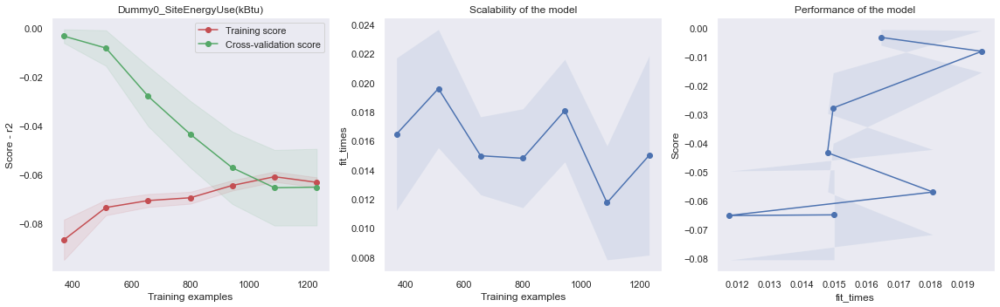

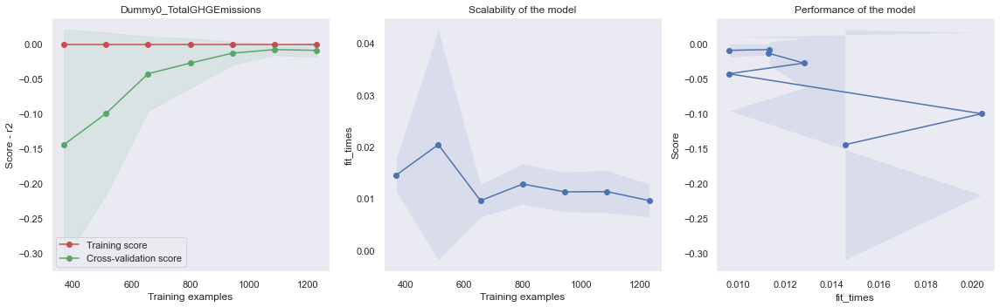

In [33]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test set

In [34]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [35]:
output_test_evaluation(model_name)

Model: Dummy0
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
-0.07 pour le test du modèle (cv ou gridsearch)
-0.10 pour l'évaluation avec le test set
eval score / test score : 1.50

Le metric neg_mean_absolute_error donne :
-6587312.02 pour le test du modèle (cv ou gridsearch)
-5550653.58 pour l'évaluation avec le test set
eval score / test score : 0.84

Le metric neg_root_mean_squared_error donne :
-19893369.45 pour le test du modèle (cv ou gridsearch)
-12531166.58 pour l'évaluation avec le test set
eval score / test score : 0.63

Le metric neg_mean_absolute_percentage_error donne :
-1.94 pour le test du modèle (cv ou gridsearch)
-1.52 pour l'évaluation avec le test set
eval score / test score : 0.79

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
-0.00 pour le t

#### Les Résidus

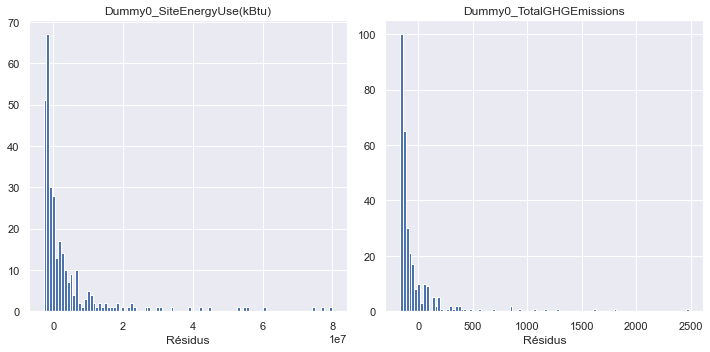

In [36]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 4.4.2  LinRegr0_0

In [37]:
model_name = 'LinRegr0_0'

In [38]:
model = LinearRegression()

pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = cv_evaluation(X_train, y_train[target], pipeline, cv=cv, 
                                                               scoring_tple=scoring_tple)

#### Evaluation de l'Entraînement

In [39]:
output_evaluation(model_name)

Model: LinRegr0_0
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.74 +/-  0.06 pour le train sets
 0.72 +/-  0.14 pour le test sets
test score / train score : 1.02

Le metric neg_mean_absolute_error donne :
-3017589.04 +/-  155224.48 pour le train sets
-3153182.07 +/-  660991.01 pour le test sets
test score / train score : 0.96

Le metric neg_root_mean_squared_error donne :
-10175200.72 +/-  1608958.78 pour le train sets
-10102530.29 +/-  4714018.76 pour le test sets
test score / train score : 1.01

Le metric neg_mean_absolute_percentage_error donne :
-0.78 +/-  0.09 pour le train sets
-0.82 +/-  0.45 pour le test sets
test score / train score : 0.96

Le temps d'entrainement est  12.76 +/- 3.90 ms.
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.64 +/-  0.03 p

#### Courbe d'Apprentissage

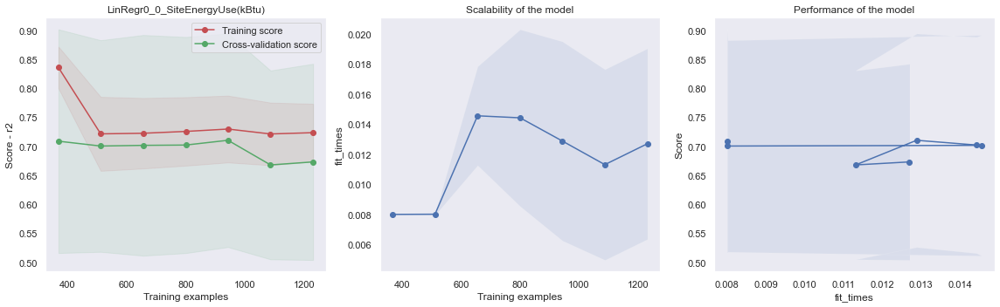

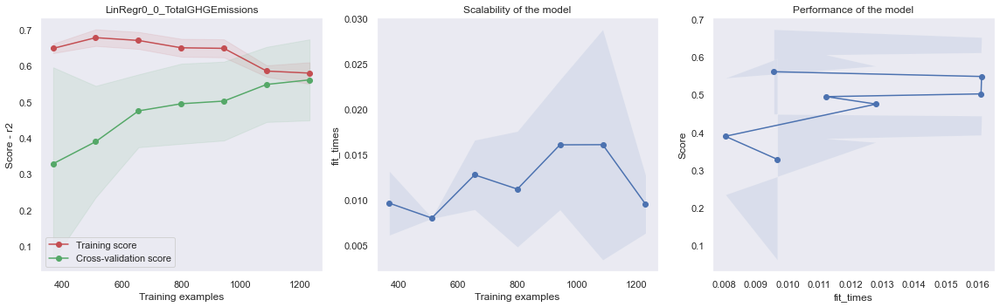

In [40]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [41]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [42]:
output_test_evaluation(model_name)

Model: LinRegr0_0
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.72 pour le test du modèle (cv ou gridsearch)
 0.53 pour l'évaluation avec le test set
eval score / test score : 0.73

Le metric neg_mean_absolute_error donne :
-3153182.07 pour le test du modèle (cv ou gridsearch)
-3316555.68 pour l'évaluation avec le test set
eval score / test score : 1.05

Le metric neg_root_mean_squared_error donne :
-10102530.29 pour le test du modèle (cv ou gridsearch)
-8204673.53 pour l'évaluation avec le test set
eval score / test score : 0.81

Le metric neg_mean_absolute_percentage_error donne :
-0.82 pour le test du modèle (cv ou gridsearch)
-0.61 pour l'évaluation avec le test set
eval score / test score : 0.75

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.59 pour l

#### Les Résidus

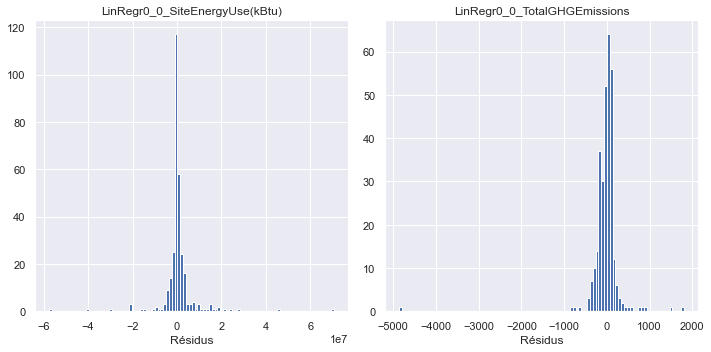

In [43]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 4.4.3  LinRegr0_1

In [44]:
model_name = 'LinRegr0_1'

In [45]:
model = LinearRegression()
param_grid = {'model__regressor__fit_intercept': [True, False],
              'model__regressor__normalize': [True, False]}


pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [46]:
output_evaluation(model_name)

Model: LinRegr0_1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__fit_intercept': False, 'model__regressor__normalize': True}

Le metric r2 donne :
 0.73 +/-  0.07 pour le train sets
 0.72 +/-  0.15 pour le test sets
test score / train score : 1.02

Le metric neg_mean_absolute_error donne :
-3006743.48 +/-  153691.54 pour le train sets
-3129022.54 +/-  687113.93 pour le test sets
test score / train score : 0.96

Le metric neg_root_mean_squared_error donne :
-10245761.16 +/-  1679994.88 pour le train sets
-10027256.20 +/-  4776170.55 pour le test sets
test score / train score : 1.02

Le metric neg_mean_absolute_percentage_error donne :
-0.73 +/-  0.08 pour le train sets
-0.75 +/-  0.35 pour le test sets
test score / train score : 0.97

Le temps d'entrainement est  9.60 +/- 3.20 ms.
__________________________________________________

Variable Targ

#### Courbe d'Apprentissage

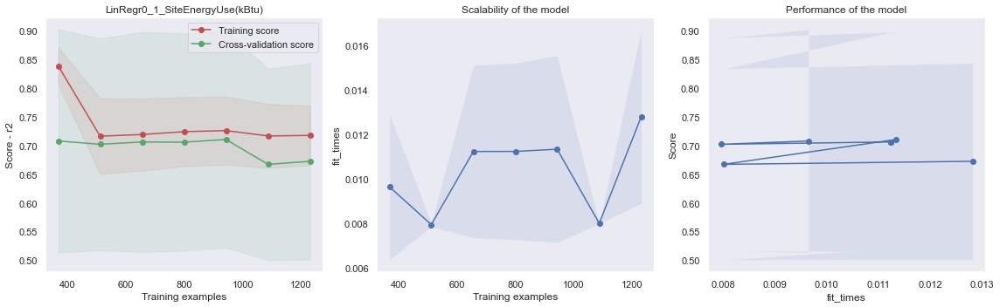

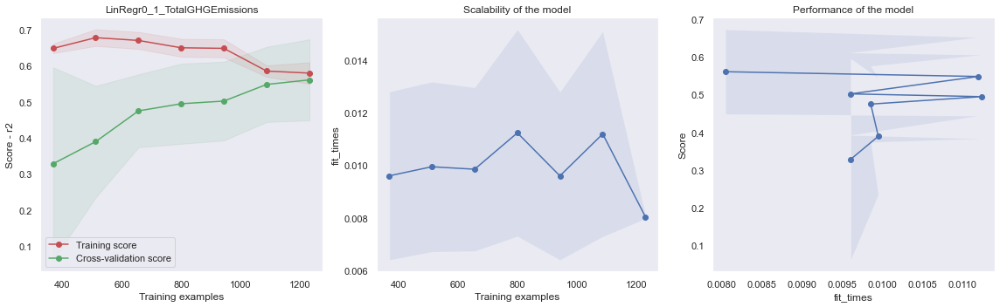

In [47]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [48]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [49]:
output_test_evaluation(model_name)

Model: LinRegr0_1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.72 pour le test du modèle (cv ou gridsearch)
 0.56 pour l'évaluation avec le test set
eval score / test score : 0.78

Le metric neg_mean_absolute_error donne :
-3129022.54 pour le test du modèle (cv ou gridsearch)
-3206888.54 pour l'évaluation avec le test set
eval score / test score : 1.02

Le metric neg_root_mean_squared_error donne :
-10027256.20 pour le test du modèle (cv ou gridsearch)
-7893681.73 pour l'évaluation avec le test set
eval score / test score : 0.79

Le metric neg_mean_absolute_percentage_error donne :
-0.75 pour le test du modèle (cv ou gridsearch)
-0.60 pour l'évaluation avec le test set
eval score / test score : 0.79

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.59 pour l

#### Les Résidus

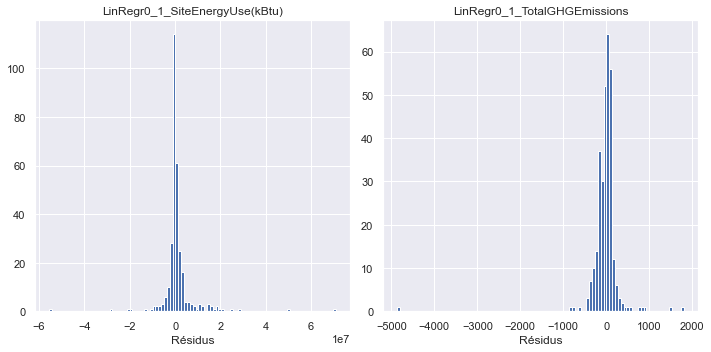

In [50]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 4.4.5 SVR0

In [51]:
model_name = 'SVR0'

In [52]:
model = SVR()
param_grid = {
              'model__regressor__C': np.logspace(2,5,5),
              'model__regressor__epsilon' : np.logspace(-5,1,5),
              'model__regressor__gamma' : [0.001]#np.logspace(-5,-1,5),
                  }
pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [53]:
output_evaluation(model_name)

Model: SVR0
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__C': 3162.2776601683795, 'model__regressor__epsilon': 0.31622776601683794, 'model__regressor__gamma': 0.001}

Le metric r2 donne :
 0.76 +/-  0.06 pour le train sets
 0.77 +/-  0.15 pour le test sets
test score / train score : 0.98

Le metric neg_mean_absolute_error donne :
-2935786.81 +/-  155165.18 pour le train sets
-3033593.36 +/-  694053.57 pour le test sets
test score / train score : 0.97

Le metric neg_root_mean_squared_error donne :
-9729270.99 +/-  1677253.22 pour le train sets
-8852545.42 +/-  4615136.08 pour le test sets
test score / train score : 1.10

Le metric neg_mean_absolute_percentage_error donne :
-0.81 +/-  0.10 pour le train sets
-0.84 +/-  0.44 pour le test sets
test score / train score : 0.97

Le temps d'entrainement est  64.25 +/- 7.44 ms.
________________________

#### Courbe d'Apprentissage

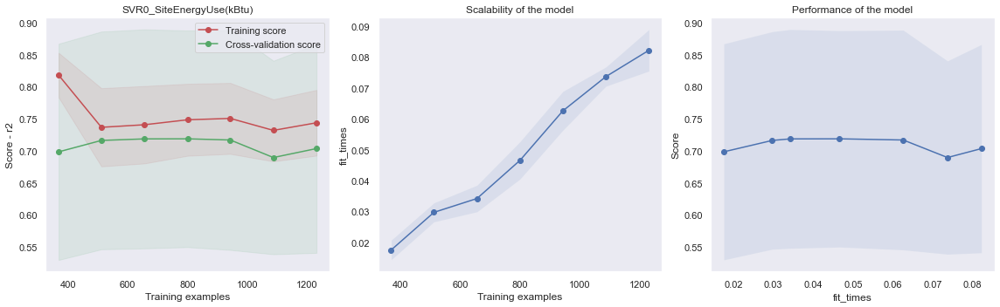

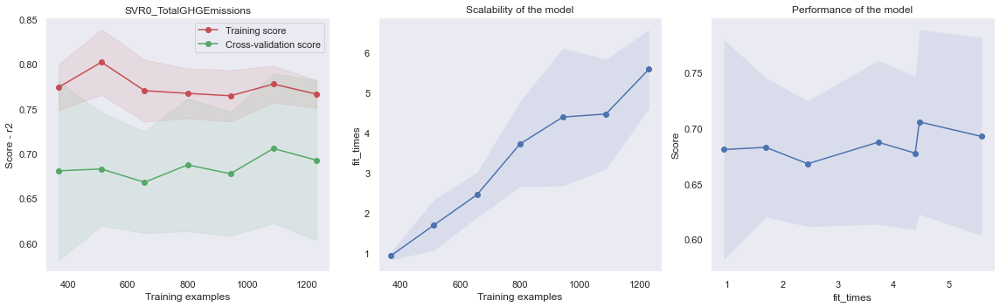

In [54]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [55]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [56]:
output_test_evaluation(model_name)

Model: SVR0
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.77 pour le test du modèle (cv ou gridsearch)
 0.62 pour l'évaluation avec le test set
eval score / test score : 0.80

Le metric neg_mean_absolute_error donne :
-3033593.36 pour le test du modèle (cv ou gridsearch)
-3104194.47 pour l'évaluation avec le test set
eval score / test score : 1.02

Le metric neg_root_mean_squared_error donne :
-8852545.42 pour le test du modèle (cv ou gridsearch)
-7345701.54 pour l'évaluation avec le test set
eval score / test score : 0.83

Le metric neg_mean_absolute_percentage_error donne :
-0.84 pour le test du modèle (cv ou gridsearch)
-0.62 pour l'évaluation avec le test set
eval score / test score : 0.74

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.68 pour le test 

#### Les Résidus

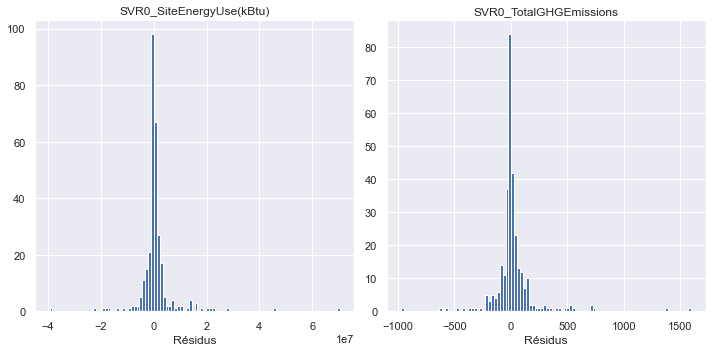

In [57]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 4.4.6 GradientBoostingR0

In [58]:
model_name = 'GradientBoostingR0'

In [59]:
model = GradientBoostingRegressor()
param_grid = {'model__regressor__learning_rate' : np.logspace(-3,0,5)}

pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [60]:
output_evaluation(model_name)

Model: GradientBoostingR0
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__learning_rate': 0.1778279410038923}

Le metric r2 donne :
 0.84 +/-  0.05 pour le train sets
 0.75 +/-  0.15 pour le test sets
test score / train score : 1.12

Le metric neg_mean_absolute_error donne :
-2316800.03 +/-  132405.84 pour le train sets
-3173124.22 +/-  574026.57 pour le test sets
test score / train score : 0.73

Le metric neg_root_mean_squared_error donne :
-7763937.11 +/-  1527646.69 pour le train sets
-9015474.59 +/-  4506155.26 pour le test sets
test score / train score : 0.86

Le metric neg_mean_absolute_percentage_error donne :
-0.51 +/-  0.05 pour le train sets
-0.87 +/-  0.48 pour le test sets
test score / train score : 0.59

Le temps d'entrainement est  81.07 +/- 12.22 ms.
__________________________________________________

Variable Target: TotalGHGEmis

#### Courbe d'Apprentissage

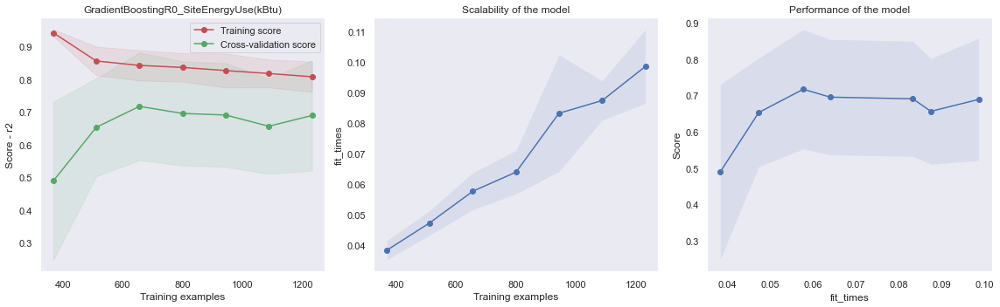

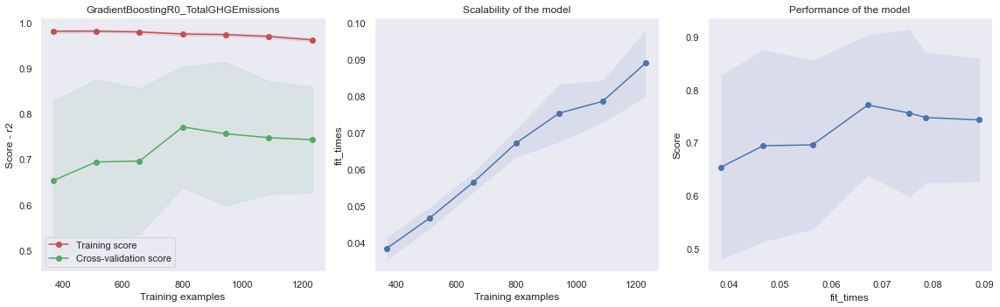

In [61]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [62]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [63]:
output_test_evaluation(model_name)

Model: GradientBoostingR0
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.75 pour le test du modèle (cv ou gridsearch)
 0.63 pour l'évaluation avec le test set
eval score / test score : 0.84

Le metric neg_mean_absolute_error donne :
-3173124.22 pour le test du modèle (cv ou gridsearch)
-3118017.47 pour l'évaluation avec le test set
eval score / test score : 0.98

Le metric neg_root_mean_squared_error donne :
-9015474.59 pour le test du modèle (cv ou gridsearch)
-7256962.71 pour l'évaluation avec le test set
eval score / test score : 0.80

Le metric neg_mean_absolute_percentage_error donne :
-0.87 pour le test du modèle (cv ou gridsearch)
-0.61 pour l'évaluation avec le test set
eval score / test score : 0.70

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.77

#### Les Résidus

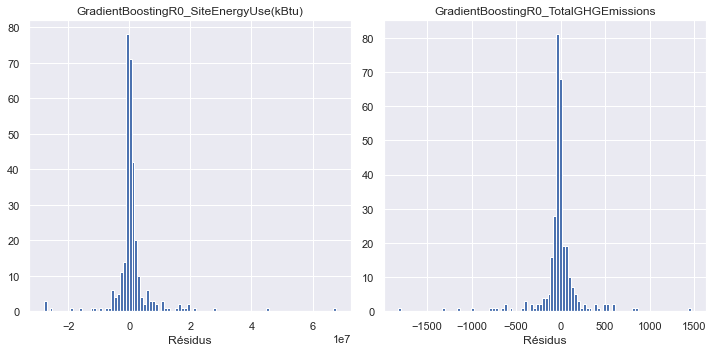

In [64]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

#### Importances des Features

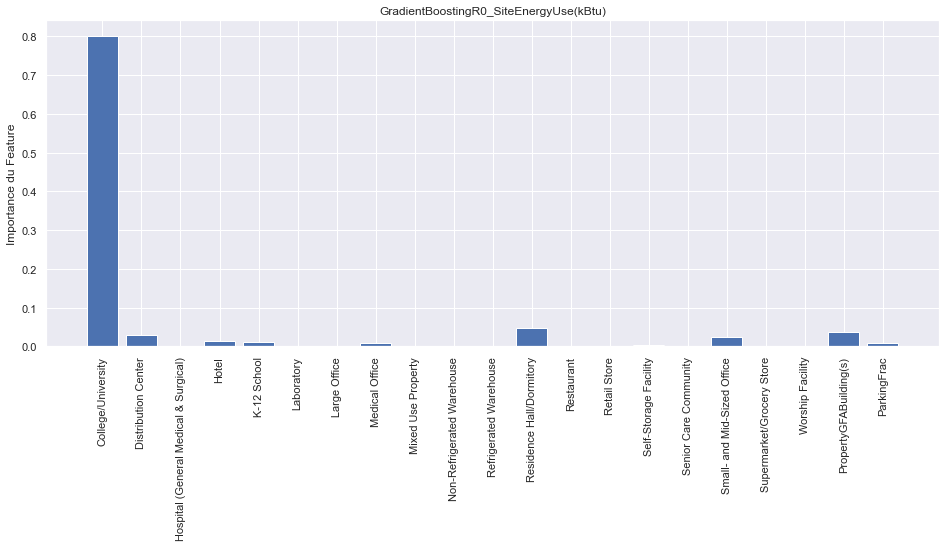

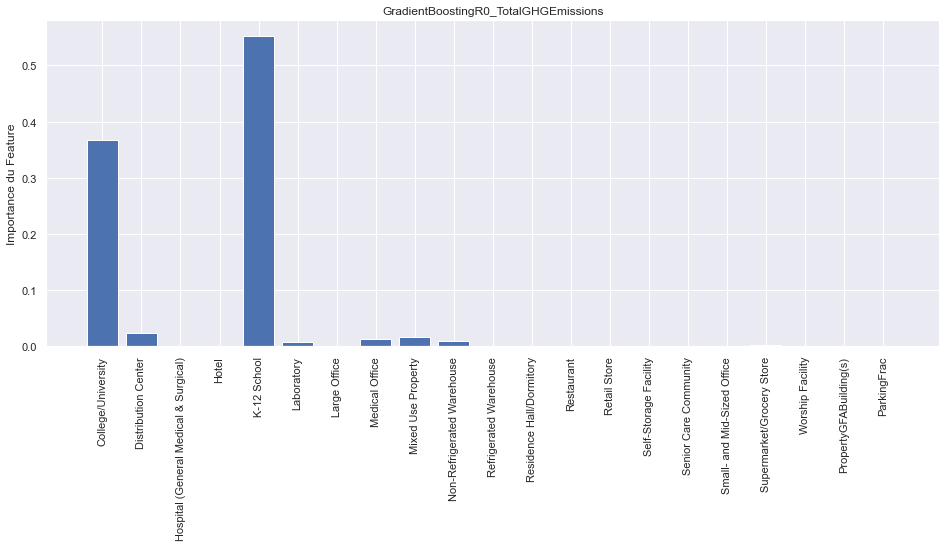

In [65]:
for pipeline, target in zip(pipelines, targets) :
    title = '_'.join([model_name, target]) 
    fitted_estimator=model_dict[title]['estimator'].fit(X_train, y_train[target])
    fig, ax = plt.subplots(figsize = (16, 6))
    plt.bar(X_train.columns.values, abs(fitted_estimator.named_steps.model.regressor_.feature_importances_))
    plt.title(title)
    plt.ylabel('Importance du Feature')
    plt.xticks(rotation = 'vertical')
    plt.show()

### 4.4.7 KNR0

In [66]:
model_name = 'KNR0'

In [67]:
model = KNeighborsRegressor()
param_grid = {
              'model__regressor__n_neighbors': range(1,11),
              'model__regressor__weights' : ['uniform', 'distance'],
              'model__regressor__leaf_size' : range(1,50,5)
               }

pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [68]:
output_evaluation(model_name)

Model: KNR0
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__leaf_size': 1, 'model__regressor__n_neighbors': 3, 'model__regressor__weights': 'uniform'}

Le metric r2 donne :
 0.74 +/-  0.04 pour le train sets
 0.67 +/-  0.15 pour le test sets
test score / train score : 1.09

Le metric neg_mean_absolute_error donne :
-2835065.06 +/-  168532.52 pour le train sets
-3635158.23 +/-  658700.19 pour le test sets
test score / train score : 0.78

Le metric neg_root_mean_squared_error donne :
-10189267.27 +/-  1255451.03 pour le train sets
-10985535.85 +/-  4802251.63 pour le test sets
test score / train score : 0.93

Le metric neg_mean_absolute_percentage_error donne :
-0.50 +/-  0.02 pour le train sets
-0.92 +/-  0.45 pour le test sets
test score / train score : 0.54

Le temps d'entrainement est  8.00 +/- 0.00 ms.
________________________________________

#### Courbe d'Apprentissage

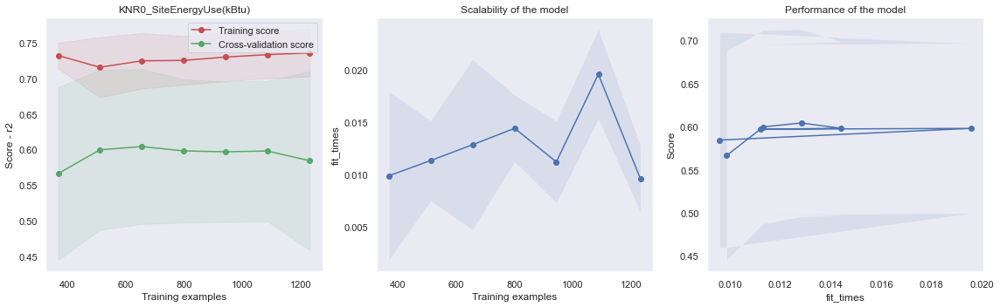

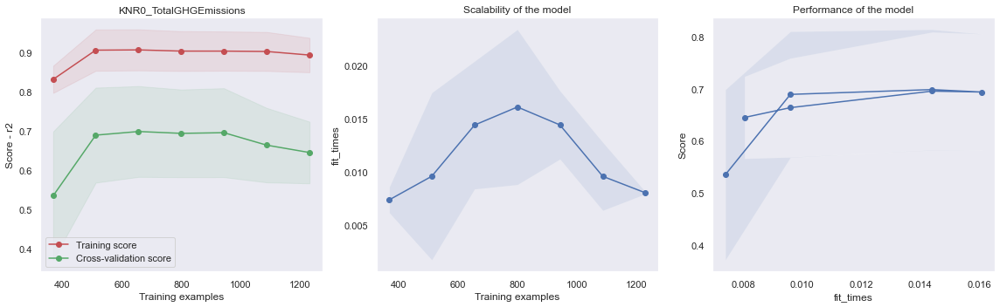

In [69]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [70]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [71]:
output_test_evaluation(model_name)

Model: KNR0
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.67 pour le test du modèle (cv ou gridsearch)
 0.47 pour l'évaluation avec le test set
eval score / test score : 0.69

Le metric neg_mean_absolute_error donne :
-3635158.23 pour le test du modèle (cv ou gridsearch)
-3623535.25 pour l'évaluation avec le test set
eval score / test score : 1.00

Le metric neg_root_mean_squared_error donne :
-10985535.85 pour le test du modèle (cv ou gridsearch)
-8697753.87 pour l'évaluation avec le test set
eval score / test score : 0.79

Le metric neg_mean_absolute_percentage_error donne :
-0.92 pour le test du modèle (cv ou gridsearch)
-0.74 pour l'évaluation avec le test set
eval score / test score : 0.80

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.74 pour le test

#### Les Résidus

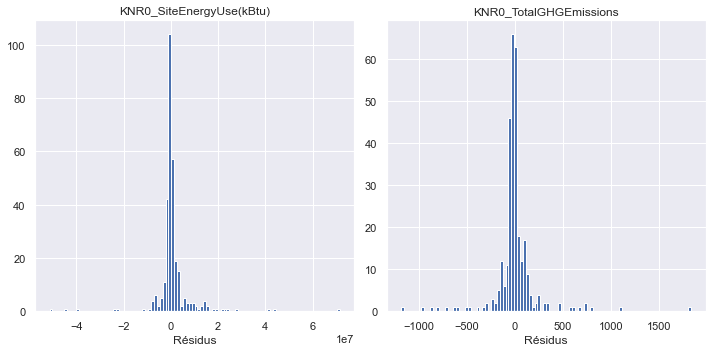

In [72]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 4.4.8 RandomForest0

In [73]:
model_name = 'RandomForestR0'

In [74]:
model = RandomForestRegressor()
param_grid = {
              'model__regressor__n_estimators' : [7, 8, 9, 10, 15, 20, 30, 40, 50, 100],
              'model__regressor__max_depth' : [50, 60, 70, 80, 90, 100, 110]
              }
pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [75]:
output_evaluation(model_name)

Model: RandomForestR0
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__max_depth': 110, 'model__regressor__n_estimators': 10}

Le metric r2 donne :
 0.90 +/-  0.05 pour le train sets
 0.74 +/-  0.15 pour le test sets
test score / train score : 1.22

Le metric neg_mean_absolute_error donne :
-1584707.32 +/-  151440.77 pour le train sets
-3388101.18 +/-  640275.28 pour le test sets
test score / train score : 0.47

Le metric neg_root_mean_squared_error donne :
-5967793.11 +/-  1735993.65 pour le train sets
-9264783.15 +/-  4375176.93 pour le test sets
test score / train score : 0.64

Le metric neg_mean_absolute_percentage_error donne :
-0.27 +/-  0.02 pour le train sets
-1.09 +/-  0.68 pour le test sets
test score / train score : 0.25

Le temps d'entrainement est  33.65 +/- 3.16 ms.
__________________________________________________

Variable Target

#### Courbe d'Apprentissage

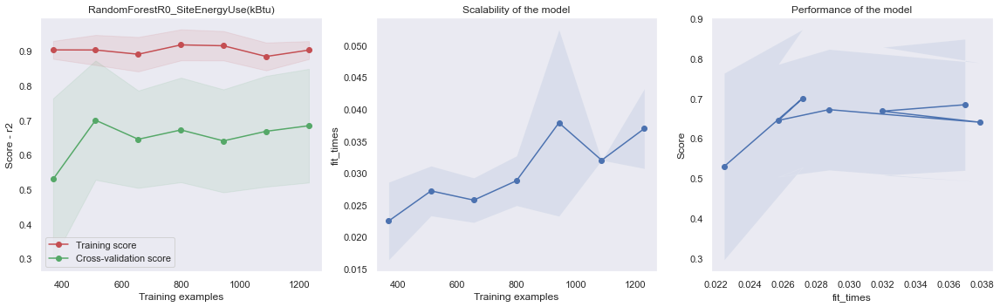

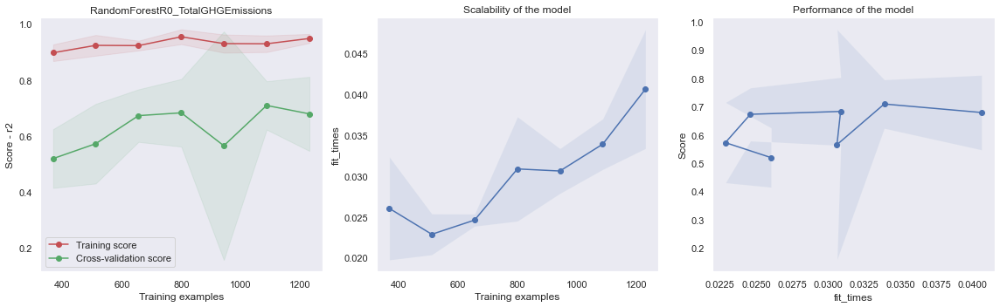

In [76]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [77]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [78]:
output_test_evaluation(model_name)

Model: RandomForestR0
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.74 pour le test du modèle (cv ou gridsearch)
 0.63 pour l'évaluation avec le test set
eval score / test score : 0.85

Le metric neg_mean_absolute_error donne :
-3388101.18 pour le test du modèle (cv ou gridsearch)
-3294633.78 pour l'évaluation avec le test set
eval score / test score : 0.97

Le metric neg_root_mean_squared_error donne :
-9264783.15 pour le test du modèle (cv ou gridsearch)
-7251546.27 pour l'évaluation avec le test set
eval score / test score : 0.78

Le metric neg_mean_absolute_percentage_error donne :
-1.09 pour le test du modèle (cv ou gridsearch)
-0.78 pour l'évaluation avec le test set
eval score / test score : 0.71

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.77 pou

#### Les Résidus

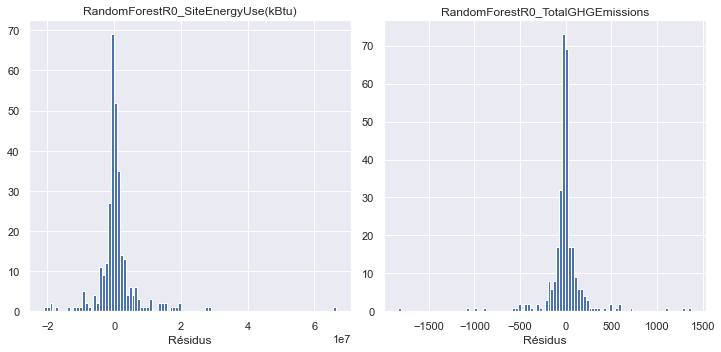

In [79]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

#### Importances des Features

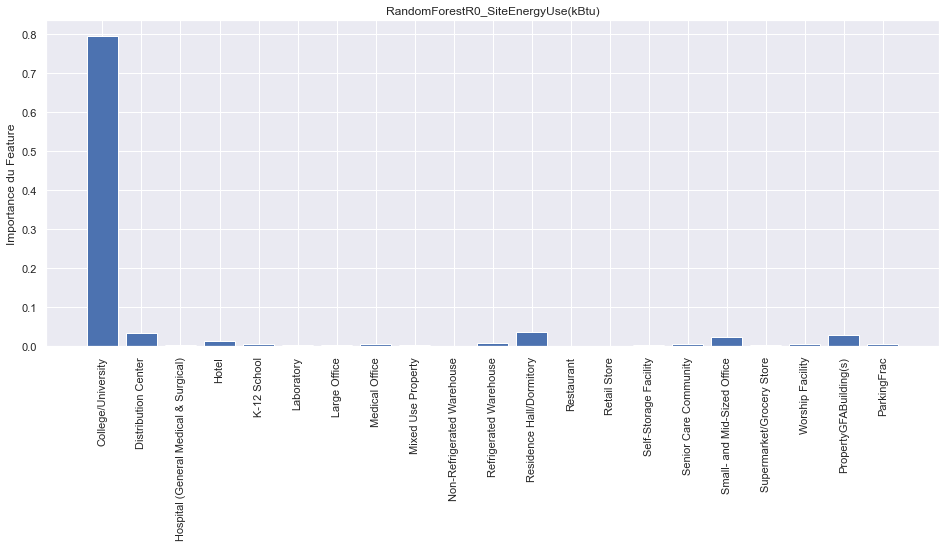

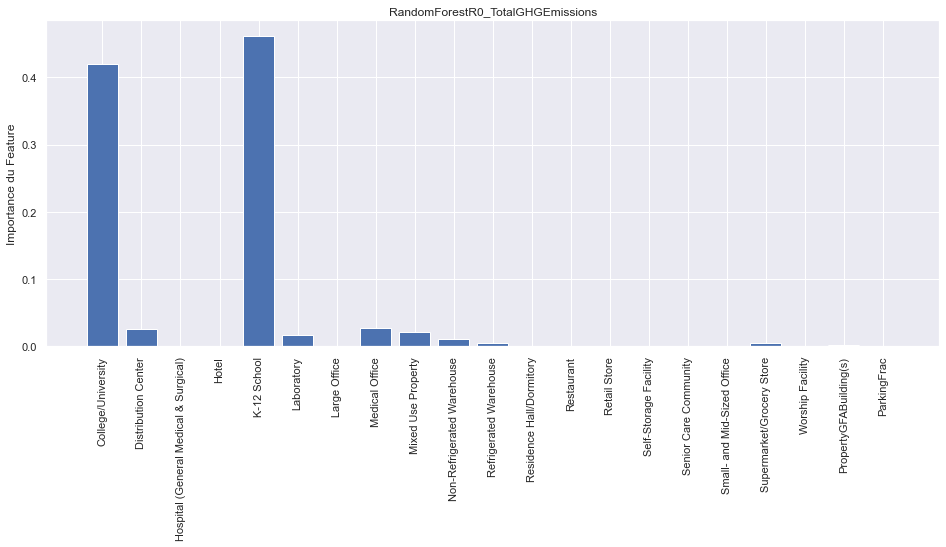

In [80]:
for pipeline, target in zip(pipelines, targets) :
    title = '_'.join([model_name, target]) 
    fitted_estimator=model_dict[title]['estimator'].fit(X_train, y_train[target])
    fig, ax = plt.subplots(figsize = (16, 6))
    plt.bar(X_train.columns.values, abs(fitted_estimator.named_steps.model.regressor_.feature_importances_))
    plt.title(title)
    plt.ylabel('Importance du Feature')
    plt.xticks(rotation = 'vertical')
    plt.show()

## 4.5 Evaluation - Version 0

In [329]:
model_list_bases = ['SVR', 'GradientBoostingR', 'KNR', 'RandomForestR']
model_list = ['Dummy0', 'LinRegr0_0', 'LinRegr0_1'] + [m+'0' for m in model_list_bases]

In [330]:
targets = ['SiteEnergyUse(kBtu)', 'TotalGHGEmissions']
df_dict = output_model_evaluations(model_list, targets)

for target in targets:
    display(df_dict[target])

,train_r2,eval_r2,train_nMAE,eval_nMAE,train_nRMSE,eval_nRMSE,train_nMAPE,eval_nMAPE,train_time
Dummy0,-0.069297,-0.104254,-6.587312e+06,-5.550654e+06,-1.989337e+07,-1.253117e+07,-1.937700,-1.521525,18.203306
LinRegr0_0,0.719114,0.526621,-3.153182e+06,-3.316556e+06,-1.010253e+07,-8.204674e+06,-0.818103,-0.613419,12.758064
LinRegr0_1,0.720147,0.561827,-3.129023e+06,-3.206889e+06,-1.002726e+07,-7.893682e+06,-0.750405,-0.595453,9.597778
SVR0,0.773737,0.620552,-3.033593e+06,-3.104194e+06,-8.852545e+06,-7.345702e+06,-0.839303,-0.622785,64.254332
GradientBoostingR0,0.751456,0.629664,-3.173124e+06,-3.118017e+06,-9.015475e+06,-7.256963e+06,-0.869689,-0.605491,81.074047
KNR0,0.674023,0.468014,-3.635158e+06,-3.623535e+06,-1.098554e+07,-8.697754e+06,-0.917625,-0.736620,7.995176
RandomForestR0,0.742374,0.630217,-3.388101e+06,-3.294634e+06,-9.264783e+06,-7.251546e+06,-1.086474,-0.775594,33.650923


,train_r2,eval_r2,train_nMAE,eval_nMAE,train_nRMSE,eval_nRMSE,train_nMAPE,eval_nMAPE,train_time
Dummy0,-0.001536,-0.011328,-193.591480,-165.513576,-591.549070,-286.490732,-6.093349e+14,-8.343297,11.194324
LinRegr0_0,0.585239,-0.592707,-143.272234,-154.362800,-369.490306,-359.527731,-1.053038e+15,-5.797614,9.612942
LinRegr0_1,0.585239,-0.592707,-143.272234,-154.362800,-369.490306,-359.527731,-1.053038e+15,-5.797614,12.802553
SVR0,0.681071,0.511440,-100.004693,-94.268807,-330.036908,-199.123904,-5.932256e+14,-1.978470,3652.942133
GradientBoostingR0,0.768404,0.214614,-95.410964,-116.934772,-239.041541,-252.467883,-8.095044e+14,-2.631749,76.799440
KNR0,0.735993,0.360946,-108.896116,-107.168604,-284.246263,-227.736873,-6.311695e+14,-1.958531,6.342602
RandomForestR0,0.774683,0.314101,-103.175439,-115.068163,-258.209567,-235.936255,-9.454905e+14,-2.726049,31.990862


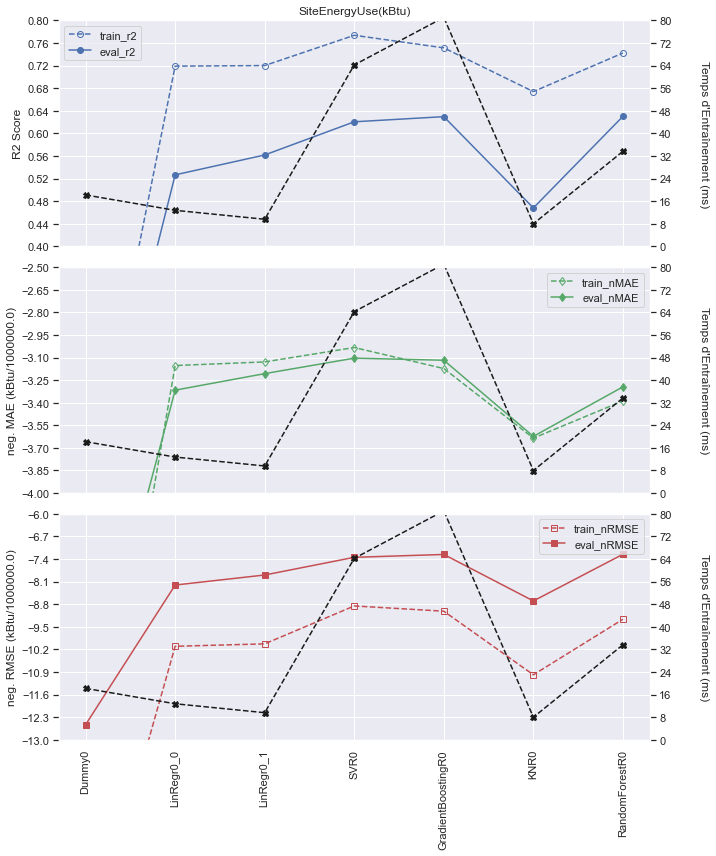

In [331]:
target = 'SiteEnergyUse(kBtu)'
data = df_dict[target]
scaling = 1e6
ylims = ((0.4,0.8), (-4, -2.5), (-13, -6), (0, 80), (0, 80), (0, 80))
plot_model_evaluations(df_dict[target], title = target, scaling = scaling, ylims = ylims)

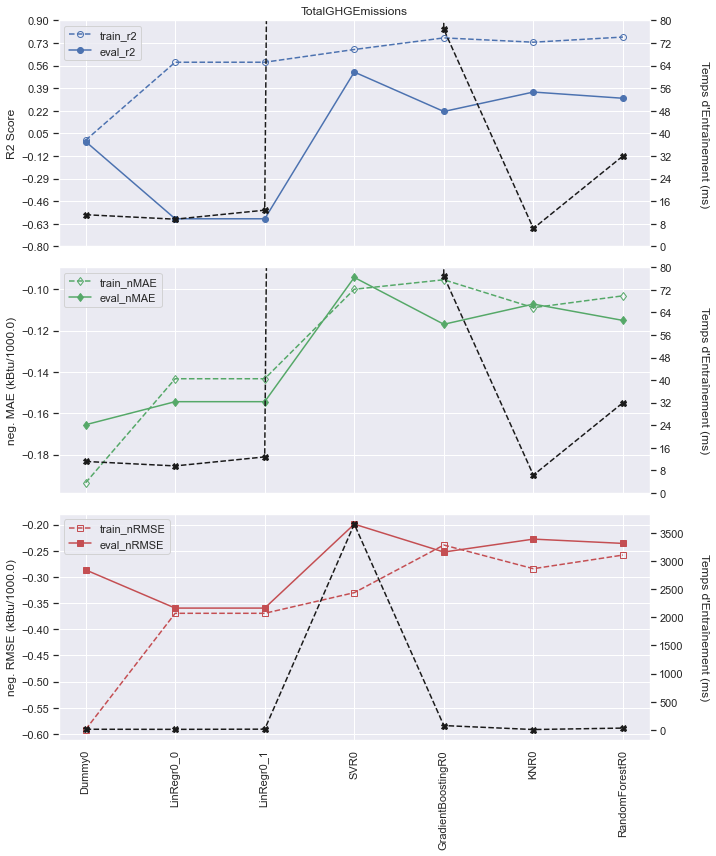

In [332]:
target = 'TotalGHGEmissions'
data = df_dict[target]
scaling = 1e3
ylims = ((-0.8,0.9), (None, None), (None, None), (0, 80), (0, 80), (None, None))
plot_model_evaluations(df_dict[target], title = target, scaling = scaling, ylims = ylims)

<a id="Section5"></a>

# 5. Modèles - Version 1

<a id="Section5.1"></a>

## 5.1 Les Features

In [85]:
X_onehot = onehot_encode_feature(dataset, 'PrimaryPropertyType', 'Other')
onehot_features = list(X_onehot.columns.values)
logscale_features = ['PropertyGFABuilding(s)', 'NumberofFloors']
log1pscale_features = ['ParkingFrac']
standardscale_features = ['BuildingAge','EastWestDistance', 'NorthSouthDistance']

X = pd.concat([X_onehot, dataset[logscale_features + log1pscale_features + standardscale_features]], axis = 1)

<a id="Section5.2"></a>

## 5.2 Train/Test Dévision

In [86]:
y = dataset[targets]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, random_state = seed)

<a id="Section5.3"></a>

## 5.3 Préprocesseurs

In [87]:
preprocessor_X = create_preprocessor_X(logscale_features = logscale_features, standardscale_features=standardscale_features)
preprocessors_y = [create_preprocessor_y('log'), create_preprocessor_y('logp')]

<a id="Section5.4"></a>

## 5.4 Les Modèles

### 5.4.1 LinRegr1

In [88]:
model_name = 'LinRegr1'

In [89]:
model = LinearRegression()
param_grid = {'model__regressor__fit_intercept': [True, False],
              'model__regressor__normalize': [True, False]}


pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [90]:
output_evaluation(model_name)

Model: LinRegr1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__fit_intercept': False, 'model__regressor__normalize': True}

Le metric r2 donne :
 0.73 +/-  0.07 pour le train sets
 0.71 +/-  0.16 pour le test sets
test score / train score : 1.02

Le metric neg_mean_absolute_error donne :
-3046895.94 +/-  176984.23 pour le train sets
-3175289.88 +/-  732990.50 pour le test sets
test score / train score : 0.96

Le metric neg_root_mean_squared_error donne :
-10338815.73 +/-  1747432.95 pour le train sets
-10147280.77 +/-  4787420.41 pour le test sets
test score / train score : 1.02

Le metric neg_mean_absolute_percentage_error donne :
-0.72 +/-  0.07 pour le train sets
-0.74 +/-  0.34 pour le test sets
test score / train score : 0.96

Le temps d'entrainement est  17.70 +/- 3.15 ms.
__________________________________________________

Variable Targe

#### Courbe d'Apprentissage

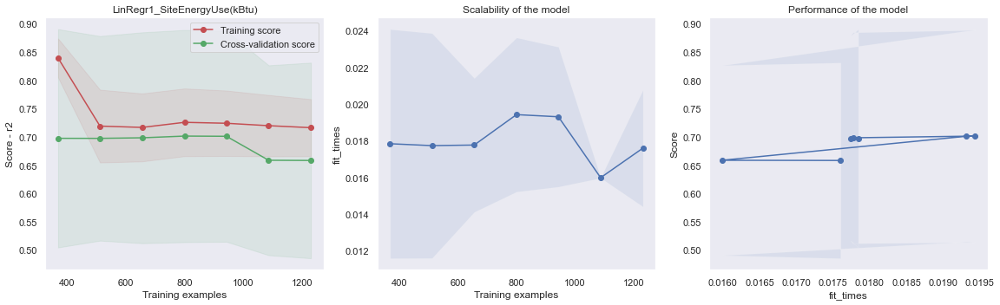

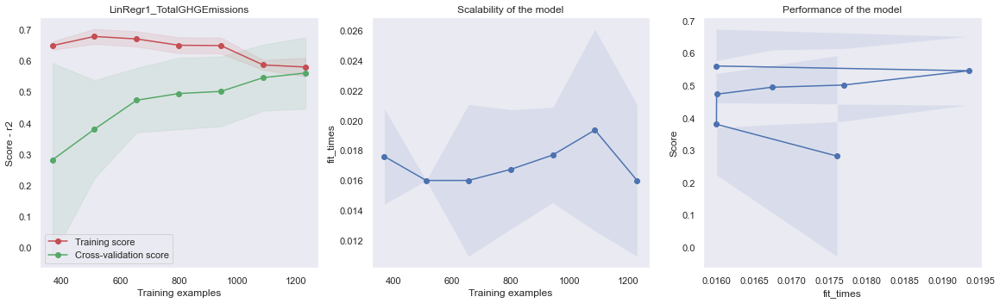

In [91]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [92]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [93]:
output_test_evaluation(model_name)

Model: LinRegr1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.71 pour le test du modèle (cv ou gridsearch)
 0.55 pour l'évaluation avec le test set
eval score / test score : 0.77

Le metric neg_mean_absolute_error donne :
-3175289.88 pour le test du modèle (cv ou gridsearch)
-3273237.73 pour l'évaluation avec le test set
eval score / test score : 1.03

Le metric neg_root_mean_squared_error donne :
-10147280.77 pour le test du modèle (cv ou gridsearch)
-8034695.67 pour l'évaluation avec le test set
eval score / test score : 0.79

Le metric neg_mean_absolute_percentage_error donne :
-0.74 pour le test du modèle (cv ou gridsearch)
-0.60 pour l'évaluation avec le test set
eval score / test score : 0.81

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.58 pour le 

#### Les Résidus

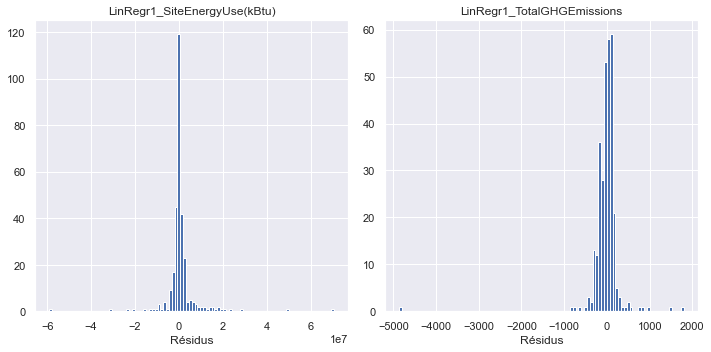

In [94]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 5.4.2 Ridge1

In [95]:
model_name = 'Ridge1'
model = Ridge()
param_grid = {'model__regressor__fit_intercept': [True, False],
              'model__regressor__alpha': np.logspace(-5,2,20),
                                }
pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [96]:
output_evaluation(model_name)

Model: Ridge1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__alpha': 1.438449888287663, 'model__regressor__fit_intercept': True}

Le metric r2 donne :
 0.73 +/-  0.07 pour le train sets
 0.73 +/-  0.17 pour le test sets
test score / train score : 1.00

Le metric neg_mean_absolute_error donne :
-3096389.32 +/-  192921.45 pour le train sets
-3206087.88 +/-  771174.85 pour le test sets
test score / train score : 0.97

Le metric neg_root_mean_squared_error donne :
-10232713.07 +/-  1703576.42 pour le train sets
-9718456.27 +/-  4846041.21 pour le test sets
test score / train score : 1.05

Le metric neg_mean_absolute_percentage_error donne :
-0.76 +/-  0.08 pour le train sets
-0.80 +/-  0.40 pour le test sets
test score / train score : 0.96

Le temps d'entrainement est  7.94 +/- 0.09 ms.
__________________________________________________

Variable T

#### Courbe d'Apprentissage

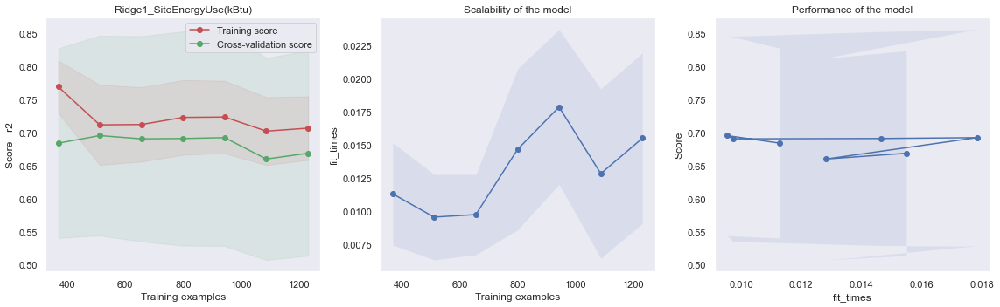

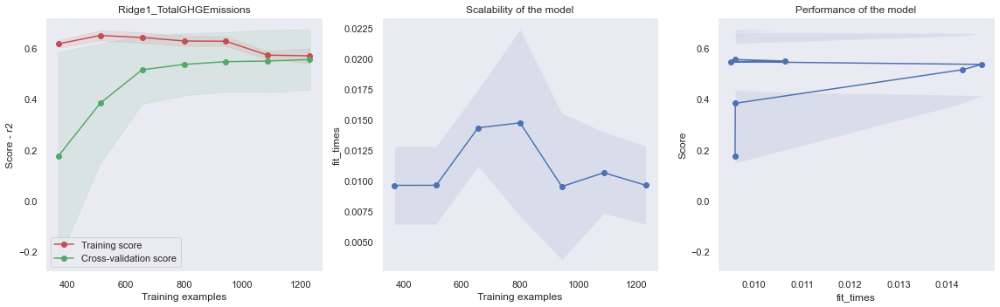

In [97]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [98]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [99]:
output_test_evaluation(model_name)

Model: Ridge1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.73 pour le test du modèle (cv ou gridsearch)
 0.60 pour l'évaluation avec le test set
eval score / test score : 0.82

Le metric neg_mean_absolute_error donne :
-3206087.88 pour le test du modèle (cv ou gridsearch)
-3126790.30 pour l'évaluation avec le test set
eval score / test score : 0.98

Le metric neg_root_mean_squared_error donne :
-9718456.27 pour le test du modèle (cv ou gridsearch)
-7560613.73 pour l'évaluation avec le test set
eval score / test score : 0.78

Le metric neg_mean_absolute_percentage_error donne :
-0.80 pour le test du modèle (cv ou gridsearch)
-0.61 pour l'évaluation avec le test set
eval score / test score : 0.76

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.59 pour le tes

#### Les Résidus

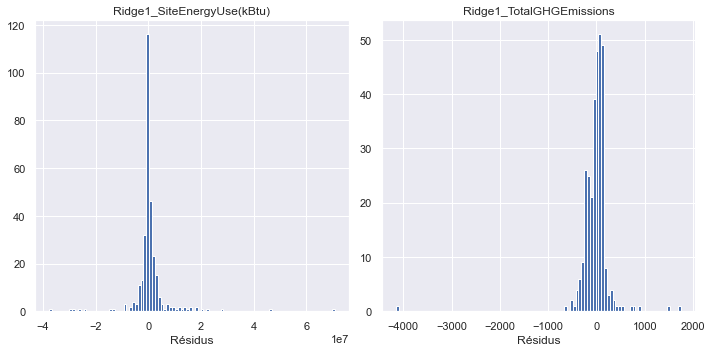

In [100]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 5.4.3 Lasso1

In [101]:
model_name = 'Lasso1'

In [102]:
model = Lasso()
param_grid = {'model__regressor__fit_intercept': [True, False],
              'model__regressor__alpha': np.logspace(-6,1,20),
                                }
pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [103]:
output_evaluation(model_name)

Model: Lasso1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__alpha': 0.0008858667904100823, 'model__regressor__fit_intercept': False}

Le metric r2 donne :
 0.73 +/-  0.07 pour le train sets
 0.73 +/-  0.18 pour le test sets
test score / train score : 1.00

Le metric neg_mean_absolute_error donne :
-3070866.13 +/-  191040.80 pour le train sets
-3161533.19 +/-  801384.95 pour le test sets
test score / train score : 0.97

Le metric neg_root_mean_squared_error donne :
-10288784.54 +/-  1759657.77 pour le train sets
-9648426.05 +/-  4973310.38 pour le test sets
test score / train score : 1.07

Le metric neg_mean_absolute_percentage_error donne :
-0.72 +/-  0.07 pour le train sets
-0.74 +/-  0.33 pour le test sets
test score / train score : 0.97

Le temps d'entrainement est  8.01 +/- 0.02 ms.
__________________________________________________

Varia

#### Courbe d'Apprentissage

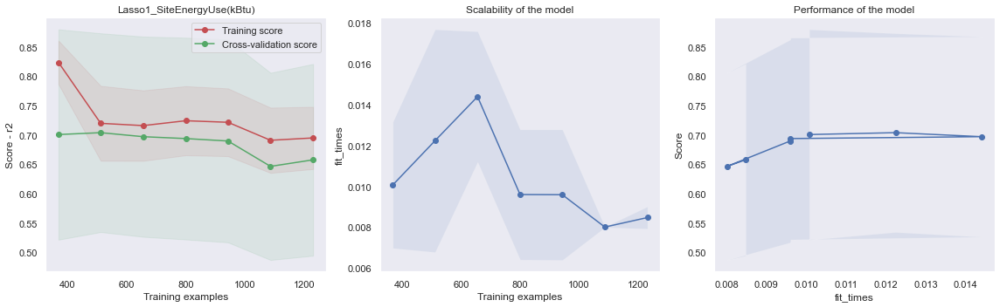

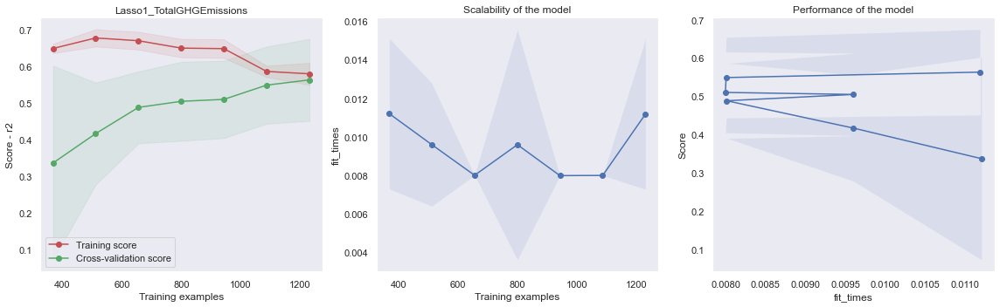

In [104]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [105]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [106]:
output_test_evaluation(model_name)

Model: Lasso1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.73 pour le test du modèle (cv ou gridsearch)
 0.62 pour l'évaluation avec le test set
eval score / test score : 0.84

Le metric neg_mean_absolute_error donne :
-3161533.19 pour le test du modèle (cv ou gridsearch)
-3110090.35 pour l'évaluation avec le test set
eval score / test score : 0.98

Le metric neg_root_mean_squared_error donne :
-9648426.05 pour le test du modèle (cv ou gridsearch)
-7391198.23 pour l'évaluation avec le test set
eval score / test score : 0.77

Le metric neg_mean_absolute_percentage_error donne :
-0.74 pour le test du modèle (cv ou gridsearch)
-0.59 pour l'évaluation avec le test set
eval score / test score : 0.80

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.58 pour le tes

#### Les Résidus

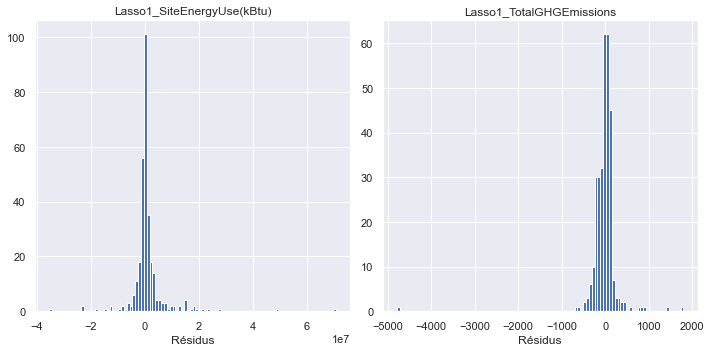

In [107]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 5.4.4 LinearSVR1

In [108]:
model_name = 'LinearSVR1'

In [109]:
model = LinearSVR(max_iter=10000, fit_intercept = False)
param_grid = {'model__regressor__C': np.logspace(-2,2,10),
              'model__regressor__epsilon' : np.logspace(-5,0,10)}

pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

#### Evaluation de l'Entraînement

In [110]:
output_evaluation(model_name)

Model: LinearSVR1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__C': 100.0, 'model__regressor__epsilon': 0.0001291549665014884}

Le metric r2 donne :
 0.73 +/-  0.07 pour le train sets
 0.75 +/-  0.17 pour le test sets
test score / train score : 0.98

Le metric neg_mean_absolute_error donne :
-3001463.45 +/-  165678.30 pour le train sets
-3059634.85 +/-  770168.16 pour le test sets
test score / train score : 0.98

Le metric neg_root_mean_squared_error donne :
-10298118.28 +/-  1771183.28 pour le train sets
-9392652.46 +/-  4873617.91 pour le test sets
test score / train score : 1.10

Le metric neg_mean_absolute_percentage_error donne :
-0.74 +/-  0.07 pour le train sets
-0.77 +/-  0.37 pour le test sets
test score / train score : 0.97

Le temps d'entrainement est  163.19 +/- 3.83 ms.
__________________________________________________

Variable 

#### Courbe d'Apprentissage

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


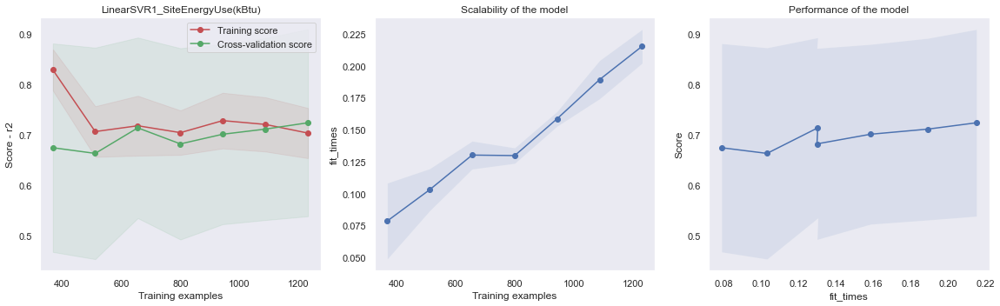

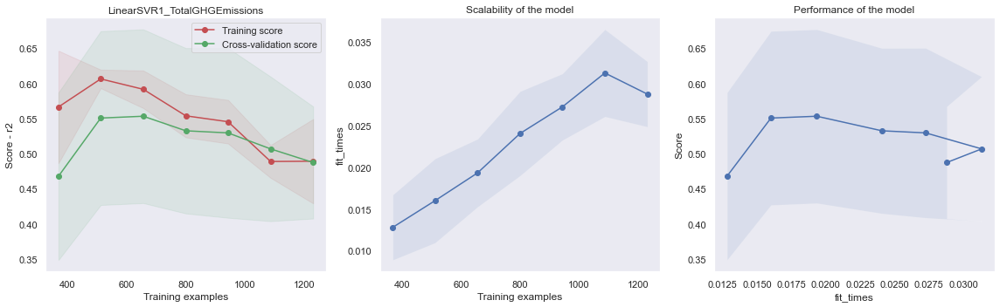

In [111]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [112]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


In [113]:
output_test_evaluation(model_name)

Model: LinearSVR1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.75 pour le test du modèle (cv ou gridsearch)
 0.56 pour l'évaluation avec le test set
eval score / test score : 0.75

Le metric neg_mean_absolute_error donne :
-3059634.85 pour le test du modèle (cv ou gridsearch)
-3236211.46 pour l'évaluation avec le test set
eval score / test score : 1.06

Le metric neg_root_mean_squared_error donne :
-9392652.46 pour le test du modèle (cv ou gridsearch)
-7914496.74 pour l'évaluation avec le test set
eval score / test score : 0.84

Le metric neg_mean_absolute_percentage_error donne :
-0.77 pour le test du modèle (cv ou gridsearch)
-0.62 pour l'évaluation avec le test set
eval score / test score : 0.81

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.57 pour le

#### Les Résidus

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


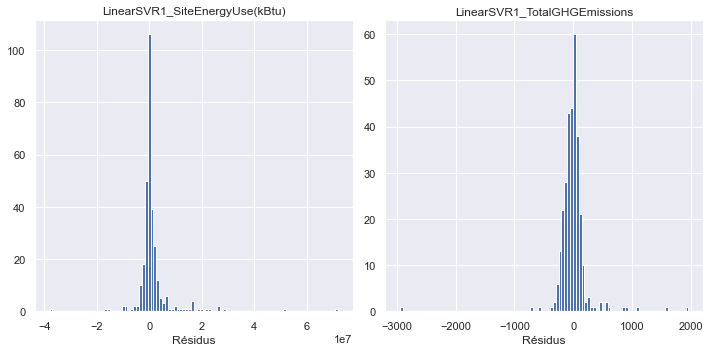

In [114]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

#### Importances des Features

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


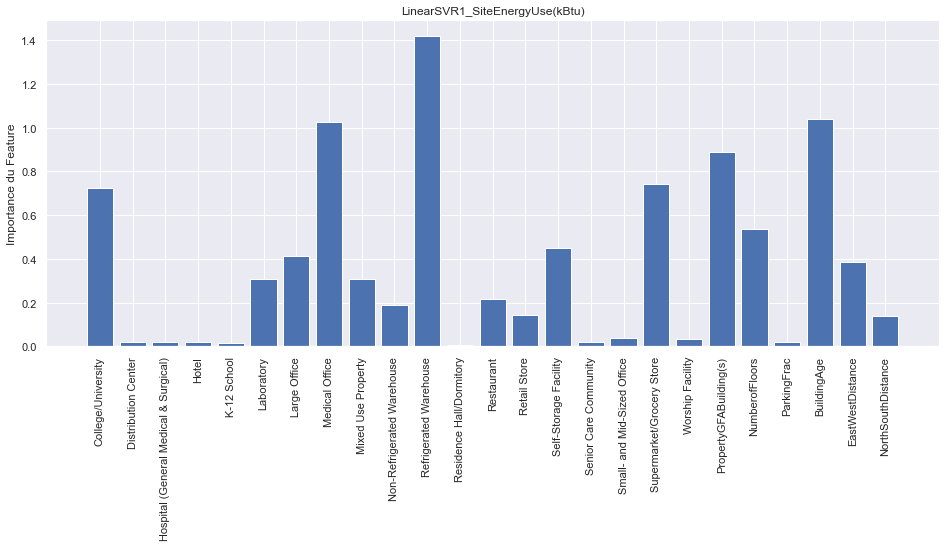

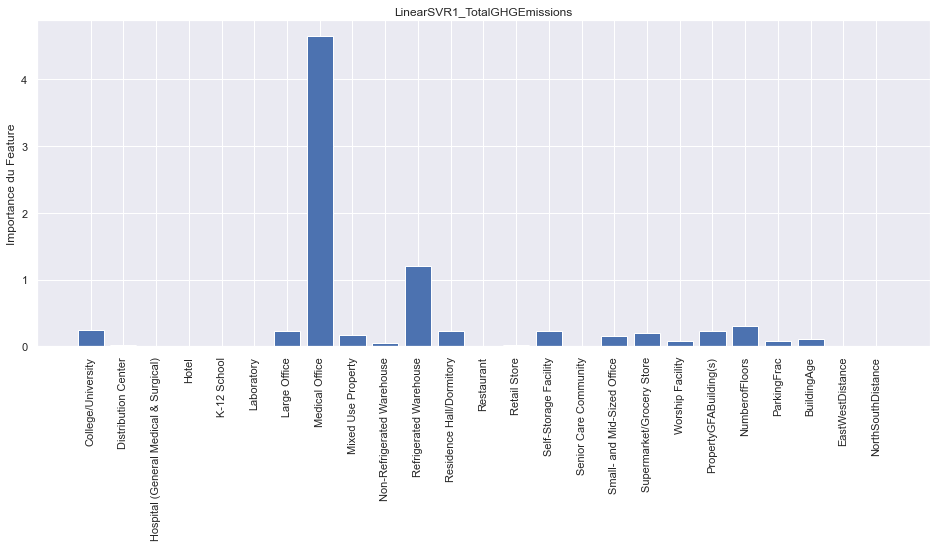

In [115]:
for pipeline, target in zip(pipelines, targets) :
    title = '_'.join([model_name, target]) 
    fitted_estimator=model_dict[title]['estimator'].fit(X_train, y_train[target])
    fig, ax = plt.subplots(figsize = (16, 6))
    plt.bar(X_train.columns.values, abs(fitted_estimator.named_steps.model.regressor_.coef_))
    plt.title(title)
    plt.ylabel('Importance du Feature')
    plt.xticks(rotation = 'vertical')
    plt.show()

### 5.4.5 SVR1

In [116]:
model_name = 'SVR1'

In [117]:
model = SVR()
param_grid = {
              'model__regressor__C': np.logspace(2,5,5),
              'model__regressor__epsilon' : np.logspace(-5,1,5),
              'model__regressor__gamma' : [0.001]#np.logspace(-5,-1,5),
                  }
pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [118]:
output_evaluation(model_name)

Model: SVR1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__C': 562.341325190349, 'model__regressor__epsilon': 0.31622776601683794, 'model__regressor__gamma': 0.001}

Le metric r2 donne :
 0.76 +/-  0.06 pour le train sets
 0.76 +/-  0.15 pour le test sets
test score / train score : 1.00

Le metric neg_mean_absolute_error donne :
-2878405.53 +/-  156880.24 pour le train sets
-3013286.39 +/-  679763.73 pour le test sets
test score / train score : 0.96

Le metric neg_root_mean_squared_error donne :
-9581433.90 +/-  1651716.08 pour le train sets
-8887817.75 +/-  4719932.77 pour le test sets
test score / train score : 1.08

Le metric neg_mean_absolute_percentage_error donne :
-0.77 +/-  0.09 pour le train sets
-0.80 +/-  0.38 pour le test sets
test score / train score : 0.96

Le temps d'entrainement est  47.66 +/- 6.27 ms.
__________________________

#### Courbe d'Apprentissage

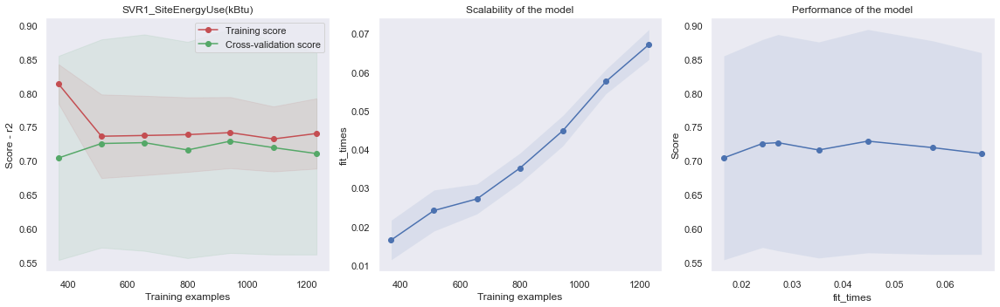

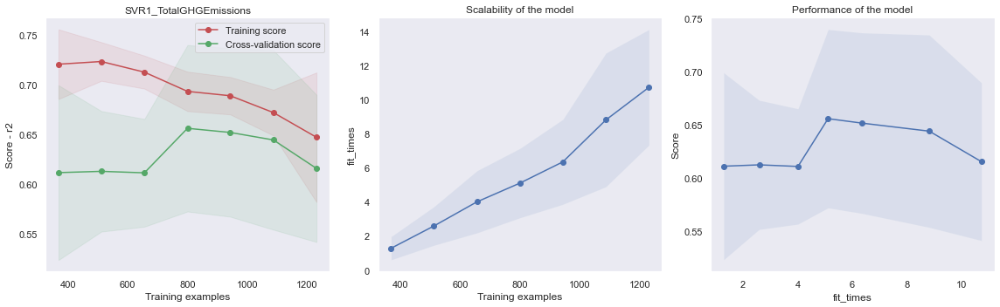

In [119]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [120]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [121]:
output_test_evaluation(model_name)

Model: SVR1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.76 pour le test du modèle (cv ou gridsearch)
 0.65 pour l'évaluation avec le test set
eval score / test score : 0.85

Le metric neg_mean_absolute_error donne :
-3013286.39 pour le test du modèle (cv ou gridsearch)
-3007620.76 pour l'évaluation avec le test set
eval score / test score : 1.00

Le metric neg_root_mean_squared_error donne :
-8887817.75 pour le test du modèle (cv ou gridsearch)
-7077380.48 pour l'évaluation avec le test set
eval score / test score : 0.80

Le metric neg_mean_absolute_percentage_error donne :
-0.80 pour le test du modèle (cv ou gridsearch)
-0.63 pour l'évaluation avec le test set
eval score / test score : 0.79

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.62 pour le test 

#### Les Résidus

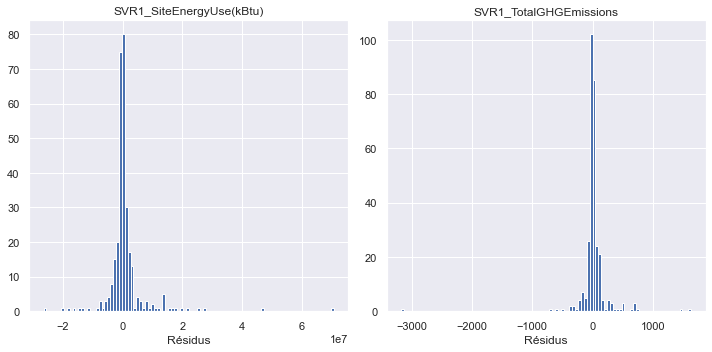

In [122]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 5.4.6 GradientBoostingR1

In [123]:
model_name = 'GradientBoostingR1'

In [124]:
model = GradientBoostingRegressor()
param_grid = {'model__regressor__learning_rate' : np.logspace(-3,0,5)}

pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [125]:
output_evaluation(model_name)

Model: GradientBoostingR1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__learning_rate': 0.1778279410038923}

Le metric r2 donne :
 0.89 +/-  0.03 pour le train sets
 0.72 +/-  0.15 pour le test sets
test score / train score : 1.23

Le metric neg_mean_absolute_error donne :
-2138960.73 +/-  90921.27 pour le train sets
-3300322.79 +/-  542984.02 pour le test sets
test score / train score : 0.65

Le metric neg_root_mean_squared_error donne :
-6679090.95 +/-  1087705.11 pour le train sets
-9712022.08 +/-  4297903.50 pour le test sets
test score / train score : 0.69

Le metric neg_mean_absolute_percentage_error donne :
-0.41 +/-  0.02 pour le train sets
-0.83 +/-  0.40 pour le test sets
test score / train score : 0.49

Le temps d'entrainement est  144.48 +/- 18.57 ms.
__________________________________________________

Variable Target: TotalGHGEmis

#### Courbe d'Apprentissage

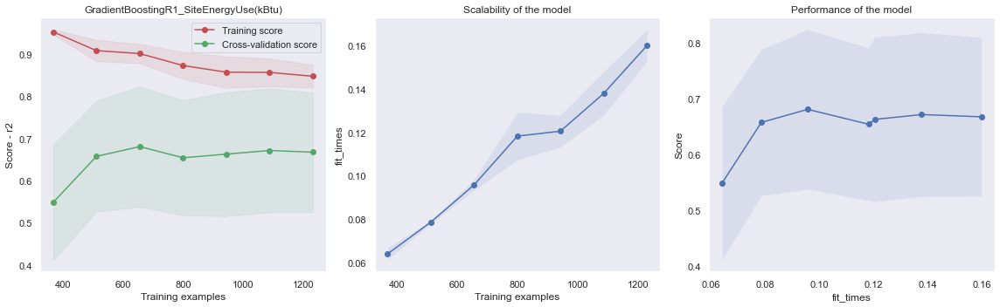

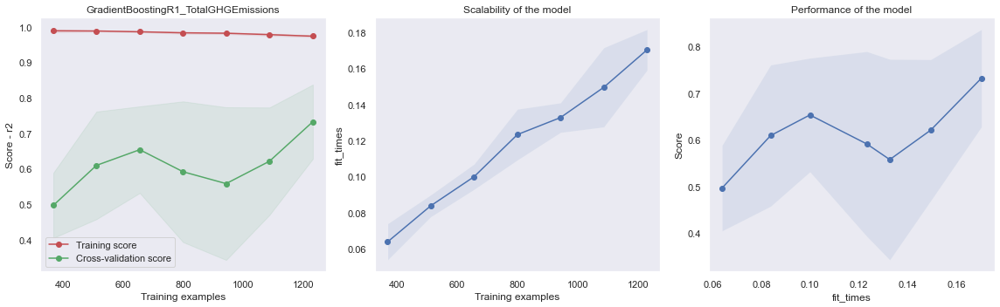

In [126]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [127]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [128]:
output_test_evaluation(model_name)

Model: GradientBoostingR1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.72 pour le test du modèle (cv ou gridsearch)
 0.64 pour l'évaluation avec le test set
eval score / test score : 0.88

Le metric neg_mean_absolute_error donne :
-3300322.79 pour le test du modèle (cv ou gridsearch)
-2957050.37 pour l'évaluation avec le test set
eval score / test score : 0.90

Le metric neg_root_mean_squared_error donne :
-9712022.08 pour le test du modèle (cv ou gridsearch)
-7165889.77 pour l'évaluation avec le test set
eval score / test score : 0.74

Le metric neg_mean_absolute_percentage_error donne :
-0.83 pour le test du modèle (cv ou gridsearch)
-0.62 pour l'évaluation avec le test set
eval score / test score : 0.75

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.75

#### Les Résidus

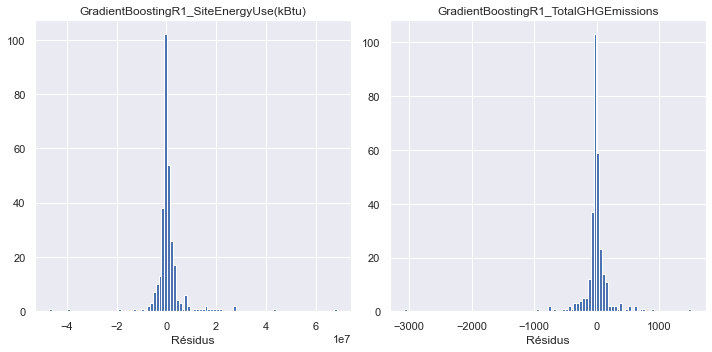

In [129]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

#### Importances des Features

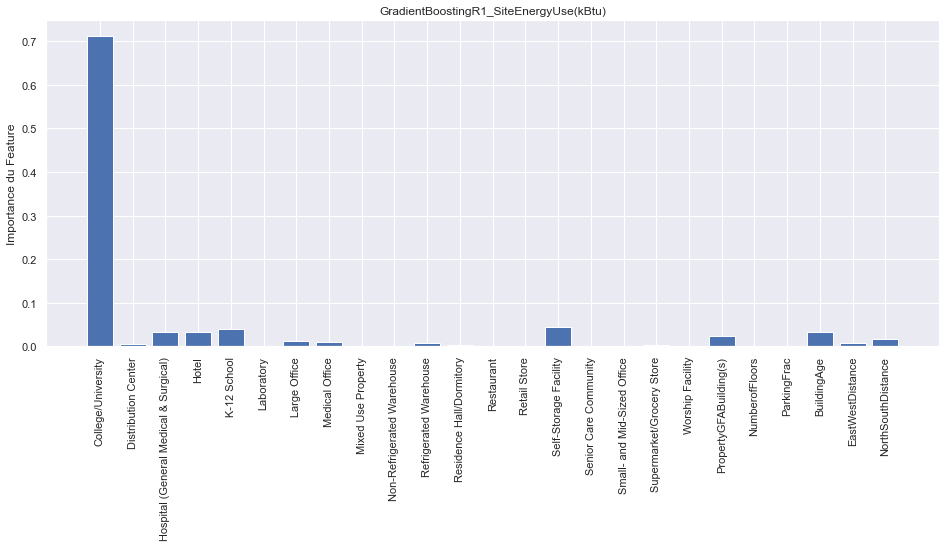

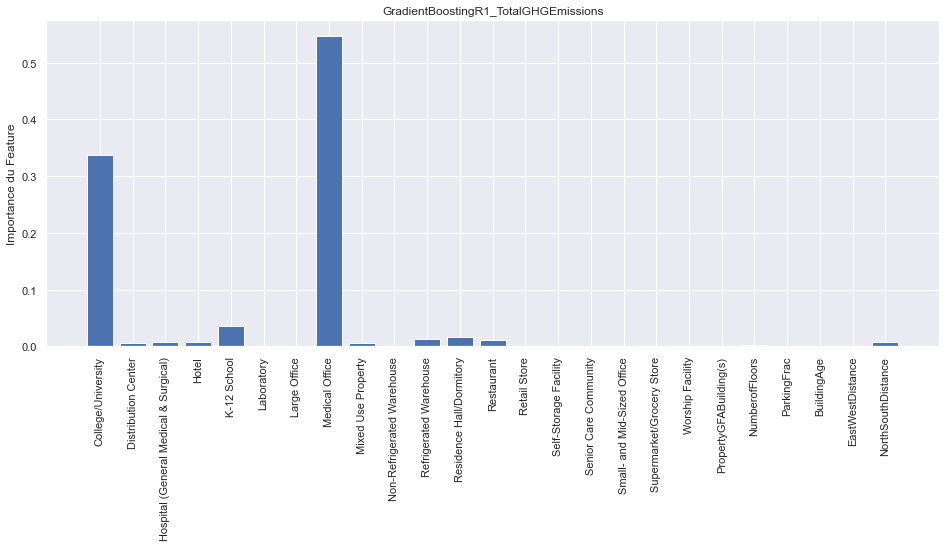

In [130]:
for pipeline, target in zip(pipelines, targets) :
    title = '_'.join([model_name, target]) 
    fitted_estimator=model_dict[title]['estimator'].fit(X_train, y_train[target])
    fig, ax = plt.subplots(figsize = (16, 6))
    plt.bar(X_train.columns.values, abs(fitted_estimator.named_steps.model.regressor_.feature_importances_))
    plt.title(title)
    plt.ylabel('Importance du Feature')
    plt.xticks(rotation = 'vertical')
    plt.show()

### 5.4.7 KNR1

In [131]:
model_name = 'KNR1'

In [132]:
model = KNeighborsRegressor()
param_grid = {
              'model__regressor__n_neighbors': range(1,11),
              'model__regressor__weights' : ['uniform', 'distance'],
              'model__regressor__leaf_size' : range(1,50,5)
               }

pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [133]:
output_evaluation(model_name)

Model: KNR1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__leaf_size': 1, 'model__regressor__n_neighbors': 2, 'model__regressor__weights': 'distance'}

Le metric r2 donne :
 1.00 +/-  0.00 pour le train sets
 0.60 +/-  0.15 pour le test sets
test score / train score : 1.67

Le metric neg_mean_absolute_error donne :
-0.04 +/-  0.01 pour le train sets
-4087804.53 +/-  818309.57 pour le test sets
test score / train score : 0.00

Le metric neg_root_mean_squared_error donne :
-0.29 +/-  0.12 pour le train sets
-11915824.72 +/-  4504266.57 pour le test sets
test score / train score : 0.00

Le metric neg_mean_absolute_percentage_error donne :
-0.00 +/-  0.00 pour le train sets
-0.94 +/-  0.21 pour le test sets
test score / train score : 0.00

Le temps d'entrainement est  7.05 +/- 8.51 ms.
__________________________________________________

Variable Ta

#### Courbe d'Apprentissage

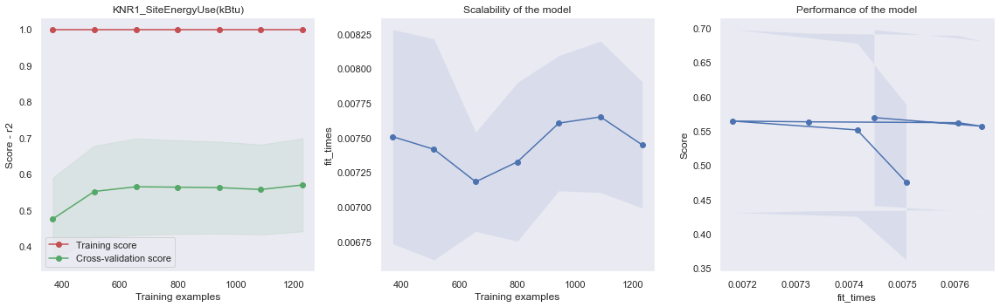

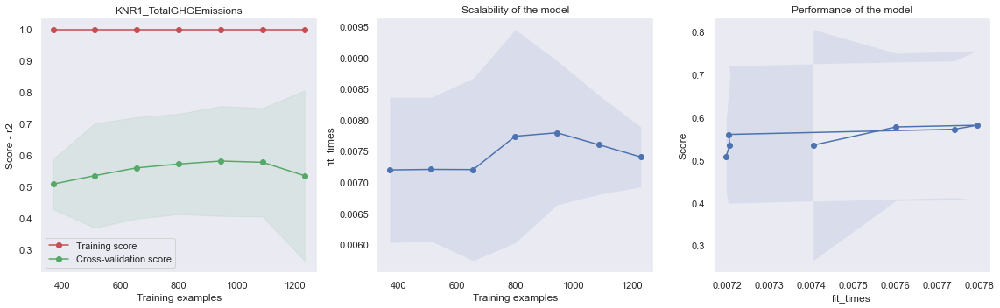

In [134]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [135]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [136]:
output_test_evaluation(model_name)

Model: KNR1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.60 pour le test du modèle (cv ou gridsearch)
 0.62 pour l'évaluation avec le test set
eval score / test score : 1.04

Le metric neg_mean_absolute_error donne :
-4087804.53 pour le test du modèle (cv ou gridsearch)
-3509168.30 pour l'évaluation avec le test set
eval score / test score : 0.86

Le metric neg_root_mean_squared_error donne :
-11915824.72 pour le test du modèle (cv ou gridsearch)
-7322619.90 pour l'évaluation avec le test set
eval score / test score : 0.61

Le metric neg_mean_absolute_percentage_error donne :
-0.94 pour le test du modèle (cv ou gridsearch)
-1.00 pour l'évaluation avec le test set
eval score / test score : 1.06

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.57 pour le test

#### Les Résidus

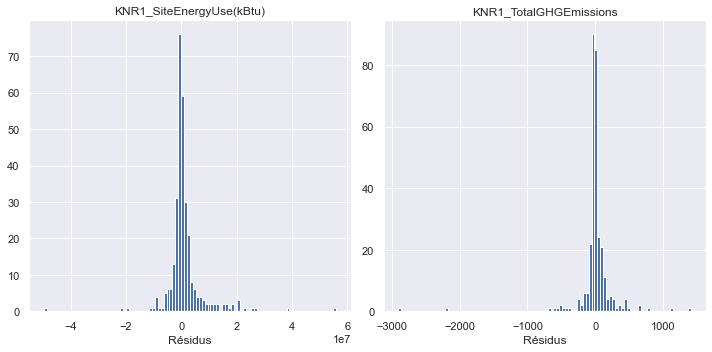

In [137]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 5.4.8 RandomForest1

In [138]:
model_name = 'RandomForestR1'

In [139]:
model = RandomForestRegressor()
param_grid = {
              'model__regressor__n_estimators' : [7, 8, 9, 10, 15, 20, 30, 40, 50, 100],
              'model__regressor__max_depth' : [50, 60, 70, 80, 90, 100, 110]
              }
pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [140]:
output_evaluation(model_name)

Model: RandomForestR1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__max_depth': 70, 'model__regressor__n_estimators': 30}

Le metric r2 donne :
 0.87 +/-  0.03 pour le train sets
 0.70 +/-  0.14 pour le test sets
test score / train score : 1.25

Le metric neg_mean_absolute_error donne :
-1601049.99 +/-  96788.40 pour le train sets
-3429529.70 +/-  599159.48 pour le test sets
test score / train score : 0.47

Le metric neg_root_mean_squared_error donne :
-7009950.49 +/-  1132899.51 pour le train sets
-10407179.72 +/-  4308173.23 pour le test sets
test score / train score : 0.67

Le metric neg_mean_absolute_percentage_error donne :
-0.22 +/-  0.01 pour le train sets
-0.87 +/-  0.46 pour le test sets
test score / train score : 0.25

Le temps d'entrainement est  121.62 +/- 0.60 ms.
__________________________________________________

Variable Target

#### Courbe d'Apprentissage

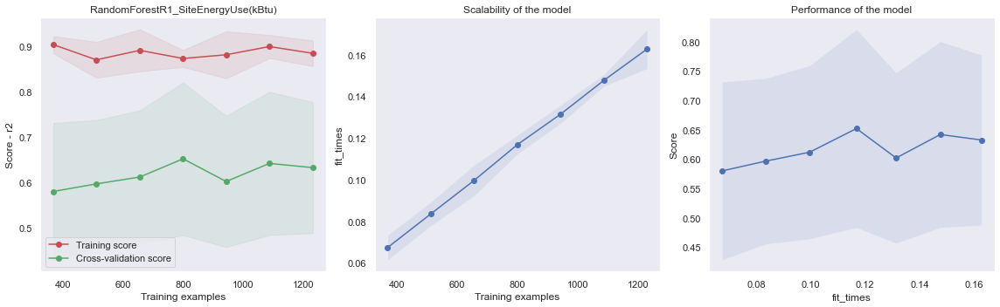

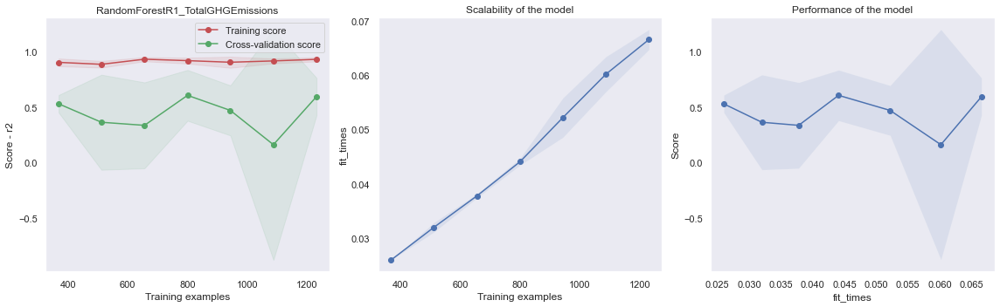

In [141]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [142]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [143]:
output_test_evaluation(model_name)

Model: RandomForestR1
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.70 pour le test du modèle (cv ou gridsearch)
 0.61 pour l'évaluation avec le test set
eval score / test score : 0.87

Le metric neg_mean_absolute_error donne :
-3429529.70 pour le test du modèle (cv ou gridsearch)
-3296496.52 pour l'évaluation avec le test set
eval score / test score : 0.96

Le metric neg_root_mean_squared_error donne :
-10407179.72 pour le test du modèle (cv ou gridsearch)
-7461051.13 pour l'évaluation avec le test set
eval score / test score : 0.72

Le metric neg_mean_absolute_percentage_error donne :
-0.87 pour le test du modèle (cv ou gridsearch)
-0.69 pour l'évaluation avec le test set
eval score / test score : 0.80

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.72 po

#### Les Résidus

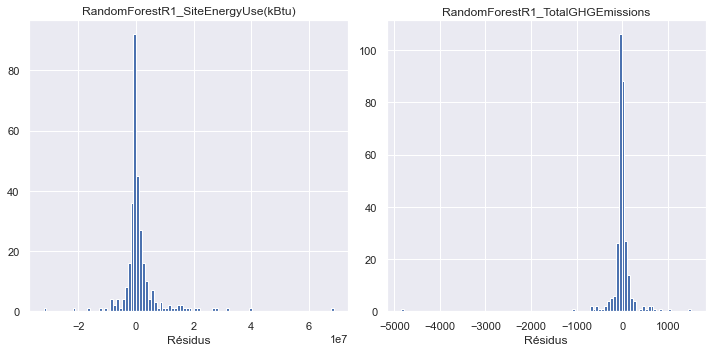

In [144]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

#### Importances des Features

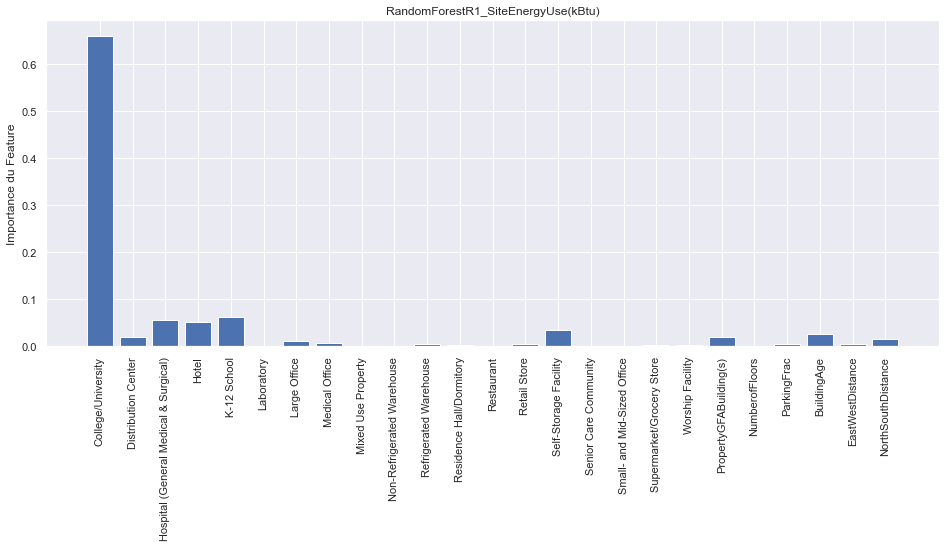

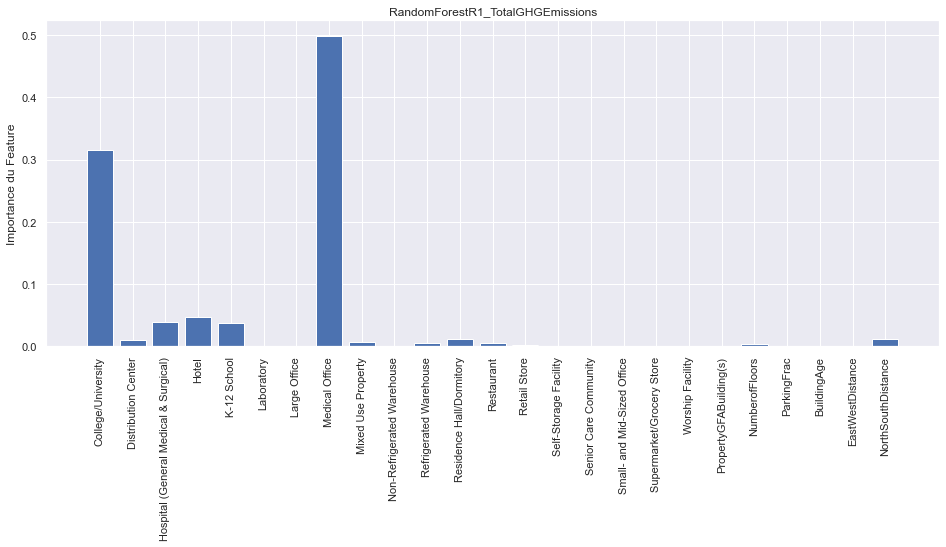

In [145]:
for pipeline, target in zip(pipelines, targets) :
    title = '_'.join([model_name, target]) 
    fitted_estimator=model_dict[title]['estimator'].fit(X_train, y_train[target])
    fig, ax = plt.subplots(figsize = (16, 6))
    plt.bar(X_train.columns.values, abs(fitted_estimator.named_steps.model.regressor_.feature_importances_))
    plt.title(title)
    plt.ylabel('Importance du Feature')
    plt.xticks(rotation = 'vertical')
    plt.show()

## 5.5 Evaluation - Version 1

In [318]:
model_list_bases = ['LinRegr', 'Ridge', 'Lasso', 'LinearSVR', 'SVR', 'GradientBoostingR', 'KNR', 'RandomForestR']
model_list = [m+'1' for m in model_list_bases]

In [319]:
targets = ['SiteEnergyUse(kBtu)', 'TotalGHGEmissions']
df_dict = output_model_evaluations(model_list, targets)

for target in targets:
    display(df_dict[target])

,train_r2,eval_r2,train_nMAE,eval_nMAE,train_nRMSE,eval_nRMSE,train_nMAPE,eval_nMAPE,train_time
LinRegr1,0.712082,0.546032,-3.175290e+06,-3.273238e+06,-1.014728e+07,-8.034696e+06,-0.744112,-0.602272,17.703390
Ridge1,0.730277,0.598024,-3.206088e+06,-3.126790e+06,-9.718456e+06,-7.560614e+06,-0.796823,-0.608432,7.940626
Lasso1,0.729041,0.615837,-3.161533e+06,-3.110090e+06,-9.648426e+06,-7.391198e+06,-0.743334,-0.593532,8.007812
LinearSVR1,0.746597,0.559514,-3.059635e+06,-3.236211e+06,-9.392652e+06,-7.914497e+06,-0.767186,-0.622061,163.191509
SVR1,0.763697,0.647766,-3.013286e+06,-3.007621e+06,-8.887818e+06,-7.077380e+06,-0.797851,-0.626381,47.659445
GradientBoostingR1,0.722018,0.638901,-3.300323e+06,-2.957050e+06,-9.712022e+06,-7.165890e+06,-0.825983,-0.622707,144.484377
KNR1,0.599745,0.622933,-4.087805e+06,-3.509168e+06,-1.191582e+07,-7.322620e+06,-0.941596,-0.999210,7.047367
RandomForestR1,0.696812,0.608541,-3.429530e+06,-3.296497e+06,-1.040718e+07,-7.461051e+06,-0.865140,-0.690489,121.624422


,train_r2,eval_r2,train_nMAE,eval_nMAE,train_nRMSE,eval_nRMSE,train_nMAPE,eval_nMAPE,train_time
LinRegr1,0.576515,-0.600829,-144.250071,-155.261151,-372.060797,-360.443341,-9.367170e+14,-5.966470,20.232534
Ridge1,0.594989,-0.312871,-149.119347,-156.728567,-373.921646,-326.419119,-8.971012e+14,-6.198352,8.003139
Lasso1,0.578025,-0.533636,-144.454210,-152.882742,-372.072881,-352.797611,-8.735610e+14,-5.929948,7.985210
LinearSVR1,0.574567,0.029074,-133.984117,-131.887433,-391.117313,-280.709738,-8.516921e+14,-4.739530,29.764938
SVR1,0.620344,0.119014,-103.234835,-99.430962,-358.820936,-267.392435,-9.805751e+14,-2.398128,4115.159702
GradientBoostingR1,0.751703,0.078280,-98.762668,-113.594803,-255.413185,-273.504272,-7.695211e+14,-3.184906,156.019115
KNR1,0.573593,0.056827,-115.749809,-107.298400,-375.254694,-276.668774,-1.200832e+15,-2.835881,6.921434
RandomForestR1,0.718345,0.178353,-107.965835,-115.004323,-292.493587,-258.230241,-9.589659e+14,-3.221941,53.147554


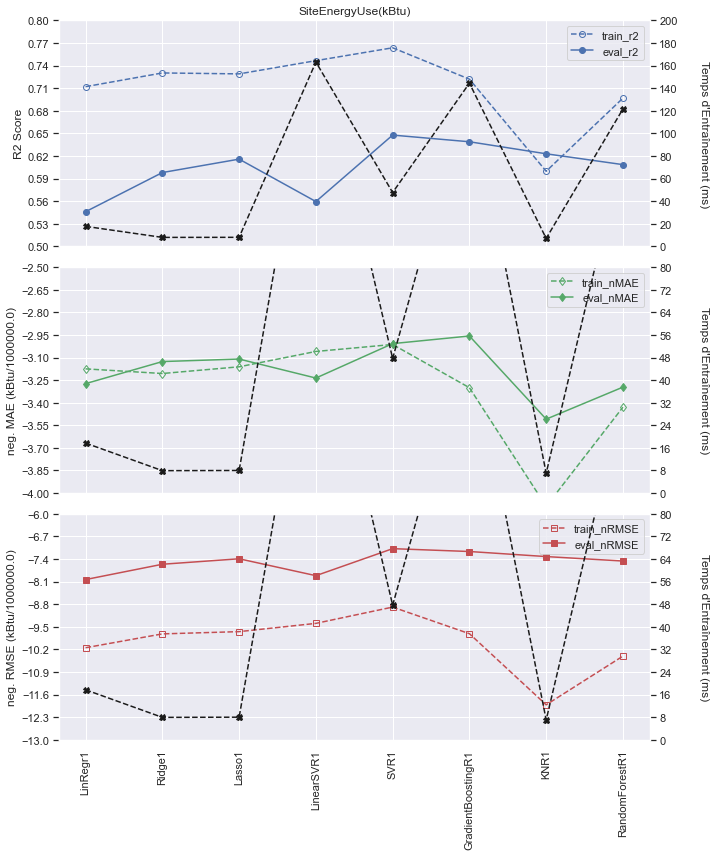

In [324]:
target = 'SiteEnergyUse(kBtu)'
data = df_dict[target]
scaling = 1e6
ylims = ((0.5,0.8), (-4, -2.5), (-13, -6), (0, 200), (0, 80), (0, 80))
plot_model_evaluations(df_dict[target], title = target, scaling = scaling, ylims = ylims)

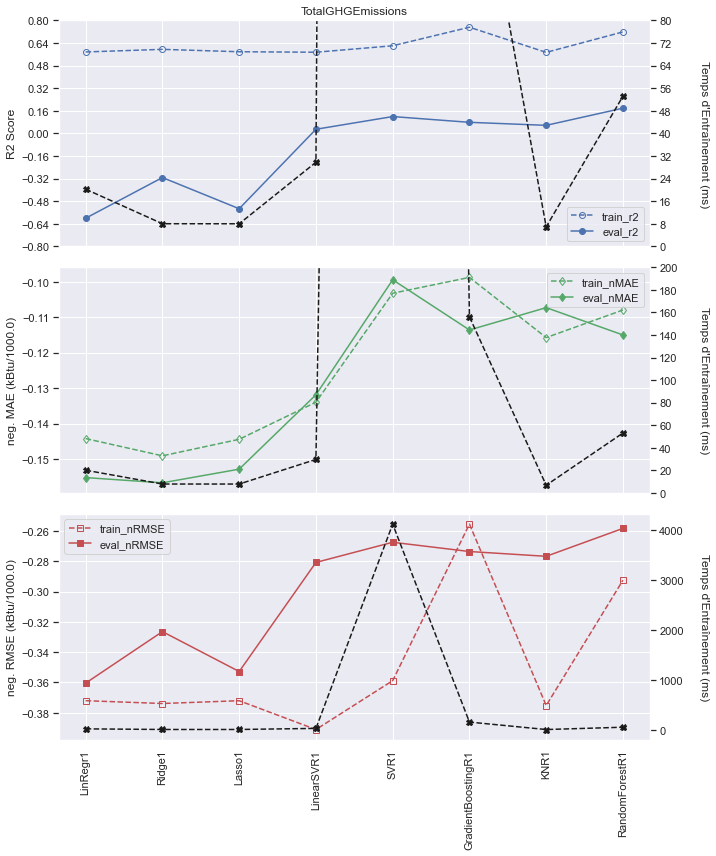

In [326]:
target = 'TotalGHGEmissions'
data = df_dict[target]
scaling = 1e3
ylims = ((-0.8,0.8), (None, None), (None, None), (0, 80), (0, 200), (None, None))
plot_model_evaluations(df_dict[target], title = target, scaling = scaling, ylims = ylims)

# 6. Modèles - Version 2

<a id="Section6.1"></a>

## 6.1 Les Features

In [164]:
propertyusetypes_groups = {'Office' : ['Office'],
                           'Parking' : ['Parking'],
                           'Non-Refrigerated Warehouse' : ['Non-Refrigerated Warehouse'],
                           'Retail Store' : ['Retail Store', 'Enclosed Mall', 'Other - Mall', 'Strip Mall',
                                            'Automobile Dealership', 'Wholesale Club/Supercenter'],
                           'Large Office' : ['Large Office'],
                           'Hotel' : ['Hotel'],
                           'Worship Facility' : ['Worship Facility'],
                           'Restaurant' : ['Restaurant', 'Fast Food Restaurant', 'Food Sales',
                                           'Other - Restaurant/Bar', 'Bar/Nightclub'],
                           'K-12 School' : ['K-12 School', 'Pre-school/Daycare'],
                           'Distribution Center' : ['Distribution Center'],
                           'Medical Office' : ['Medical Office', 'Outpatient Rehabilitation/Physical Therapy'],
                           'Supermarket/Grocery Store' : ['Supermarket/Grocery Store',
                                                          'Convenience Store without Gas Station'],
                           'Other - Recreation' : ['Other - Recreation', 'Fitness Center/Health Club/Gym', 
                                                   'Lifestyle Center', 'Museum'],
                           'Self-Storage Facility' : ['Self-Storage Facility'],
                           'Other - Entertainment/Public Assembly' : ['Other - Entertainment/Public Assembly',
                                                                      'Movie Theater', 'Performing Arts', 'Library',
                                                                     'Social/Meeting Hall', 'Convention Center'],
                           'Data Center' : ['Data Center'],
                           'Residence Hall/Dormitory' : ['Residence Hall/Dormitory', 'Other - Lodging/Residential',
                                                         'Multifamily Housing'],
                           'Laboratory' : ['Laboratory', 'Other - Technology/Science'],
                           'Other - Education' : ['Other - Education', 'Vocational School', 'Adult Education',
                                                  'College/University'],
                           'Residential Care Facility' : ['Residential Care Facility', 'Senior Care Community'],
                           'Other - Services' : ['Other - Services', 'Personal Services (Health/Beauty, Dry Cleaning, etc)',
                                                 'Repair Services (Vehicle, Shoe, Locksmith, etc)', 'Food Service'],
                           'Financial Office' : ['Financial Office', 'Bank Branch'],
                           'Refrigerated Warehouse' : ['Refrigerated Warehouse'],
                           'Other - Public Services': ['Other - Public Services', 'Fire Station', 'Police Station',
                                                       'Courthouse'],
                           'Hospital (General Medical & Surgical)' : ['Hospital (General Medical & Surgical)',
                                                                      'Other/Specialty Hospital',
                                                                      'Urgent Care/Clinic/Other Outpatient'],
                           'Other' : ['Other', 'Other - Utility', 'Prison/Incarceration', 'Manufacturing/Industrial Plant']}

propertyusetypes_dict = {}
for k, l in propertyusetypes_groups.items():
    for i in l :
        propertyusetypes_dict[i] = k

In [165]:
var = ['LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType']
suffix = "Gr1"
for v in var :
    dataset[v + suffix] = [propertyusetypes_dict[i] for i in dataset[v]]

In [166]:
suffix = "Gr1"
largestpropertyusetype_counts = dataset['LargestPropertyUseType'+suffix].value_counts().add(
                                dataset['SecondLargestPropertyUseType'+suffix].value_counts(), fill_value = 0).add(
                                dataset['ThirdLargestPropertyUseType'+suffix].value_counts(), fill_value = 0
                                 ).sort_values(ascending = False)
print(len(largestpropertyusetype_counts.iloc[:]))
largestpropertyusetype_counts.iloc[:]

26


Other                                    2127.0
Office                                    527.0
Parking                                   392.0
Retail Store                              244.0
Non-Refrigerated Warehouse                243.0
Large Office                              172.0
Restaurant                                 84.0
Hotel                                      77.0
Worship Facility                           75.0
K-12 School                                74.0
Other - Recreation                         68.0
Distribution Center                        63.0
Other - Entertainment/Public Assembly      62.0
Medical Office                             60.0
Residence Hall/Dormitory                   52.0
Supermarket/Grocery Store                  51.0
Other - Services                           44.0
Self-Storage Facility                      32.0
Other - Education                          31.0
Data Center                                28.0
Financial Office                        

In [167]:
var = ['LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType']
area = 'GFA'

dataset['BuildingPropertyUseTypeGFA'] = pd.DataFrame([np.where(dataset[v] != 'Parking', 
                                                     dataset[v+area], 0) for v in var ]).sum()
for v in var :
    dataset[v + 'Frac'] = dataset[v+area].divide(dataset['BuildingPropertyUseTypeGFA'])

In [168]:
suffix = "Gr1"
X_frachot = frachot_encode_feature(dataset, 'LargestPropertyUseType'+suffix, 'LargestPropertyUseTypeFrac').add(
            frachot_encode_feature(dataset, 'SecondLargestPropertyUseType'+suffix, 'SecondLargestPropertyUseTypeFrac'), 
                                   fill_value = 0).add(
            frachot_encode_feature(dataset, 'ThirdLargestPropertyUseType'+suffix, 'ThirdLargestPropertyUseTypeFrac'), fill_value = 0)

In [169]:
X_frachot.mean().sort_values(ascending = False)

Office                                   0.213676
Non-Refrigerated Warehouse               0.120359
Large Office                             0.105129
Parking                                  0.098953
Retail Store                             0.084655
Other                                    0.069491
Hotel                                    0.047627
Worship Facility                         0.044764
K-12 School                              0.039306
Distribution Center                      0.031999
Medical Office                           0.029110
Other - Entertainment/Public Assembly    0.027152
Supermarket/Grocery Store                0.026686
Other - Recreation                       0.026537
Residence Hall/Dormitory                 0.021303
Self-Storage Facility                    0.018062
Other - Education                        0.014889
Restaurant                               0.013668
Hospital (General Medical & Surgical)    0.012017
Residential Care Facility                0.011842


In [170]:
X_frachot = X_frachot.drop(columns=['Other','Parking', 'Other - Public Services'])

In [171]:
dataset['GFAperFloor'] = dataset['PropertyGFABuilding(s)'].divide(dataset['NumberofFloors'])

In [172]:
logscale_features = ['PropertyGFABuilding(s)']
log1pscale_features = ['ParkingFrac']
X = pd.concat([X_frachot, dataset[logscale_features + log1pscale_features]], axis = 1)

In [177]:
X.columns

Index(['Data Center', 'Distribution Center', 'Financial Office',
       'Hospital (General Medical & Surgical)', 'Hotel', 'K-12 School',
       'Laboratory', 'Large Office', 'Medical Office',
       'Non-Refrigerated Warehouse', 'Office', 'Other - Education',
       'Other - Entertainment/Public Assembly', 'Other - Recreation',
       'Other - Services', 'Refrigerated Warehouse',
       'Residence Hall/Dormitory', 'Residential Care Facility', 'Restaurant',
       'Retail Store', 'Self-Storage Facility', 'Supermarket/Grocery Store',
       'Worship Facility', 'PropertyGFABuilding(s)', 'ParkingFrac'],
      dtype='object')

#### Détails

In [389]:
display(dataset[(dataset['LargestPropertyUseTypeGr1'] == 'Data Center') ][
                ['LargestPropertyUseType', 'LargestPropertyUseTypeFrac',]])
display(dataset[(dataset['SecondLargestPropertyUseTypeGr1'] == 'Data Center') ][
                ['SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeFrac',]])
display(dataset[(dataset['ThirdLargestPropertyUseTypeGr1'] == 'Data Center') ][
                ['ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeFrac',]])

,LargestPropertyUseType,LargestPropertyUseTypeFrac
183,Data Center,1.00
490,Data Center,0.51
1483,Data Center,1.00


,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeFrac
66,Data Center,0.093130
86,Data Center,0.050841
251,Data Center,0.590461
271,Data Center,0.339853
275,Data Center,0.005797
409,Data Center,0.002203
425,Data Center,0.015161
427,Data Center,0.163068
455,Data Center,0.091532
525,Data Center,0.004932


,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeFrac
13,Data Center,0.002935
37,Data Center,0.002498
171,Data Center,0.001313
177,Data Center,0.002012
250,Data Center,0.332489
313,Data Center,0.046852
352,Data Center,0.054133
449,Data Center,0.049441
451,Data Center,0.027332
458,Data Center,0.004824


In [390]:
display(dataset[(dataset['LargestPropertyUseTypeGr1'] == 'Hospital (General Medical & Surgical)') ][
                ['LargestPropertyUseType', 'LargestPropertyUseTypeFrac',]])
display(dataset[(dataset['SecondLargestPropertyUseTypeGr1'] == 'Hospital (General Medical & Surgical)') ][
                ['SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeFrac',]])
display(dataset[(dataset['ThirdLargestPropertyUseTypeGr1'] == 'Hospital (General Medical & Surgical)') ][
                ['ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeFrac',]])

,LargestPropertyUseType,LargestPropertyUseTypeFrac
81,Hospital (General Medical & Surgical),1.0
96,Other/Specialty Hospital,1.0
98,Hospital (General Medical & Surgical),1.0
124,Hospital (General Medical & Surgical),1.0
126,Hospital (General Medical & Surgical),1.0
247,Urgent Care/Clinic/Other Outpatient,1.0
272,Urgent Care/Clinic/Other Outpatient,1.0
297,Hospital (General Medical & Surgical),1.0
550,Hospital (General Medical & Surgical),1.0
801,Other/Specialty Hospital,1.0


,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeFrac
1476,Hospital (General Medical & Surgical),0.4


,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeFrac
975,Other/Specialty Hospital,0.094297


In [391]:
display(dataset[(dataset['LargestPropertyUseTypeGr1'] == 'Refrigerated Warehouse') ][
                ['LargestPropertyUseType', 'LargestPropertyUseTypeFrac',]])
display(dataset[(dataset['SecondLargestPropertyUseTypeGr1'] == 'Refrigerated Warehouse') ][
                ['SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeFrac',]])
display(dataset[(dataset['ThirdLargestPropertyUseTypeGr1'] == 'Refrigerated Warehouse') ][
                ['ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeFrac',]])

,LargestPropertyUseType,LargestPropertyUseTypeFrac
340,Refrigerated Warehouse,0.960624
378,Refrigerated Warehouse,1.000000
696,Refrigerated Warehouse,1.000000
873,Refrigerated Warehouse,1.000000
1058,Refrigerated Warehouse,0.911777
1061,Refrigerated Warehouse,1.000000
1084,Refrigerated Warehouse,1.000000
1151,Refrigerated Warehouse,1.000000
1174,Refrigerated Warehouse,0.643224
1221,Refrigerated Warehouse,0.808824


,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeFrac
30,Refrigerated Warehouse,0.286604
695,Refrigerated Warehouse,0.156289
1206,Refrigerated Warehouse,0.303768


,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeFrac
537,Refrigerated Warehouse,0.087757


In [392]:
display(dataset[(dataset['LargestPropertyUseTypeGr1'] == 'Other - Education') ][
                ['LargestPropertyUseType', 'LargestPropertyUseTypeFrac',]])
display(dataset[(dataset['SecondLargestPropertyUseTypeGr1'] == 'Other - Education') ][
                ['SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeFrac',]])
display(dataset[(dataset['ThirdLargestPropertyUseTypeGr1'] == 'Other - Education') ][
                ['ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeFrac',]])

,LargestPropertyUseType,LargestPropertyUseTypeFrac
21,College/University,1.000000
85,College/University,1.000000
90,College/University,1.000000
513,College/University,1.000000
606,Other - Education,1.000000
609,College/University,1.000000
610,College/University,1.000000
655,College/University,1.000000
805,Other - Education,1.000000
864,Adult Education,1.000000


,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeFrac
33,Other - Education,0.133310
35,Vocational School,0.399986
213,College/University,0.079164
266,Adult Education,0.236889
457,Adult Education,0.185838
1402,Other - Education,0.405793


,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeFrac
203,Other - Education,0.039836
1357,Other - Education,0.053901


In [393]:
display(dataset[(dataset['LargestPropertyUseTypeGr1'] == 'Laboratory') ][
                ['LargestPropertyUseType', 'LargestPropertyUseTypeFrac',]])
display(dataset[(dataset['SecondLargestPropertyUseTypeGr1'] == 'Laboratory') ][
                ['SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeFrac',]])
display(dataset[(dataset['ThirdLargestPropertyUseTypeGr1'] == 'Laboratory') ][
                ['ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeFrac',]])

,LargestPropertyUseType,LargestPropertyUseTypeFrac
192,Laboratory,0.600011
275,Laboratory,0.994203
276,Laboratory,1.000000
286,Laboratory,1.000000
287,Laboratory,0.663591
482,Laboratory,1.000000
592,Laboratory,1.000000
631,Laboratory,0.849945
854,Laboratory,0.599983
1430,Laboratory,0.686275


,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeFrac
145,Laboratory,0.145885
240,Laboratory,0.135821
369,Laboratory,0.500000
565,Laboratory,0.267460
829,Laboratory,0.123750
1319,Laboratory,0.269980


,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeFrac
258,Laboratory,0.137194
381,Laboratory,0.311756
501,Other - Technology/Science,0.024413
502,Other - Technology/Science,0.033074


In [394]:
display(dataset[(dataset['LargestPropertyUseTypeGr1'] == 'Financial Office') ][
                ['LargestPropertyUseType', 'LargestPropertyUseTypeFrac',]])
display(dataset[(dataset['SecondLargestPropertyUseTypeGr1'] == 'Financial Office') ][
                ['SecondLargestPropertyUseType', 'SecondLargestPropertyUseTypeFrac',]])
display(dataset[(dataset['ThirdLargestPropertyUseTypeGr1'] == 'Financial Office') ][
                ['ThirdLargestPropertyUseType', 'ThirdLargestPropertyUseTypeFrac',]])

,LargestPropertyUseType,LargestPropertyUseTypeFrac
99,Financial Office,0.768133
553,Financial Office,1.000000
626,Bank Branch,1.000000
628,Financial Office,1.000000
647,Financial Office,0.799728
799,Bank Branch,1.000000
1292,Bank Branch,1.000000
1309,Bank Branch,1.000000
1318,Bank Branch,1.000000


,SecondLargestPropertyUseType,SecondLargestPropertyUseTypeFrac
507,Financial Office,0.069102
600,Bank Branch,0.085388
647,Bank Branch,0.200272
653,Bank Branch,0.304944
1197,Bank Branch,0.177191
1267,Bank Branch,0.273640
1434,Bank Branch,0.099150


,ThirdLargestPropertyUseType,ThirdLargestPropertyUseTypeFrac
173,Financial Office,0.119244
266,Bank Branch,0.046558
277,Financial Office,0.036731
284,Bank Branch,0.032576
426,Financial Office,0.249364
830,Bank Branch,0.043148
995,Bank Branch,0.114958
1242,Financial Office,0.138340
1375,Bank Branch,0.454791


<a id="Section6.2"></a>

## 6.2 Train/Test Dévision

In [173]:
y = dataset[targets]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, random_state = seed)

<a id="Section6.3"></a>

## 6.3 Préprocesseurs

In [178]:
preprocessor_X = create_preprocessor_X(logscale_features = logscale_features, log1pscale_features=log1pscale_features)
preprocessors_y = [create_preprocessor_y('log'), create_preprocessor_y('logp')]

<a id="Section6.4"></a>

## 6.4 Les Modèles

### 6.4.1 LinRegr2

In [179]:
model_name = 'LinRegr2'

In [180]:
model = LinearRegression()
param_grid = {'model__regressor__fit_intercept': [True, False],
              'model__regressor__normalize': [True, False]}


pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [181]:
output_evaluation(model_name)

Model: LinRegr2
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__fit_intercept': True, 'model__regressor__normalize': True}

Le metric r2 donne :
 0.82 +/-  0.04 pour le train sets
 0.42 +/-  0.71 pour le test sets
test score / train score : 1.98

Le metric neg_mean_absolute_error donne :
-2802962.92 +/-  121346.10 pour le train sets
-3177576.05 +/-  556181.91 pour le test sets
test score / train score : 0.88

Le metric neg_root_mean_squared_error donne :
-8281819.68 +/-  901657.49 pour le train sets
-11831049.75 +/-  5387998.68 pour le test sets
test score / train score : 0.70

Le metric neg_mean_absolute_percentage_error donne :
-0.74 +/-  0.09 pour le train sets
-0.79 +/-  0.44 pour le test sets
test score / train score : 0.93

Le temps d'entrainement est  12.11 +/- 2.67 ms.
__________________________________________________

Variable Target: 

#### Courbe d'Apprentissage

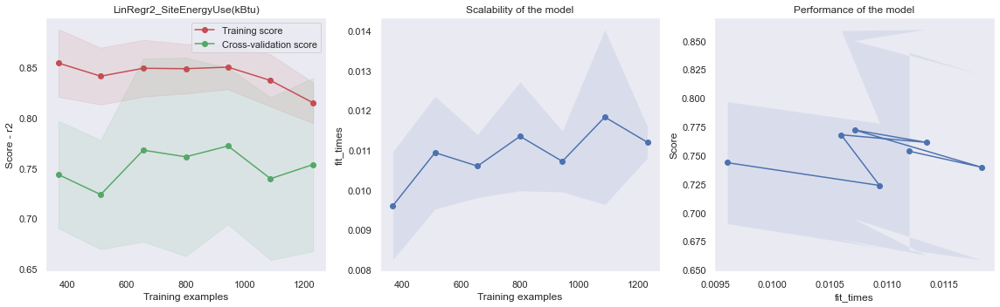

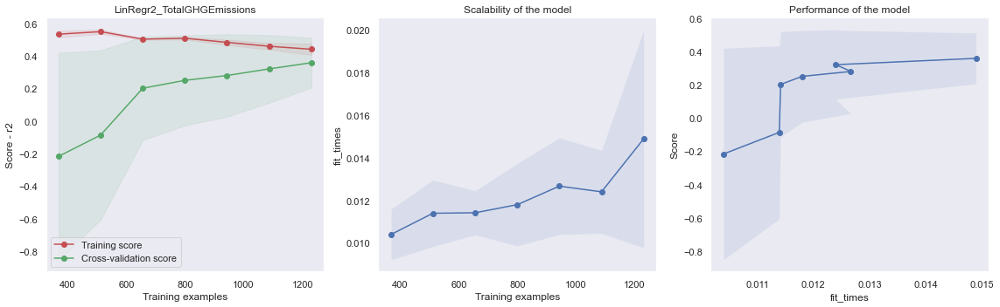

In [182]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [183]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [184]:
output_test_evaluation(model_name)

Model: LinRegr2
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.42 pour le test du modèle (cv ou gridsearch)
 0.54 pour l'évaluation avec le test set
eval score / test score : 1.30

Le metric neg_mean_absolute_error donne :
-3177576.05 pour le test du modèle (cv ou gridsearch)
-3248630.56 pour l'évaluation avec le test set
eval score / test score : 1.02

Le metric neg_root_mean_squared_error donne :
-11831049.75 pour le test du modèle (cv ou gridsearch)
-8069041.87 pour l'évaluation avec le test set
eval score / test score : 0.68

Le metric neg_mean_absolute_percentage_error donne :
-0.79 pour le test du modèle (cv ou gridsearch)
-0.58 pour l'évaluation avec le test set
eval score / test score : 0.73

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.41 pour le 

#### Les Résidus

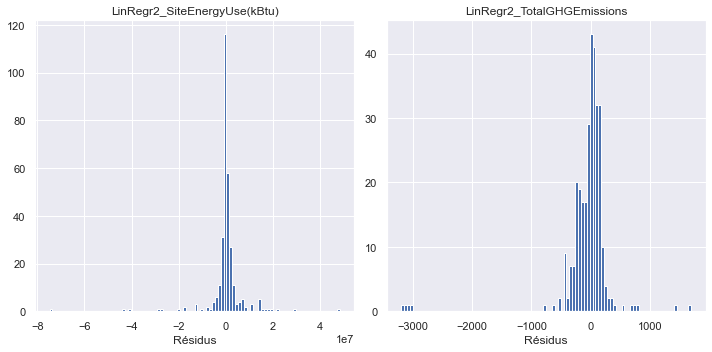

In [185]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 6.4.2 Ridge2

In [186]:
model_name = 'Ridge2'
model = Ridge()
param_grid = {'model__regressor__fit_intercept': [True, False],
              'model__regressor__alpha': np.logspace(-5,2,20),
                                }
pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [187]:
output_evaluation(model_name)

Model: Ridge2
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__alpha': 0.6158482110660255, 'model__regressor__fit_intercept': False}

Le metric r2 donne :
 0.79 +/-  0.04 pour le train sets
 0.78 +/-  0.12 pour le test sets
test score / train score : 1.01

Le metric neg_mean_absolute_error donne :
-2842112.36 +/-  135858.04 pour le train sets
-2930953.67 +/-  685192.85 pour le test sets
test score / train score : 0.97

Le metric neg_root_mean_squared_error donne :
-9070589.88 +/-  1235000.23 pour le train sets
-8842933.22 +/-  4109493.99 pour le test sets
test score / train score : 1.03

Le metric neg_mean_absolute_percentage_error donne :
-0.72 +/-  0.08 pour le train sets
-0.75 +/-  0.37 pour le test sets
test score / train score : 0.96

Le temps d'entrainement est  9.80 +/- 2.13 ms.
__________________________________________________

Variable 

#### Courbe d'Apprentissage

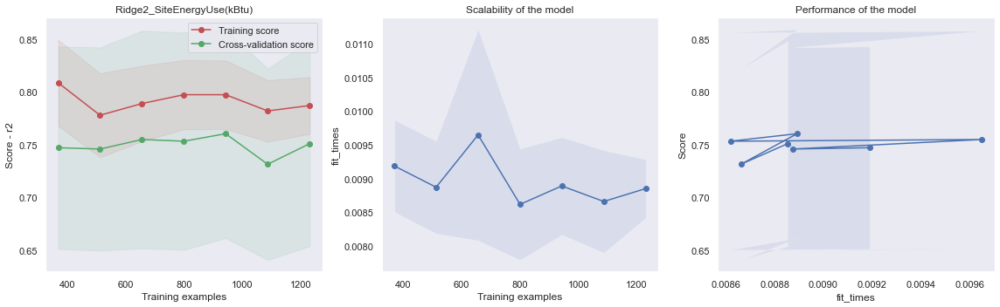

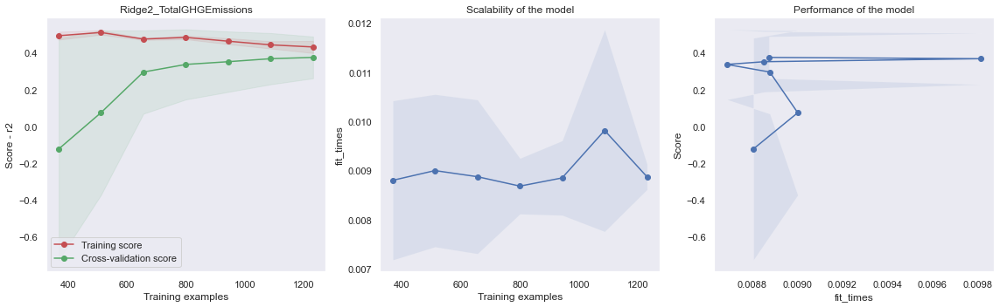

In [188]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [189]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [190]:
output_test_evaluation(model_name)

Model: Ridge2
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.78 pour le test du modèle (cv ou gridsearch)
 0.60 pour l'évaluation avec le test set
eval score / test score : 0.77

Le metric neg_mean_absolute_error donne :
-2930953.67 pour le test du modèle (cv ou gridsearch)
-3156324.69 pour l'évaluation avec le test set
eval score / test score : 1.08

Le metric neg_root_mean_squared_error donne :
-8842933.22 pour le test du modèle (cv ou gridsearch)
-7509657.53 pour l'évaluation avec le test set
eval score / test score : 0.85

Le metric neg_mean_absolute_percentage_error donne :
-0.75 pour le test du modèle (cv ou gridsearch)
-0.57 pour l'évaluation avec le test set
eval score / test score : 0.77

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.46 pour le tes

#### Les Résidus

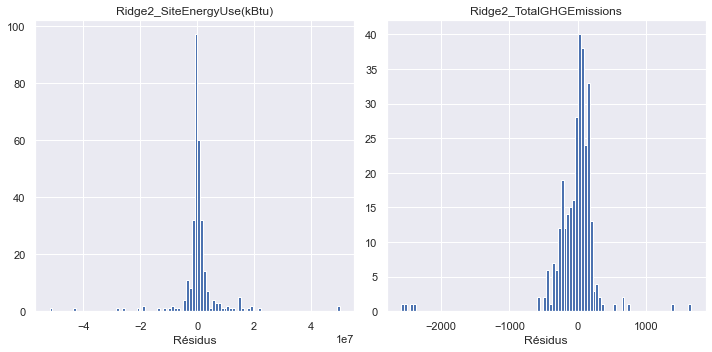

In [191]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 6.4.3 Lasso2

In [192]:
model_name = 'Lasso2'

In [193]:
model = Lasso()
param_grid = {'model__regressor__fit_intercept': [True, False],
              'model__regressor__alpha': np.logspace(-6,1,20),
                                }
pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [194]:
output_evaluation(model_name)

Model: Lasso2
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__alpha': 0.0008858667904100823, 'model__regressor__fit_intercept': False}

Le metric r2 donne :
 0.80 +/-  0.04 pour le train sets
 0.78 +/-  0.12 pour le test sets
test score / train score : 1.02

Le metric neg_mean_absolute_error donne :
-2836041.75 +/-  132504.68 pour le train sets
-2933446.85 +/-  685557.27 pour le test sets
test score / train score : 0.97

Le metric neg_root_mean_squared_error donne :
-8931824.91 +/-  1190730.44 pour le train sets
-8797240.96 +/-  4082747.51 pour le test sets
test score / train score : 1.02

Le metric neg_mean_absolute_percentage_error donne :
-0.72 +/-  0.08 pour le train sets
-0.74 +/-  0.37 pour le test sets
test score / train score : 0.96

Le temps d'entrainement est  9.27 +/- 1.55 ms.
__________________________________________________

Variab

#### Courbe d'Apprentissage

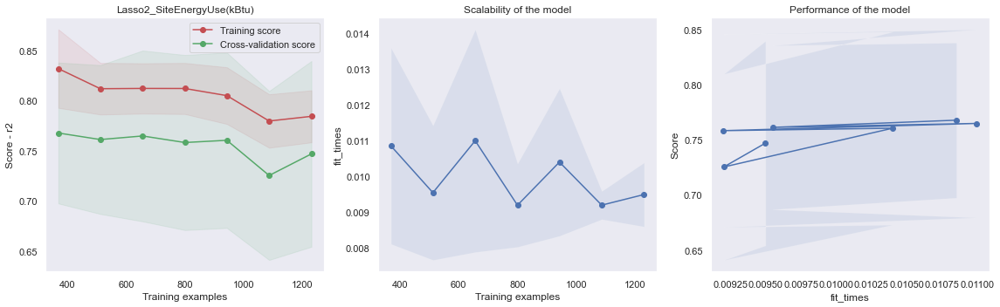

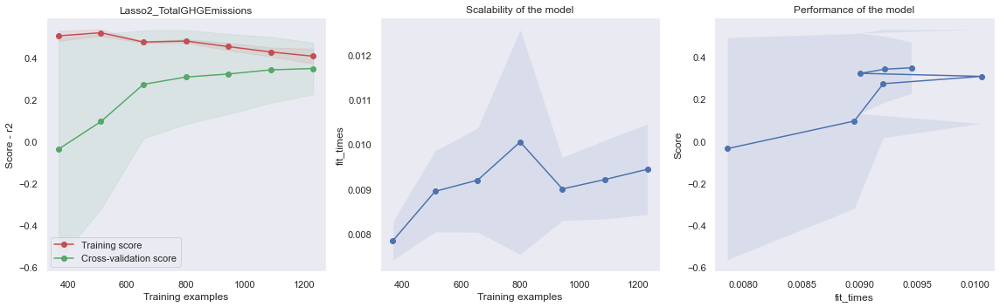

In [195]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [196]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [197]:
output_test_evaluation(model_name)

Model: Lasso2
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.78 pour le test du modèle (cv ou gridsearch)
 0.63 pour l'évaluation avec le test set
eval score / test score : 0.80

Le metric neg_mean_absolute_error donne :
-2933446.85 pour le test du modèle (cv ou gridsearch)
-3105815.22 pour l'évaluation avec le test set
eval score / test score : 1.06

Le metric neg_root_mean_squared_error donne :
-8797240.96 pour le test du modèle (cv ou gridsearch)
-7291992.66 pour l'évaluation avec le test set
eval score / test score : 0.83

Le metric neg_mean_absolute_percentage_error donne :
-0.74 pour le test du modèle (cv ou gridsearch)
-0.57 pour l'évaluation avec le test set
eval score / test score : 0.77

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.43 pour le tes

#### Les Résidus

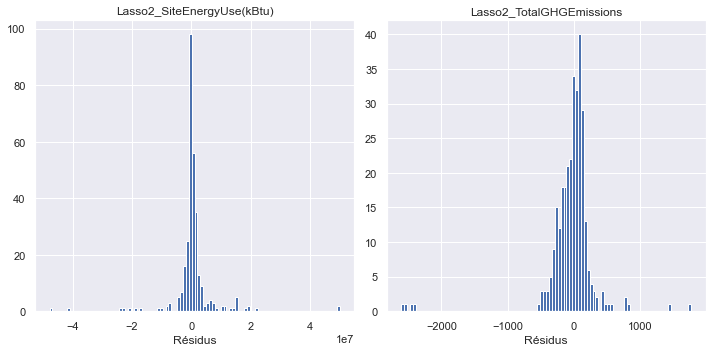

In [198]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

#### Importances des Features

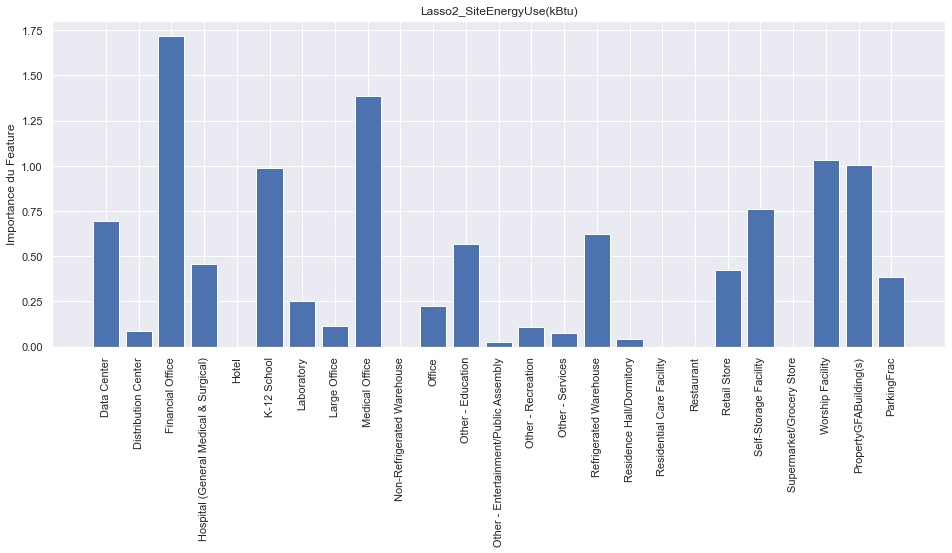

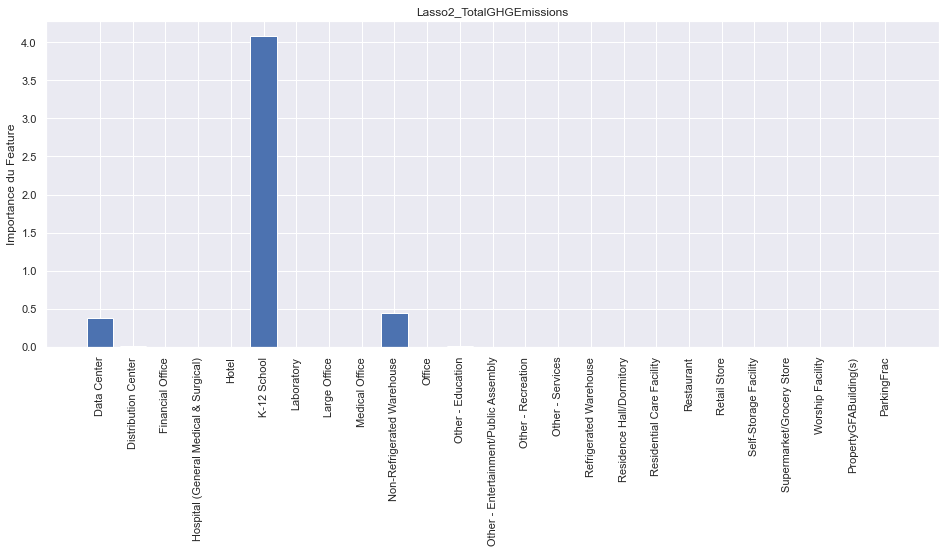

In [199]:
for pipeline, target in zip(pipelines, targets) :
    title = '_'.join([model_name, target]) 
    fitted_estimator=model_dict[title]['estimator'].fit(X_train, y_train[target])
    fig, ax = plt.subplots(figsize = (16, 6))
    plt.bar(X_train.columns.values, abs(fitted_estimator.named_steps.model.regressor_.coef_))
    plt.title(title)
    plt.ylabel('Importance du Feature')
    plt.xticks(rotation = 'vertical')
    plt.show()

### 6.4.4 LinearSVR2

In [200]:
model_name = 'LinearSVR2'

In [201]:
model = LinearSVR(max_iter=10000, fit_intercept = False)
param_grid = {'model__regressor__C': np.logspace(-2,2,10),
              'model__regressor__epsilon' : np.logspace(-5,0,10)}

pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

#### Evaluation de l'Entraînement

In [202]:
output_evaluation(model_name)

Model: LinearSVR2
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__C': 1.6681005372000592, 'model__regressor__epsilon': 0.2782559402207126}

Le metric r2 donne :
 0.80 +/-  0.03 pour le train sets
 0.78 +/-  0.11 pour le test sets
test score / train score : 1.03

Le metric neg_mean_absolute_error donne :
-2839145.33 +/-  124719.09 pour le train sets
-2951922.67 +/-  638455.29 pour le test sets
test score / train score : 0.96

Le metric neg_root_mean_squared_error donne :
-8899169.36 +/-  1051866.09 pour le train sets
-8998875.44 +/-  4013055.49 pour le test sets
test score / train score : 0.99

Le metric neg_mean_absolute_percentage_error donne :
-0.74 +/-  0.08 pour le train sets
-0.76 +/-  0.38 pour le test sets
test score / train score : 0.96

Le temps d'entrainement est  13.97 +/- 1.35 ms.
__________________________________________________

V

#### Courbe d'Apprentissage

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

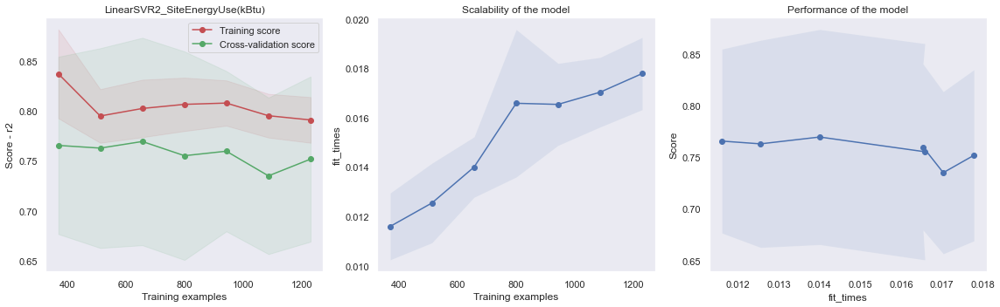

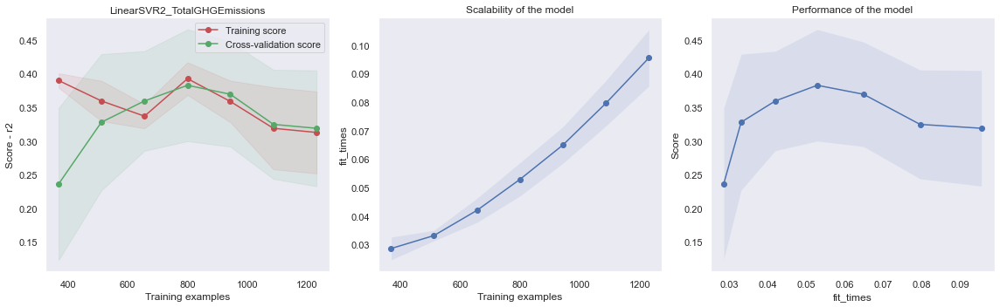

In [203]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [204]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


In [205]:
output_test_evaluation(model_name)

Model: LinearSVR2
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.78 pour le test du modèle (cv ou gridsearch)
 0.49 pour l'évaluation avec le test set
eval score / test score : 0.63

Le metric neg_mean_absolute_error donne :
-2951922.67 pour le test du modèle (cv ou gridsearch)
-3335499.28 pour l'évaluation avec le test set
eval score / test score : 1.13

Le metric neg_root_mean_squared_error donne :
-8998875.44 pour le test du modèle (cv ou gridsearch)
-8503991.16 pour l'évaluation avec le test set
eval score / test score : 0.95

Le metric neg_mean_absolute_percentage_error donne :
-0.76 pour le test du modèle (cv ou gridsearch)
-0.60 pour l'évaluation avec le test set
eval score / test score : 0.78

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.41 pour le

#### Les Résidus

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


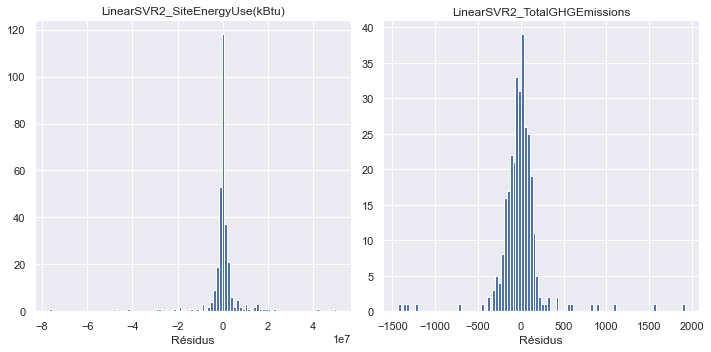

In [206]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

#### Importances des Features

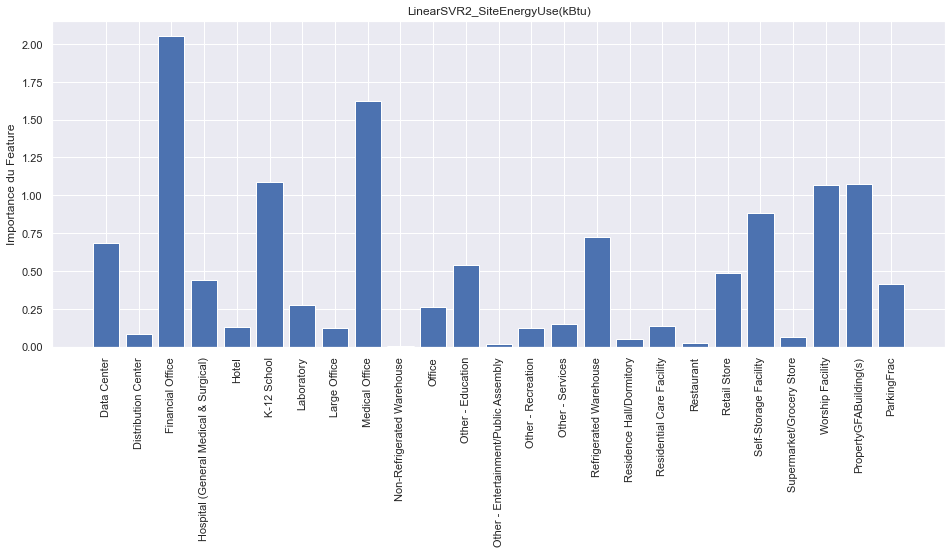

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


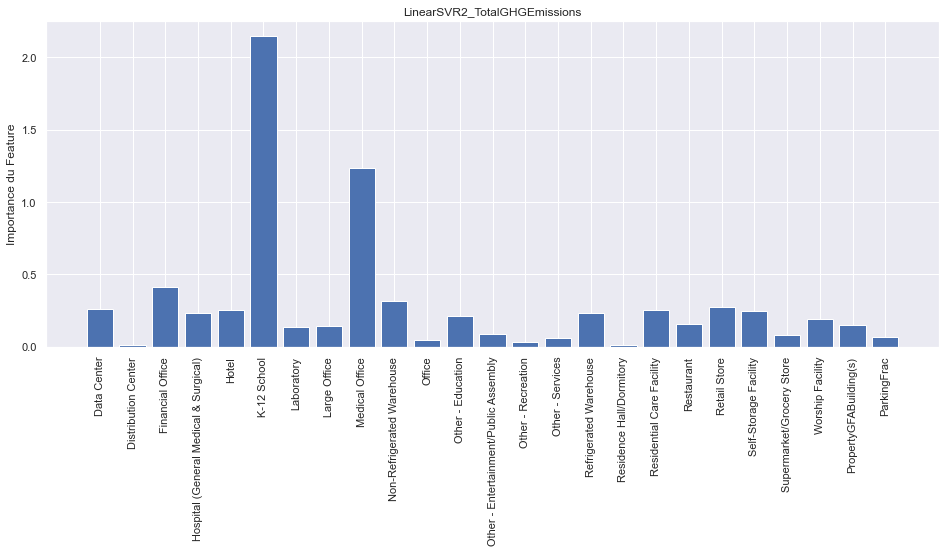

In [207]:
for pipeline, target in zip(pipelines, targets) :
    title = '_'.join([model_name, target]) 
    fitted_estimator=model_dict[title]['estimator'].fit(X_train, y_train[target])
    fig, ax = plt.subplots(figsize = (16, 6))
    plt.bar(X_train.columns.values, abs(fitted_estimator.named_steps.model.regressor_.coef_))
    plt.title(title)
    plt.ylabel('Importance du Feature')
    plt.xticks(rotation = 'vertical')
    plt.show()

### 6.4.5 SVR2

In [208]:
model_name = 'SVR2'

In [209]:
model = SVR()
param_grid = {
              'model__regressor__C': np.logspace(2,5,5),
              'model__regressor__epsilon' : np.logspace(-5,1,5),
              'model__regressor__gamma' : [0.001]#np.logspace(-5,-1,5),
                  }
pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [210]:
output_evaluation(model_name)

Model: SVR2
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__C': 562.341325190349, 'model__regressor__epsilon': 0.31622776601683794, 'model__regressor__gamma': 0.001}

Le metric r2 donne :
 0.81 +/-  0.04 pour le train sets
 0.82 +/-  0.12 pour le test sets
test score / train score : 0.99

Le metric neg_mean_absolute_error donne :
-2785635.87 +/-  147602.87 pour le train sets
-2851140.65 +/-  676299.17 pour le test sets
test score / train score : 0.98

Le metric neg_root_mean_squared_error donne :
-8637798.94 +/-  1375513.63 pour le train sets
-7944651.47 +/-  4067464.54 pour le test sets
test score / train score : 1.09

Le metric neg_mean_absolute_percentage_error donne :
-0.79 +/-  0.11 pour le train sets
-0.83 +/-  0.47 pour le test sets
test score / train score : 0.96

Le temps d'entrainement est  39.00 +/- 2.60 ms.
__________________________

#### Courbe d'Apprentissage

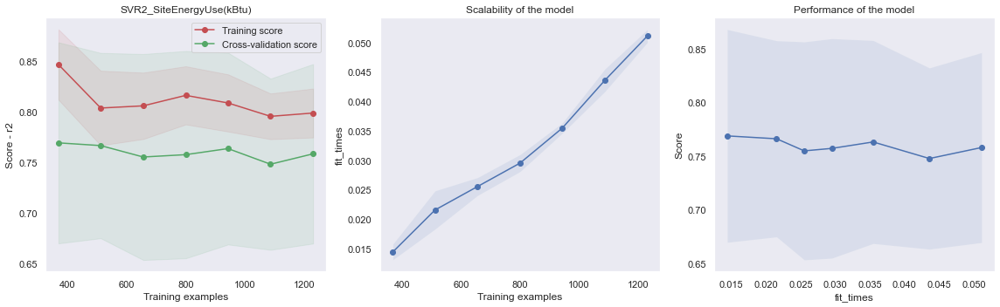

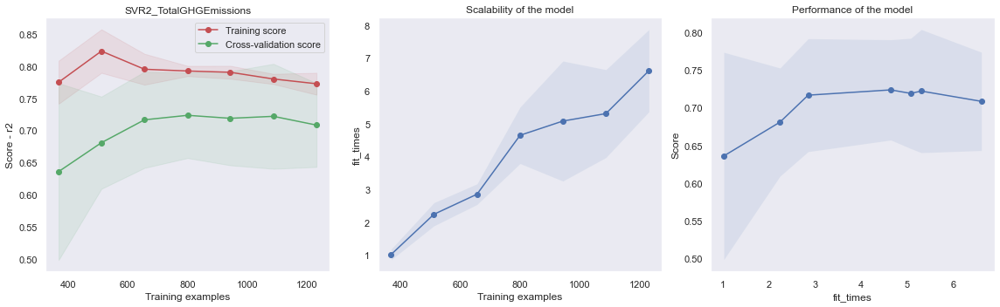

In [211]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [212]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [213]:
output_test_evaluation(model_name)

Model: SVR2
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.82 pour le test du modèle (cv ou gridsearch)
 0.62 pour l'évaluation avec le test set
eval score / test score : 0.76

Le metric neg_mean_absolute_error donne :
-2851140.65 pour le test du modèle (cv ou gridsearch)
-3109032.46 pour l'évaluation avec le test set
eval score / test score : 1.09

Le metric neg_root_mean_squared_error donne :
-7944651.47 pour le test du modèle (cv ou gridsearch)
-7343536.14 pour l'évaluation avec le test set
eval score / test score : 0.92

Le metric neg_mean_absolute_percentage_error donne :
-0.83 pour le test du modèle (cv ou gridsearch)
-0.61 pour l'évaluation avec le test set
eval score / test score : 0.73

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.73 pour le test 

#### Les Résidus

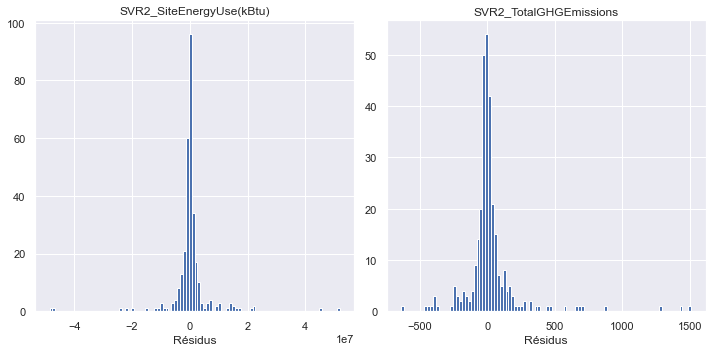

In [214]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 6.4.6 GradientBoostingR2

In [215]:
model_name = 'GradientBoostingR2'

In [216]:
model = GradientBoostingRegressor()
param_grid = {'model__regressor__learning_rate' : np.logspace(-3,0,5)}

pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [217]:
output_evaluation(model_name)

Model: GradientBoostingR2
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__learning_rate': 0.1778279410038923}

Le metric r2 donne :
 0.95 +/-  0.00 pour le train sets
 0.75 +/-  0.14 pour le test sets
test score / train score : 1.26

Le metric neg_mean_absolute_error donne :
-1862120.75 +/-  46693.22 pour le train sets
-3045637.92 +/-  597187.35 pour le test sets
test score / train score : 0.61

Le metric neg_root_mean_squared_error donne :
-4341495.52 +/-  72421.63 pour le train sets
-8967445.50 +/-  3756379.38 pour le test sets
test score / train score : 0.48

Le metric neg_mean_absolute_percentage_error donne :
-0.49 +/-  0.05 pour le train sets
-0.82 +/-  0.48 pour le test sets
test score / train score : 0.60

Le temps d'entrainement est  91.20 +/- 1.17 ms.
__________________________________________________

Variable Target: TotalGHGEmission

#### Courbe d'Apprentissage

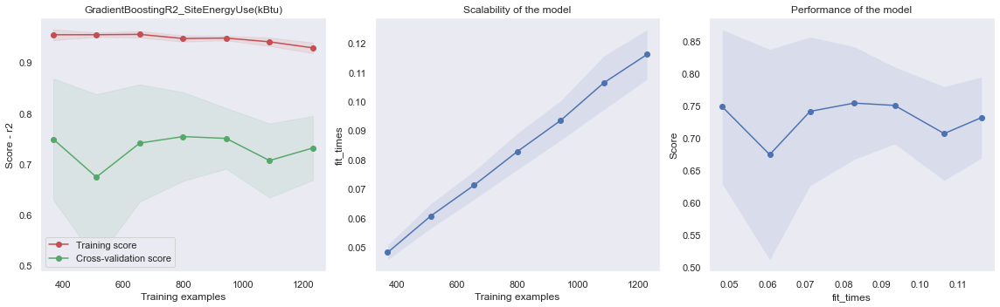

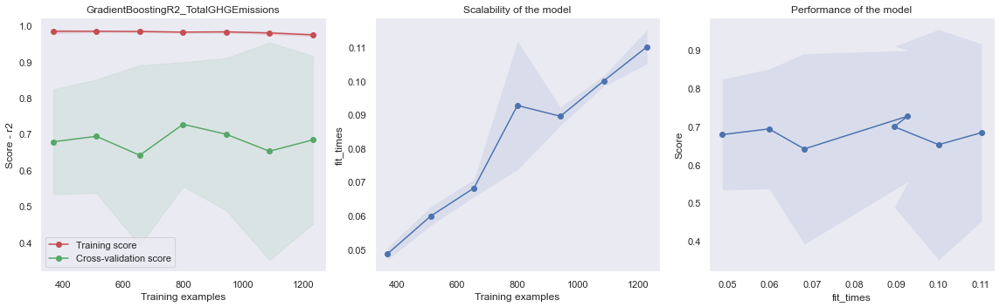

In [218]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [219]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [220]:
output_test_evaluation(model_name)

Model: GradientBoostingR2
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.75 pour le test du modèle (cv ou gridsearch)
 0.74 pour l'évaluation avec le test set
eval score / test score : 0.99

Le metric neg_mean_absolute_error donne :
-3045637.92 pour le test du modèle (cv ou gridsearch)
-2817490.74 pour l'évaluation avec le test set
eval score / test score : 0.93

Le metric neg_root_mean_squared_error donne :
-8967445.50 pour le test du modèle (cv ou gridsearch)
-6036018.68 pour l'évaluation avec le test set
eval score / test score : 0.67

Le metric neg_mean_absolute_percentage_error donne :
-0.82 pour le test du modèle (cv ou gridsearch)
-0.58 pour l'évaluation avec le test set
eval score / test score : 0.70

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.79

#### Les Résidus

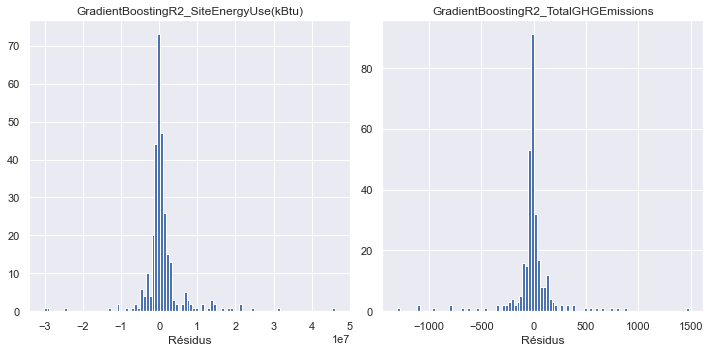

In [221]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

#### Importances des Features

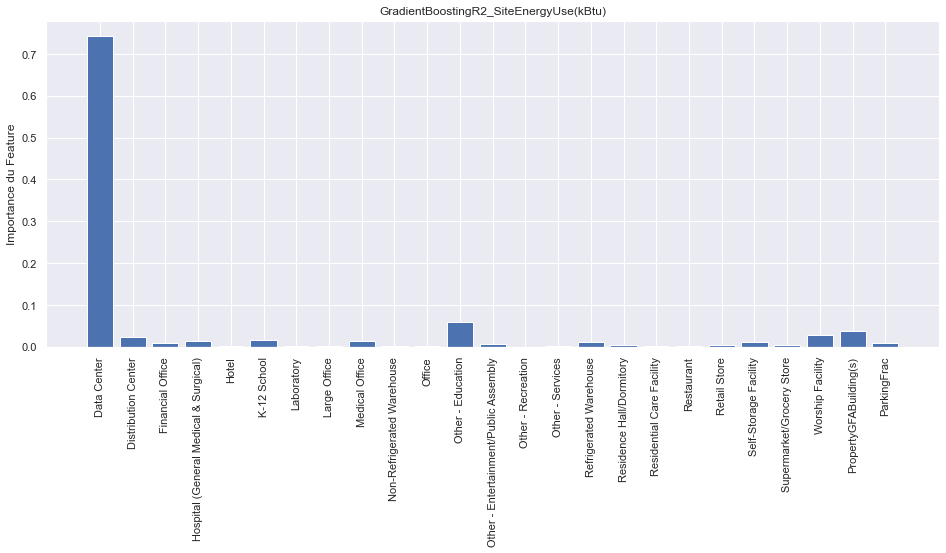

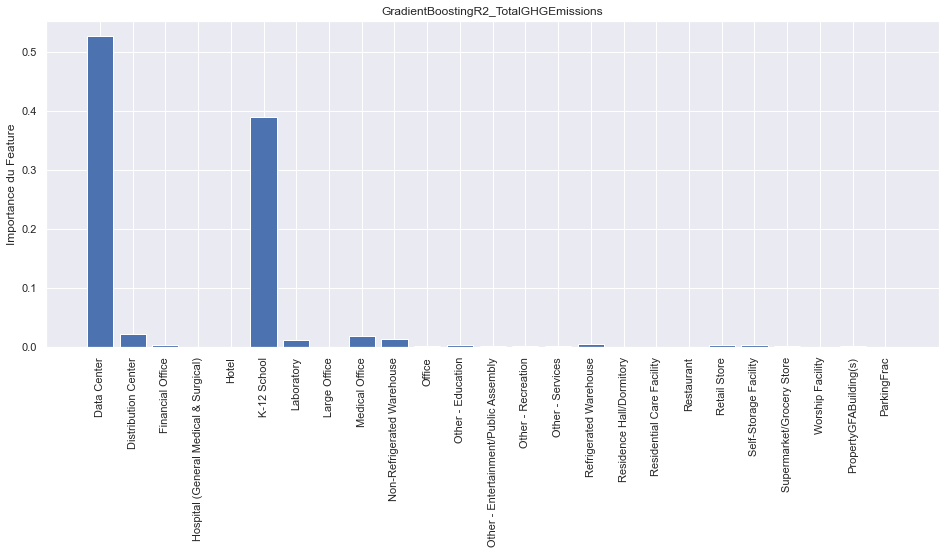

In [222]:
for pipeline, target in zip(pipelines, targets) :
    title = '_'.join([model_name, target]) 
    fitted_estimator=model_dict[title]['estimator'].fit(X_train, y_train[target])
    fig, ax = plt.subplots(figsize = (16, 6))
    plt.bar(X_train.columns.values, abs(fitted_estimator.named_steps.model.regressor_.feature_importances_))
    plt.title(title)
    plt.ylabel('Importance du Feature')
    plt.xticks(rotation = 'vertical')
    plt.show()

### 6.4.7 KNR2

In [223]:
model_name = 'KNR2'

In [224]:
model = KNeighborsRegressor()
param_grid = {
              'model__regressor__n_neighbors': range(1,11),
              'model__regressor__weights' : ['uniform', 'distance'],
              'model__regressor__leaf_size' : range(1,50,5)
               }

pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [225]:
output_evaluation(model_name)

Model: KNR2
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__leaf_size': 1, 'model__regressor__n_neighbors': 2, 'model__regressor__weights': 'uniform'}

Le metric r2 donne :
 0.85 +/-  0.04 pour le train sets
 0.72 +/-  0.15 pour le test sets
test score / train score : 1.19

Le metric neg_mean_absolute_error donne :
-2190435.66 +/-  157173.21 pour le train sets
-3521803.93 +/-  652333.35 pour le test sets
test score / train score : 0.62

Le metric neg_root_mean_squared_error donne :
-7587098.43 +/-  1377279.91 pour le train sets
-9896949.94 +/-  4482835.18 pour le test sets
test score / train score : 0.77

Le metric neg_mean_absolute_percentage_error donne :
-0.37 +/-  0.02 pour le train sets
-0.93 +/-  0.49 pour le test sets
test score / train score : 0.40

Le temps d'entrainement est  8.00 +/- 0.63 ms.
__________________________________________

#### Courbe d'Apprentissage

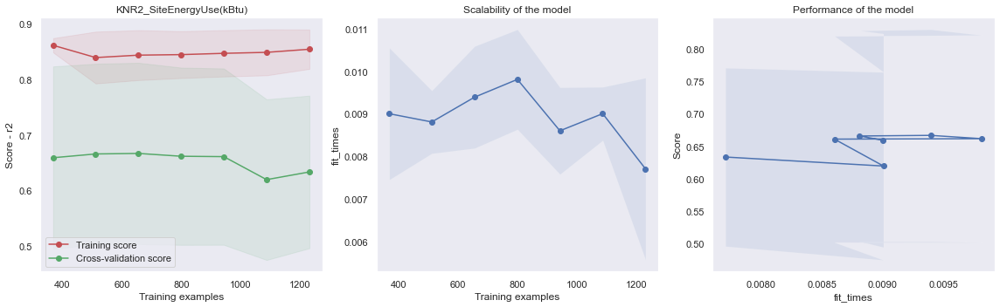

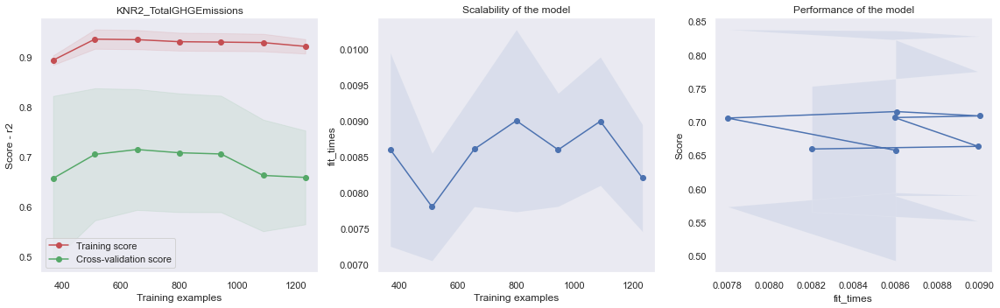

In [226]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [227]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [228]:
output_test_evaluation(model_name)

Model: KNR2
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.72 pour le test du modèle (cv ou gridsearch)
 0.65 pour l'évaluation avec le test set
eval score / test score : 0.91

Le metric neg_mean_absolute_error donne :
-3521803.93 pour le test du modèle (cv ou gridsearch)
-3236138.82 pour l'évaluation avec le test set
eval score / test score : 0.92

Le metric neg_root_mean_squared_error donne :
-9896949.94 pour le test du modèle (cv ou gridsearch)
-7057233.96 pour l'évaluation avec le test set
eval score / test score : 0.71

Le metric neg_mean_absolute_percentage_error donne :
-0.93 pour le test du modèle (cv ou gridsearch)
-0.72 pour l'évaluation avec le test set
eval score / test score : 0.77

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.74 pour le test 

#### Les Résidus

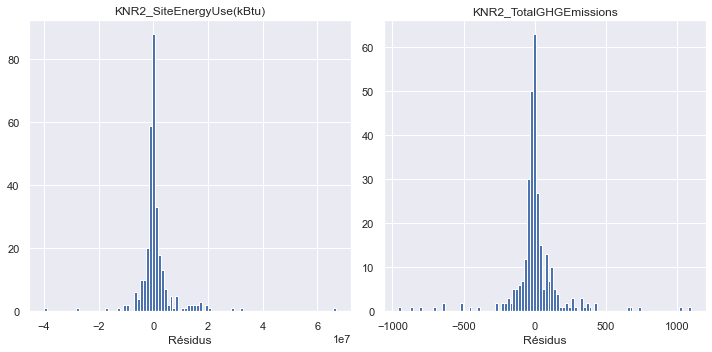

In [229]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 6.4.8 RandomForestR2

In [230]:
model_name = 'RandomForestR2'

In [231]:
model = RandomForestRegressor()
param_grid = {
              'model__regressor__n_estimators' : [7, 8, 9, 10, 15, 20, 30, 40, 50, 100],
              'model__regressor__max_depth' : [50, 60, 70, 80, 90, 100, 110]
              }
pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [232]:
output_evaluation(model_name)

Model: RandomForestR2
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__max_depth': 50, 'model__regressor__n_estimators': 15}

Le metric r2 donne :
 0.91 +/-  0.03 pour le train sets
 0.77 +/-  0.14 pour le test sets
test score / train score : 1.19

Le metric neg_mean_absolute_error donne :
-1463360.66 +/-  110552.19 pour le train sets
-3157757.61 +/-  510845.04 pour le test sets
test score / train score : 0.46

Le metric neg_root_mean_squared_error donne :
-5796168.09 +/-  1354174.24 pour le train sets
-8881551.39 +/-  4308848.29 pour le test sets
test score / train score : 0.65

Le metric neg_mean_absolute_percentage_error donne :
-0.22 +/-  0.00 pour le train sets
-0.93 +/-  0.53 pour le test sets
test score / train score : 0.24

Le temps d'entrainement est  57.91 +/- 2.61 ms.
__________________________________________________

Variable Target:

#### Courbe d'Apprentissage

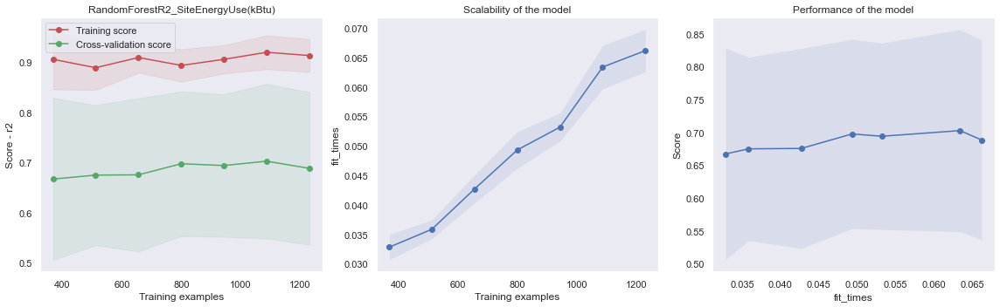

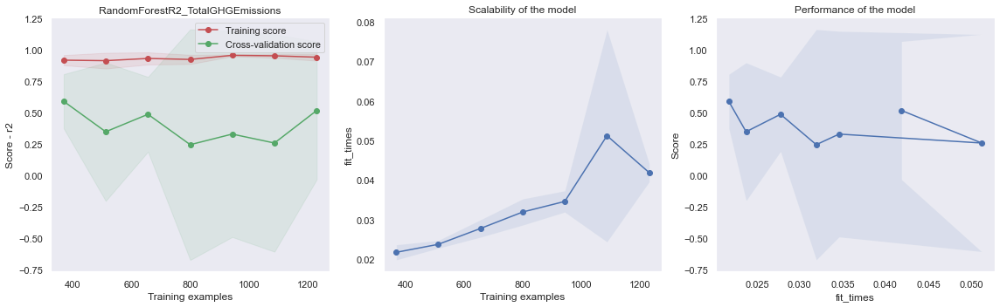

In [233]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [234]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [235]:
output_test_evaluation(model_name)

Model: RandomForestR2
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.77 pour le test du modèle (cv ou gridsearch)
 0.67 pour l'évaluation avec le test set
eval score / test score : 0.87

Le metric neg_mean_absolute_error donne :
-3157757.61 pour le test du modèle (cv ou gridsearch)
-3115531.53 pour l'évaluation avec le test set
eval score / test score : 0.99

Le metric neg_root_mean_squared_error donne :
-8881551.39 pour le test du modèle (cv ou gridsearch)
-6849855.31 pour l'évaluation avec le test set
eval score / test score : 0.77

Le metric neg_mean_absolute_percentage_error donne :
-0.93 pour le test du modèle (cv ou gridsearch)
-0.64 pour l'évaluation avec le test set
eval score / test score : 0.69

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.81 pou

#### Les Résidus

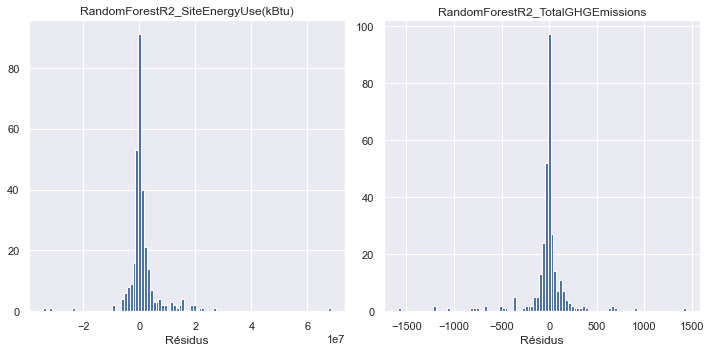

In [236]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

#### Importances des Features

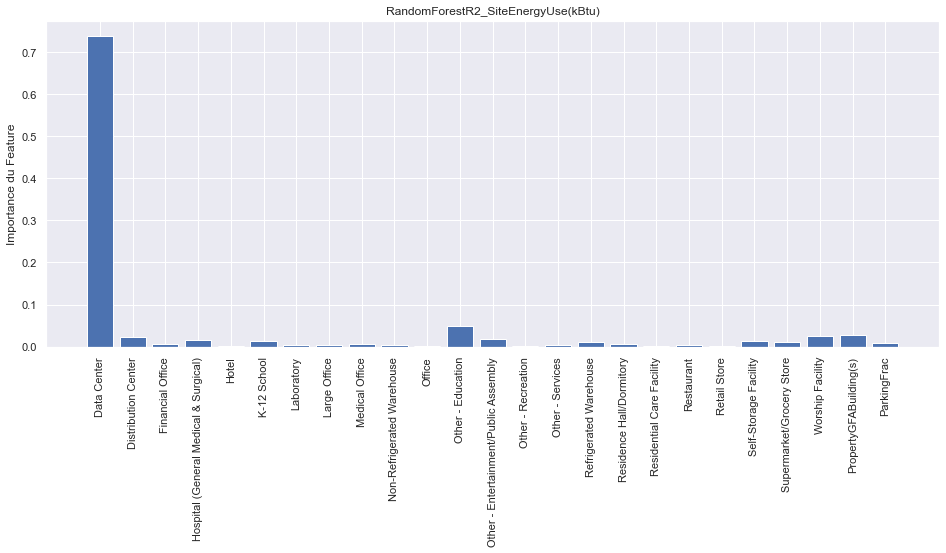

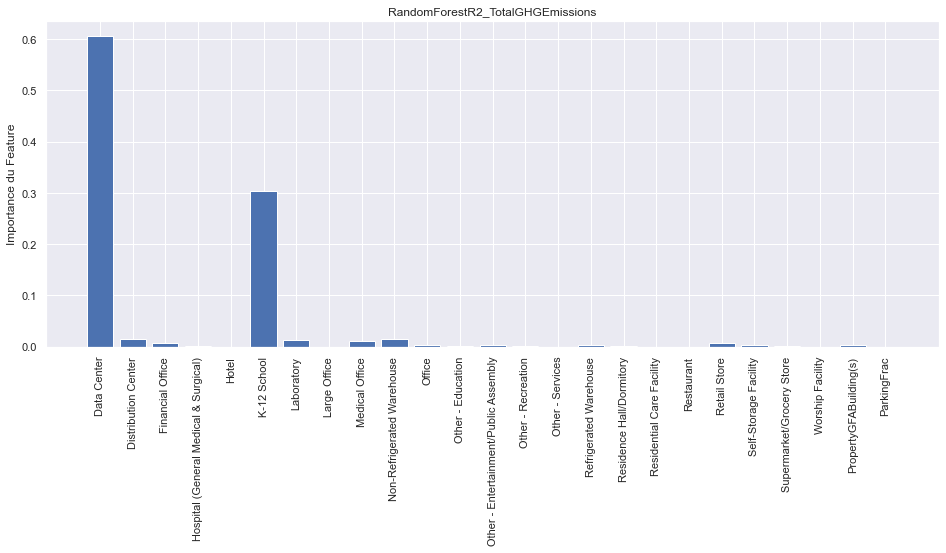

In [237]:
for pipeline, target in zip(pipelines, targets) :
    title = '_'.join([model_name, target]) 
    fitted_estimator=model_dict[title]['estimator'].fit(X_train, y_train[target])
    fig, ax = plt.subplots(figsize = (16, 6))
    plt.bar(X_train.columns.values, abs(fitted_estimator.named_steps.model.regressor_.feature_importances_))
    plt.title(title)
    plt.ylabel('Importance du Feature')
    plt.xticks(rotation = 'vertical')
    plt.show()

## 6.5 Evaluation - Version 2

In [314]:
model_list_bases = ['LinRegr', 'Ridge', 'Lasso', 'LinearSVR', 'SVR', 'GradientBoostingR', 'KNR', 'RandomForestR']
model_list = [m+'2' for m in model_list_bases]

In [315]:
targets = ['SiteEnergyUse(kBtu)', 'TotalGHGEmissions']
df_dict = output_model_evaluations(model_list, targets)

for target in targets:
    display(df_dict[target])

,train_r2,eval_r2,train_nMAE,eval_nMAE,train_nRMSE,eval_nRMSE,train_nMAPE,eval_nMAPE,train_time
LinRegr2,0.416531,0.542143,-3.177576e+06,-3.248631e+06,-1.183105e+07,-8.069042e+06,-0.793677,-0.579414,12.110281
Ridge2,0.782045,0.603424,-2.930954e+06,-3.156325e+06,-8.842933e+06,-7.509658e+06,-0.745991,-0.571733,9.802294
Lasso2,0.782648,0.626080,-2.933447e+06,-3.105815e+06,-8.797241e+06,-7.291993e+06,-0.743044,-0.569720,9.274721
LinearSVR2,0.776178,0.491452,-2.951923e+06,-3.335499e+06,-8.998875e+06,-8.503991e+06,-0.764090,-0.598685,13.971663
SVR2,0.816929,0.620775,-2.851141e+06,-3.109032e+06,-7.944651e+06,-7.343536e+06,-0.825649,-0.605304,38.995409
GradientBoostingR2,0.753053,0.743795,-3.045638e+06,-2.817491e+06,-8.967445e+06,-6.036019e+06,-0.819264,-0.577151,91.199350
KNR2,0.717878,0.649769,-3.521804e+06,-3.236139e+06,-9.896950e+06,-7.057234e+06,-0.932666,-0.719921,8.001709
RandomForestR2,0.770072,0.670050,-3.157758e+06,-3.115532e+06,-8.881551e+06,-6.849855e+06,-0.927685,-0.641332,57.913494


,train_r2,eval_r2,train_nMAE,eval_nMAE,train_nRMSE,eval_nRMSE,train_nMAPE,eval_nMAPE,train_time
LinRegr2,0.412420,-1.198419,-164.509612,-191.266819,-441.632604,-422.395943,-8.958128e+14,-6.923769,10.037994
Ridge2,0.455141,-0.613946,-168.193684,-183.368153,-435.433708,-361.916983,-8.623978e+14,-7.050601,9.808588
Lasso2,0.428583,-0.680811,-166.098757,-185.765099,-443.224962,-369.337944,-6.199358e+14,-6.350712,8.346128
LinearSVR2,0.414213,0.116674,-140.452453,-138.628867,-459.869563,-267.747305,-8.305125e+14,-4.724815,63.390970
SVR2,0.734837,0.481079,-97.254752,-96.203587,-300.997117,-205.217816,-5.493833e+14,-2.122801,7486.652756
GradientBoostingR2,0.793497,0.343800,-92.814707,-106.712357,-242.071277,-230.771793,-4.305120e+14,-1.961638,89.680767
KNR2,0.743023,0.540614,-104.046466,-98.091080,-271.021209,-193.087051,-6.311695e+14,-1.890948,7.904291
RandomForestR2,0.807990,0.344998,-94.301175,-107.218435,-249.644388,-230.561029,-6.008672e+14,-1.992915,32.400322


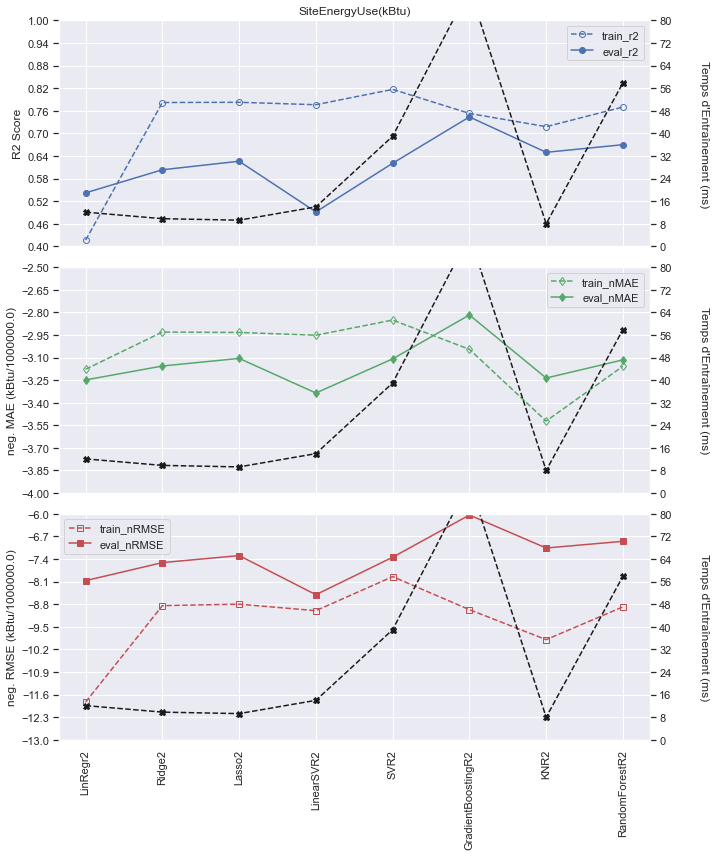

In [316]:
target = 'SiteEnergyUse(kBtu)'
data = df_dict[target]
scaling = 1e6
ylims = ((0.4, 1), (-4, -2.5), (-13, -6), (0, 80), (0, 80), (0, 80))
plot_model_evaluations(df_dict[target], title = target, scaling = scaling, ylims = ylims)

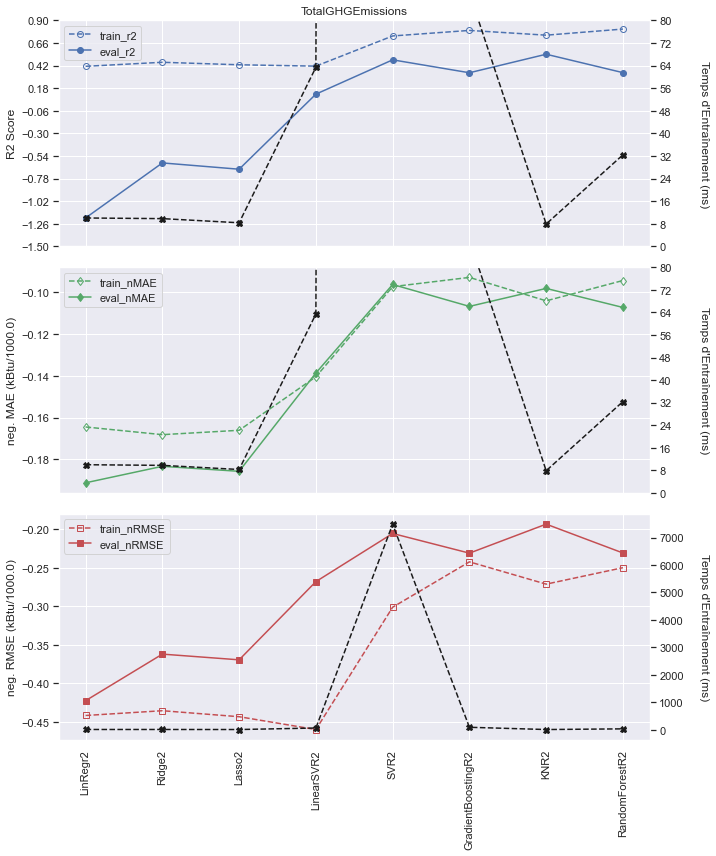

In [317]:
target = 'TotalGHGEmissions'
data = df_dict[target]
scaling = 1e3
ylims = ((-1.5,0.9), (None, None), (None, None), (0, 80), (0, 80), (None, None))
plot_model_evaluations(df_dict[target], title = target, scaling = scaling, ylims = ylims)

# 7. Modèles - Version 3

<a id="Section7.1"></a>

## 7.1 Les Features

In [244]:
propertyusetypes_groups = {'Office' : ['Office'],
                           'Parking' : ['Parking'],
                           'Non-Refrigerated Warehouse' : ['Non-Refrigerated Warehouse'],
                           'Retail Store' : ['Retail Store', 'Enclosed Mall', 'Other - Mall', 'Strip Mall',
                                            'Automobile Dealership', 'Wholesale Club/Supercenter'],
                           'Large Office' : ['Large Office'],
                           'Hotel' : ['Hotel'],
                           'Worship Facility' : ['Worship Facility'],
                           'Restaurant' : ['Restaurant', 'Fast Food Restaurant', 'Food Sales',
                                           'Other - Restaurant/Bar', 'Bar/Nightclub'],
                           'K-12 School' : ['K-12 School', 'Pre-school/Daycare'],
                           'Distribution Center' : ['Distribution Center'],
                           'Medical Office' : ['Medical Office', 'Outpatient Rehabilitation/Physical Therapy'],
                           'Supermarket/Grocery Store' : ['Supermarket/Grocery Store',
                                                          'Convenience Store without Gas Station'],
                           'Other - Recreation' : ['Other - Recreation', 'Fitness Center/Health Club/Gym', 'Museum'],
                           'Self-Storage Facility' : ['Self-Storage Facility'],
                           'Other - Entertainment/Public Assembly' : ['Other - Entertainment/Public Assembly',
                                                                      'Movie Theater', 'Performing Arts', 'Library'],
                           'Data Center' : ['Data Center'],
                           'Residence Hall/Dormitory' : ['Residence Hall/Dormitory', 'Other - Lodging/Residential',
                                                         'Multifamily Housing'],
                           'Laboratory' : ['Laboratory', 'Other - Technology/Science'],
                           'Other - Education' : ['Other - Education', 'Vocational School', 'Adult Education',
                                                  'College/University'],
                           'Residential Care Facility' : ['Residential Care Facility', 'Senior Care Community'],
                           'Other - Services' : ['Other - Services', 'Personal Services (Health/Beauty, Dry Cleaning, etc)',
                                                 'Repair Services (Vehicle, Shoe, Locksmith, etc)', 'Food Service'],
                           'Social/Meeting Hall' : ['Social/Meeting Hall', 'Convention Center'],
                           'Financial Office' : ['Financial Office', 'Bank Branch'],
                           'Refrigerated Warehouse' : ['Refrigerated Warehouse'],
                           'Other - Public Services': ['Other - Public Services', 'Fire Station', 'Police Station',
                                                       'Courthouse'],
                           'Hospital (General Medical & Surgical)' : ['Hospital (General Medical & Surgical)',
                                                                      'Other/Specialty Hospital',
                                                                      'Urgent Care/Clinic/Other Outpatient'],
                           'Other' : ['Other', 'Other - Utility', 'Prison/Incarceration', 'Manufacturing/Industrial Plant']}

propertyusetypes_dict = {}
for k, l in propertyusetypes_groups.items():
    for i in l :
        propertyusetypes_dict[i] = k

In [245]:
var = ['LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType']
suffix = "Gr1"
for v in var :
    dataset[v + suffix] = [propertyusetypes_dict[i] for i in dataset[v]]

In [246]:
var = ['LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType']
area = 'GFA'

dataset['BuildingPropertyUseTypeGFA'] = pd.DataFrame([np.where(dataset[v] != 'Parking', 
                                                     dataset[v+area], 0) for v in var ]).sum()
for v in var :
    dataset[v + 'Frac'] = dataset[v+area].divide(dataset['BuildingPropertyUseTypeGFA'])

In [247]:
suffix = "Gr1"
X_frachot = frachot_encode_feature(dataset, 'LargestPropertyUseType'+suffix, 'LargestPropertyUseTypeFrac').add(
            frachot_encode_feature(dataset, 'SecondLargestPropertyUseType'+suffix, 'SecondLargestPropertyUseTypeFrac'), 
                                   fill_value = 0).add(
            frachot_encode_feature(dataset, 'ThirdLargestPropertyUseType'+suffix, 'ThirdLargestPropertyUseTypeFrac'), fill_value = 0)

In [248]:
X_frachot = X_frachot.drop(columns=['Other','Parking', 'Other - Public Services'])

In [249]:
logscale_features = ['PropertyGFABuilding(s)', 'GFAperFloor']
log1pscale_features = ['ParkingFrac']
standardscale_features = ['BuildingAge', 'CenterDistance']
other_features = ['UseofSteam', 'UseofNaturalGas', 'PublicBuilding', 'HasSwimmingPool', 'HasDataCenter']
#X_energystar = dataset['ENERGYSTARScore'].fillna(0)
X = pd.concat([X_frachot, dataset[logscale_features + log1pscale_features + standardscale_features + other_features]], axis = 1)

<a id="Section7.2"></a>

## 7.2 Train/Test Dévision

In [250]:
y = dataset[targets]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, random_state = seed)

<a id="Section7.3"></a>

## 7.3 Préprocesseurs

In [252]:
preprocessor_X = create_preprocessor_X(logscale_features = logscale_features, log1pscale_features = log1pscale_features,
                                       standardscale_features=standardscale_features)
preprocessors_y = [create_preprocessor_y('log'), create_preprocessor_y('logp')]

<a id="Section7.4"></a>

## 7.4 Les Modèles

### 7.4.1 LinRegr3

In [253]:
model_name = 'LinRegr3'

In [254]:
model = LinearRegression()
param_grid = {'model__regressor__fit_intercept': [True, False],
              'model__regressor__normalize': [True, False]}


pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [255]:
output_evaluation(model_name)

Model: LinRegr3
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__fit_intercept': False, 'model__regressor__normalize': True}

Le metric r2 donne :
 0.77 +/-  0.03 pour le train sets
 0.67 +/-  0.12 pour le test sets
test score / train score : 1.14

Le metric neg_mean_absolute_error donne :
-2968084.36 +/-  104564.42 pour le train sets
-3230729.62 +/-  508560.64 pour le test sets
test score / train score : 0.92

Le metric neg_root_mean_squared_error donne :
-9554575.21 +/-  736687.96 pour le train sets
-10799700.76 +/-  3326599.91 pour le test sets
test score / train score : 0.88

Le metric neg_mean_absolute_percentage_error donne :
-0.66 +/-  0.07 pour le train sets
-0.70 +/-  0.32 pour le test sets
test score / train score : 0.94

Le temps d'entrainement est  14.61 +/- 2.30 ms.
__________________________________________________

Variable Target:

#### Courbe d'Apprentissage

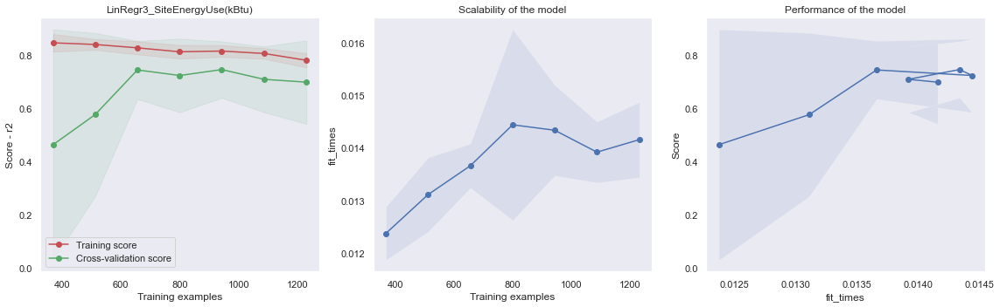

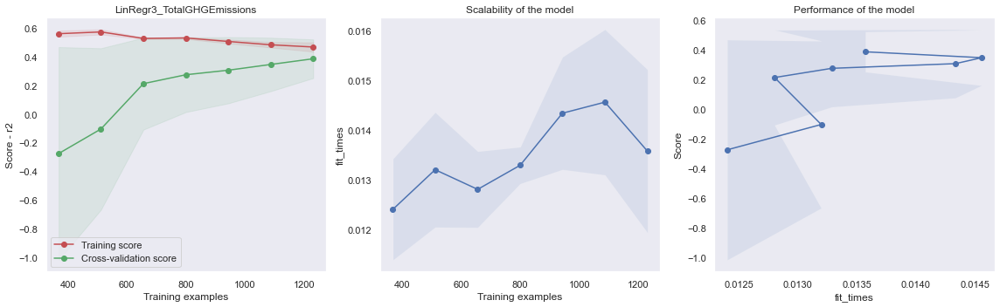

In [256]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [257]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [258]:
output_test_evaluation(model_name)

Model: LinRegr3
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.67 pour le test du modèle (cv ou gridsearch)
 0.31 pour l'évaluation avec le test set
eval score / test score : 0.46

Le metric neg_mean_absolute_error donne :
-3230729.62 pour le test du modèle (cv ou gridsearch)
-3371426.88 pour l'évaluation avec le test set
eval score / test score : 1.04

Le metric neg_root_mean_squared_error donne :
-10799700.76 pour le test du modèle (cv ou gridsearch)
-9890193.52 pour l'évaluation avec le test set
eval score / test score : 0.92

Le metric neg_mean_absolute_percentage_error donne :
-0.70 pour le test du modèle (cv ou gridsearch)
-0.54 pour l'évaluation avec le test set
eval score / test score : 0.78

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.42 pour le 

#### Les Résidus

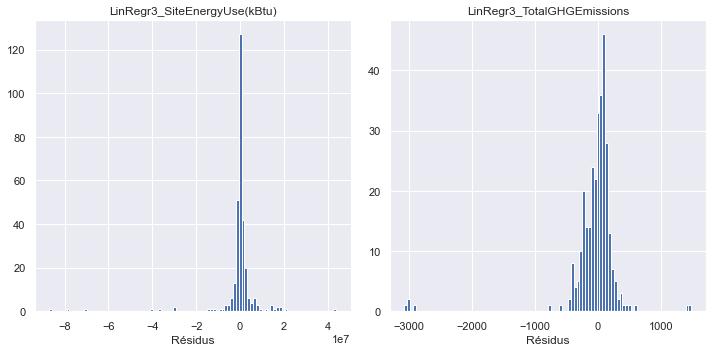

In [259]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 7.4.2 Ridge3

In [260]:
model_name = 'Ridge3'
model = Ridge()
param_grid = {'model__regressor__fit_intercept': [True, False],
              'model__regressor__alpha': np.logspace(-5,2,20),
                                }
pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [261]:
output_evaluation(model_name)

Model: Ridge3
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__alpha': 3.359818286283781, 'model__regressor__fit_intercept': False}

Le metric r2 donne :
 0.74 +/-  0.05 pour le train sets
 0.72 +/-  0.13 pour le test sets
test score / train score : 1.02

Le metric neg_mean_absolute_error donne :
-3087191.42 +/-  161547.16 pour le train sets
-3181796.22 +/-  660135.54 pour le test sets
test score / train score : 0.97

Le metric neg_root_mean_squared_error donne :
-10178037.42 +/-  1381823.80 pour le train sets
-10011070.82 +/-  4052934.21 pour le test sets
test score / train score : 1.02

Le metric neg_mean_absolute_percentage_error donne :
-0.67 +/-  0.07 pour le train sets
-0.71 +/-  0.32 pour le test sets
test score / train score : 0.95

Le temps d'entrainement est  10.68 +/- 0.53 ms.
__________________________________________________

Variabl

#### Courbe d'Apprentissage

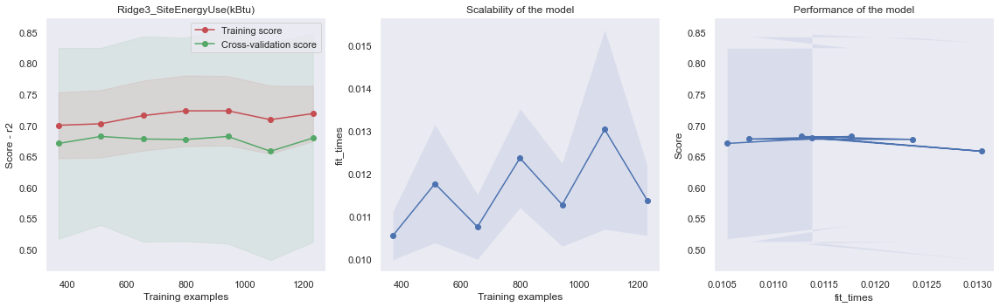

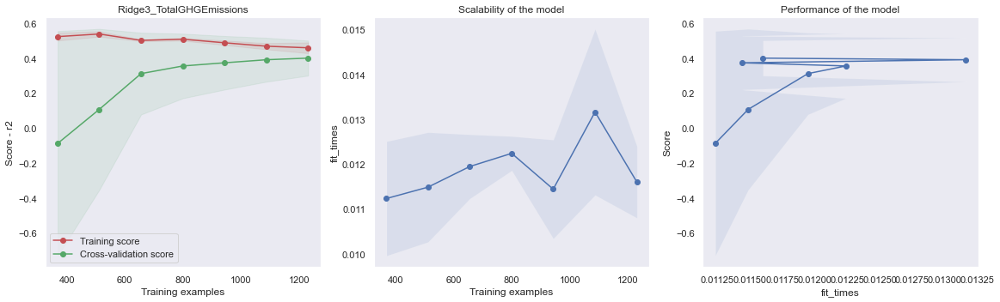

In [262]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [263]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [264]:
output_test_evaluation(model_name)

Model: Ridge3
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.72 pour le test du modèle (cv ou gridsearch)
 0.25 pour l'évaluation avec le test set
eval score / test score : 0.35

Le metric neg_mean_absolute_error donne :
-3181796.22 pour le test du modèle (cv ou gridsearch)
-3325609.36 pour l'évaluation avec le test set
eval score / test score : 1.05

Le metric neg_root_mean_squared_error donne :
-10011070.82 pour le test du modèle (cv ou gridsearch)
-10327365.31 pour l'évaluation avec le test set
eval score / test score : 1.03

Le metric neg_mean_absolute_percentage_error donne :
-0.71 pour le test du modèle (cv ou gridsearch)
-0.55 pour l'évaluation avec le test set
eval score / test score : 0.78

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.47 pour le t

#### Les Résidus

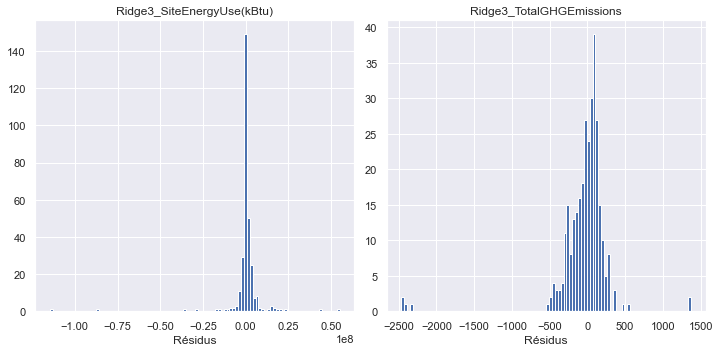

In [265]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 7.4.3 Lasso3

In [266]:
model_name = 'Lasso3'

In [267]:
model = Lasso()
param_grid = {'model__regressor__fit_intercept': [True, False],
              'model__regressor__alpha': np.logspace(-6,1,20),
                                }
pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [268]:
output_evaluation(model_name)

Model: Lasso3
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__alpha': 0.0008858667904100823, 'model__regressor__fit_intercept': False}

Le metric r2 donne :
 0.76 +/-  0.04 pour le train sets
 0.72 +/-  0.10 pour le test sets
test score / train score : 1.05

Le metric neg_mean_absolute_error donne :
-2981734.18 +/-  149916.08 pour le train sets
-3126923.64 +/-  589737.29 pour le test sets
test score / train score : 0.95

Le metric neg_root_mean_squared_error donne :
-9761590.69 +/-  1165649.26 pour le train sets
-10069389.35 +/-  3804319.82 pour le test sets
test score / train score : 0.97

Le metric neg_mean_absolute_percentage_error donne :
-0.67 +/-  0.07 pour le train sets
-0.71 +/-  0.32 pour le test sets
test score / train score : 0.95

Le temps d'entrainement est  13.00 +/- 1.10 ms.
__________________________________________________

Vari

#### Courbe d'Apprentissage

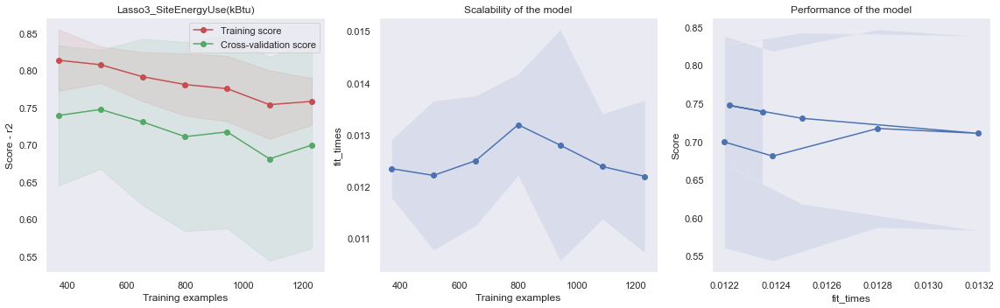

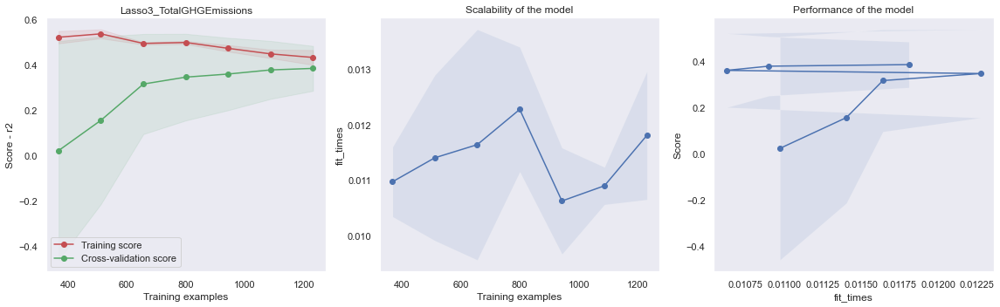

In [269]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [270]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [271]:
output_test_evaluation(model_name)

Model: Lasso3
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.72 pour le test du modèle (cv ou gridsearch)
 0.37 pour l'évaluation avec le test set
eval score / test score : 0.51

Le metric neg_mean_absolute_error donne :
-3126923.64 pour le test du modèle (cv ou gridsearch)
-3310725.04 pour l'évaluation avec le test set
eval score / test score : 1.06

Le metric neg_root_mean_squared_error donne :
-10069389.35 pour le test du modèle (cv ou gridsearch)
-9461457.77 pour l'évaluation avec le test set
eval score / test score : 0.94

Le metric neg_mean_absolute_percentage_error donne :
-0.71 pour le test du modèle (cv ou gridsearch)
-0.55 pour l'évaluation avec le test set
eval score / test score : 0.78

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.44 pour le te

#### Les Résidus

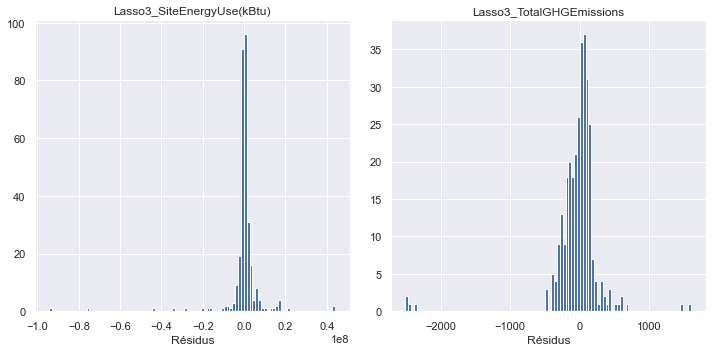

In [272]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

#### Importances des Features

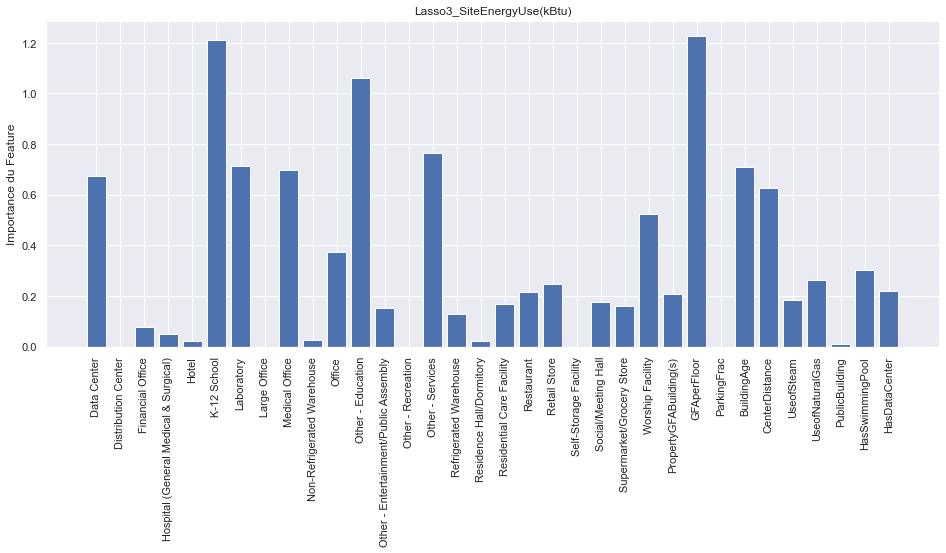

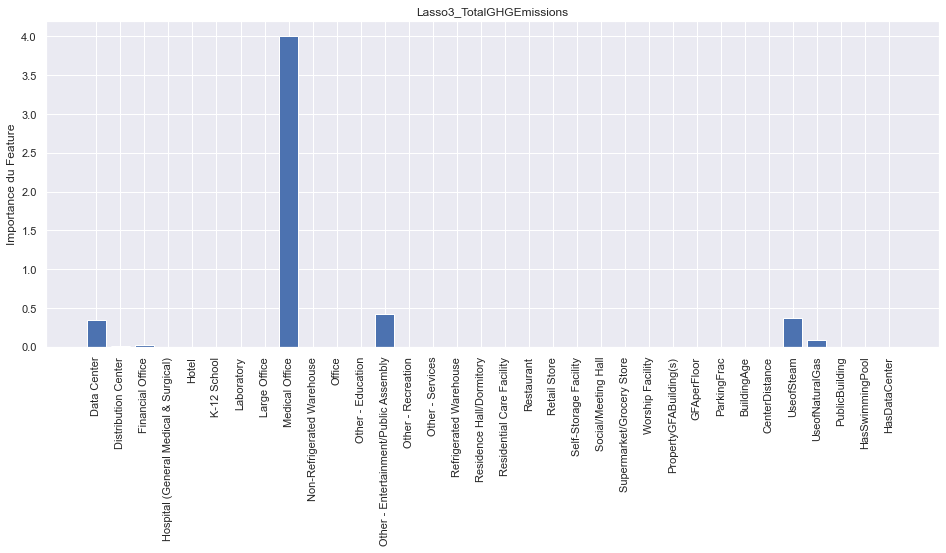

In [273]:
for pipeline, target in zip(pipelines, targets) :
    title = '_'.join([model_name, target]) 
    fitted_estimator=model_dict[title]['estimator'].fit(X_train, y_train[target])
    fig, ax = plt.subplots(figsize = (16, 6))
    plt.bar(X_train.columns.values, abs(fitted_estimator.named_steps.model.regressor_.coef_))
    plt.title(title)
    plt.ylabel('Importance du Feature')
    plt.xticks(rotation = 'vertical')
    plt.show()

### 7.4.4 LinearSVR3

In [274]:
model_name = 'LinearSVR3'

In [275]:
model = LinearSVR(max_iter=100000, fit_intercept = False)
param_grid = {'model__regressor__C': np.logspace(-2,2,10),
              'model__regressor__epsilon' : np.logspace(-5,0,10)}

pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

#### Evaluation de l'Entraînement

In [276]:
output_evaluation(model_name)

Model: LinearSVR3
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__C': 1.6681005372000592, 'model__regressor__epsilon': 1e-05}

Le metric r2 donne :
 0.78 +/-  0.03 pour le train sets
 0.75 +/-  0.08 pour le test sets
test score / train score : 1.03

Le metric neg_mean_absolute_error donne :
-2867498.01 +/-  125941.56 pour le train sets
-3049161.44 +/-  559714.52 pour le test sets
test score / train score : 0.94

Le metric neg_root_mean_squared_error donne :
-9348362.73 +/-  865701.96 pour le train sets
-9453475.39 +/-  3265461.62 pour le test sets
test score / train score : 0.99

Le metric neg_mean_absolute_percentage_error donne :
-0.68 +/-  0.07 pour le train sets
-0.72 +/-  0.33 pour le test sets
test score / train score : 0.95

Le temps d'entrainement est  22.44 +/- 0.96 ms.
__________________________________________________

Variable Target

#### Courbe d'Apprentissage

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "
c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear fai

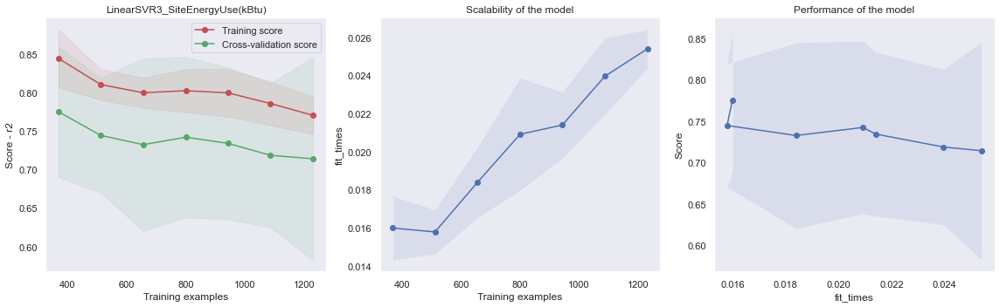

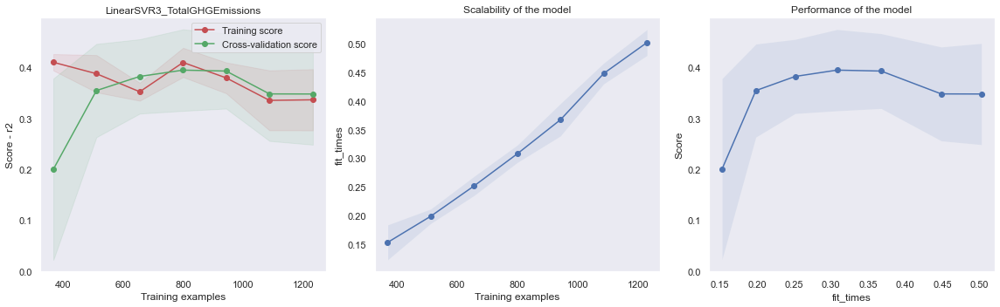

In [277]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [278]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


In [279]:
output_test_evaluation(model_name)

Model: LinearSVR3
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.75 pour le test du modèle (cv ou gridsearch)
 0.37 pour l'évaluation avec le test set
eval score / test score : 0.49

Le metric neg_mean_absolute_error donne :
-3049161.44 pour le test du modèle (cv ou gridsearch)
-3320854.88 pour l'évaluation avec le test set
eval score / test score : 1.09

Le metric neg_root_mean_squared_error donne :
-9453475.39 pour le test du modèle (cv ou gridsearch)
-9472482.28 pour l'évaluation avec le test set
eval score / test score : 1.00

Le metric neg_mean_absolute_percentage_error donne :
-0.72 pour le test du modèle (cv ou gridsearch)
-0.56 pour l'évaluation avec le test set
eval score / test score : 0.78

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.43 pour le

#### Les Résidus

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


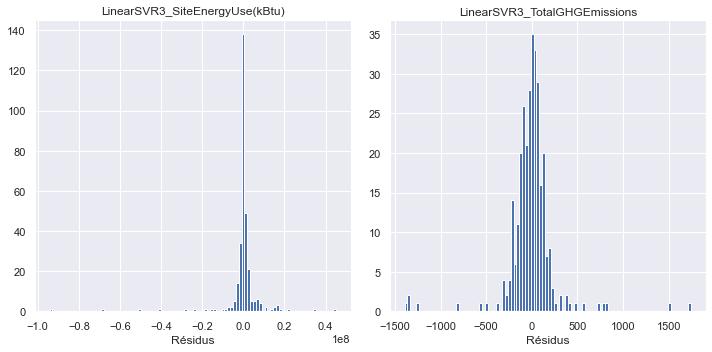

In [280]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

#### Importances des Features

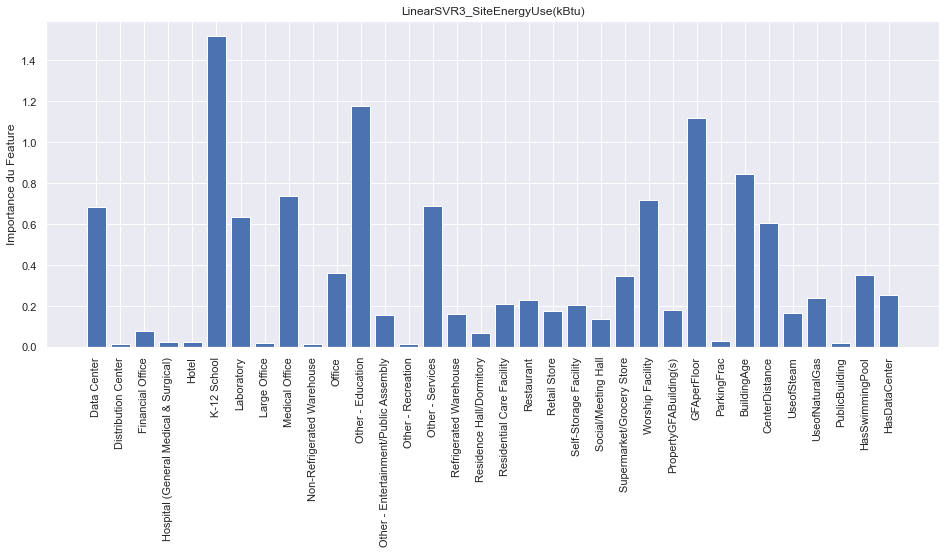

c:\users\bookj\environments\jupenv\lib\site-packages\sklearn\svm\_base.py:985: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn("Liblinear failed to converge, increase "


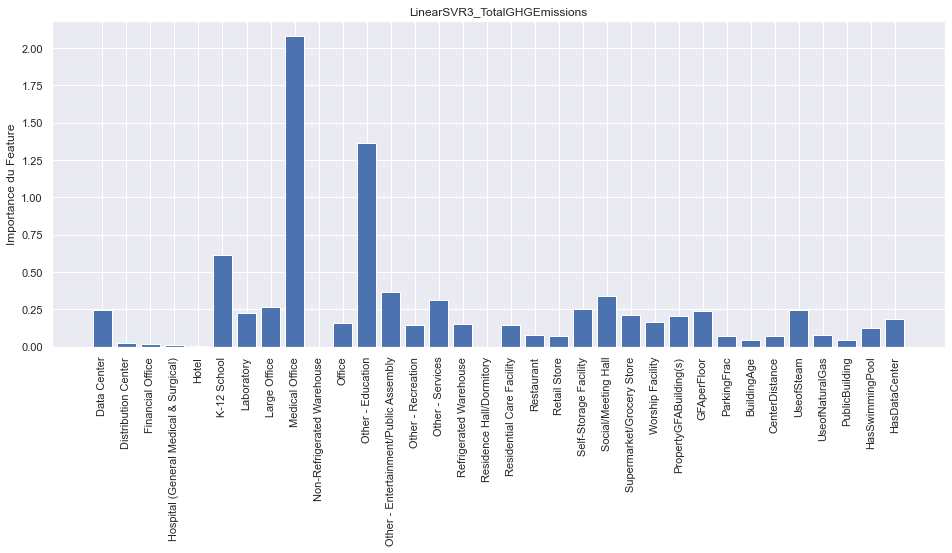

In [281]:
for pipeline, target in zip(pipelines, targets) :
    title = '_'.join([model_name, target]) 
    fitted_estimator=model_dict[title]['estimator'].fit(X_train, y_train[target])
    fig, ax = plt.subplots(figsize = (16, 6))
    plt.bar(X_train.columns.values, abs(fitted_estimator.named_steps.model.regressor_.coef_))
    plt.title(title)
    plt.ylabel('Importance du Feature')
    plt.xticks(rotation = 'vertical')
    plt.show()

### 7.4.5 SVR3

In [282]:
model_name = 'SVR3'

In [283]:
model = SVR()
param_grid = {
              'model__regressor__C': np.logspace(2,5,5),
              'model__regressor__epsilon' : np.logspace(-5,1,5),
              'model__regressor__gamma' : [0.001]#np.logspace(-5,-1,5),
                  }
pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [284]:
output_evaluation(model_name)

Model: SVR3
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__C': 562.341325190349, 'model__regressor__epsilon': 0.31622776601683794, 'model__regressor__gamma': 0.001}

Le metric r2 donne :
 0.80 +/-  0.03 pour le train sets
 0.79 +/-  0.11 pour le test sets
test score / train score : 1.01

Le metric neg_mean_absolute_error donne :
-2803781.27 +/-  122122.42 pour le train sets
-2956840.02 +/-  499193.67 pour le test sets
test score / train score : 0.95

Le metric neg_root_mean_squared_error donne :
-8952798.75 +/-  785133.15 pour le train sets
-8254992.62 +/-  3300021.59 pour le test sets
test score / train score : 1.08

Le metric neg_mean_absolute_percentage_error donne :
-0.61 +/-  0.05 pour le train sets
-0.68 +/-  0.29 pour le test sets
test score / train score : 0.90

Le temps d'entrainement est  57.19 +/- 3.19 ms.
___________________________

#### Courbe d'Apprentissage

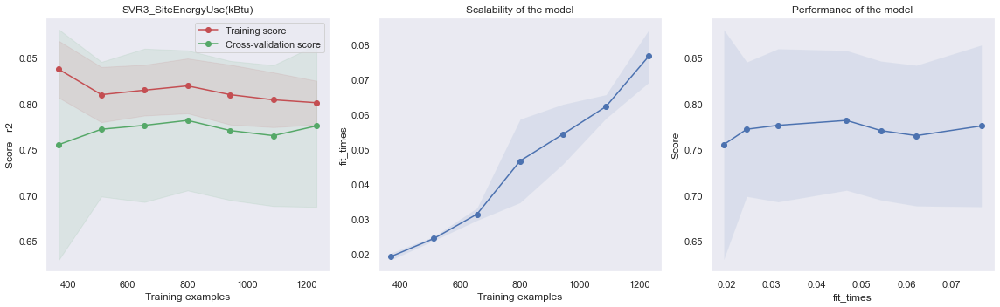

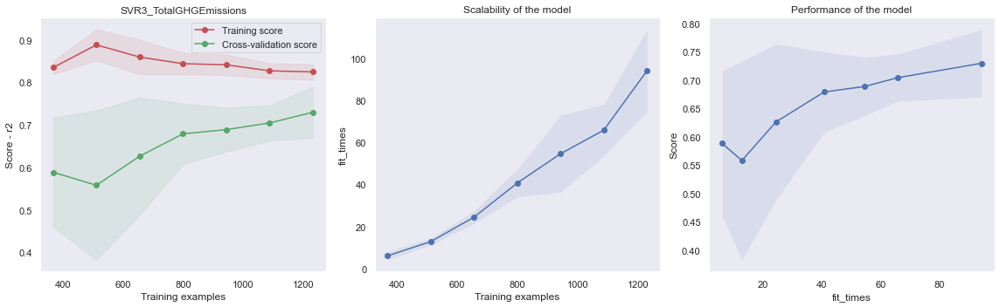

In [285]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes1, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [286]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [287]:
output_test_evaluation(model_name)

Model: SVR3
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.79 pour le test du modèle (cv ou gridsearch)
 0.60 pour l'évaluation avec le test set
eval score / test score : 0.76

Le metric neg_mean_absolute_error donne :
-2956840.02 pour le test du modèle (cv ou gridsearch)
-3092924.65 pour l'évaluation avec le test set
eval score / test score : 1.05

Le metric neg_root_mean_squared_error donne :
-8254992.62 pour le test du modèle (cv ou gridsearch)
-7519167.40 pour l'évaluation avec le test set
eval score / test score : 0.91

Le metric neg_mean_absolute_percentage_error donne :
-0.68 pour le test du modèle (cv ou gridsearch)
-0.54 pour l'évaluation avec le test set
eval score / test score : 0.79

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.71 pour le test 

#### Les Résidus

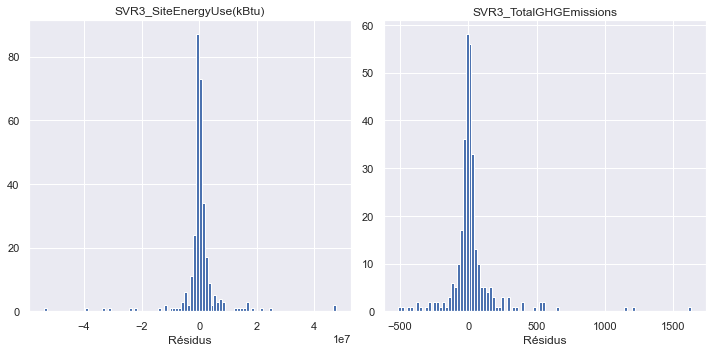

In [288]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 7.4.6 GradientBoostingR3

In [289]:
model_name = 'GradientBoostingR3'

In [290]:
model = GradientBoostingRegressor()
param_grid = {'model__regressor__learning_rate' : np.logspace(-3,0,5)}

pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [291]:
output_evaluation(model_name)

Model: GradientBoostingR3
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__learning_rate': 0.1778279410038923}

Le metric r2 donne :
 0.94 +/-  0.01 pour le train sets
 0.73 +/-  0.10 pour le test sets
test score / train score : 1.29

Le metric neg_mean_absolute_error donne :
-1812378.92 +/-  65397.80 pour le train sets
-3112578.07 +/-  477959.56 pour le test sets
test score / train score : 0.58

Le metric neg_root_mean_squared_error donne :
-4688352.52 +/-  499565.19 pour le train sets
-9799005.21 +/-  3681883.38 pour le test sets
test score / train score : 0.48

Le metric neg_mean_absolute_percentage_error donne :
-0.36 +/-  0.02 pour le train sets
-0.73 +/-  0.36 pour le test sets
test score / train score : 0.50

Le temps d'entrainement est  150.71 +/- 1.39 ms.
__________________________________________________

Variable Target: TotalGHGEmissi

#### Courbe d'Apprentissage

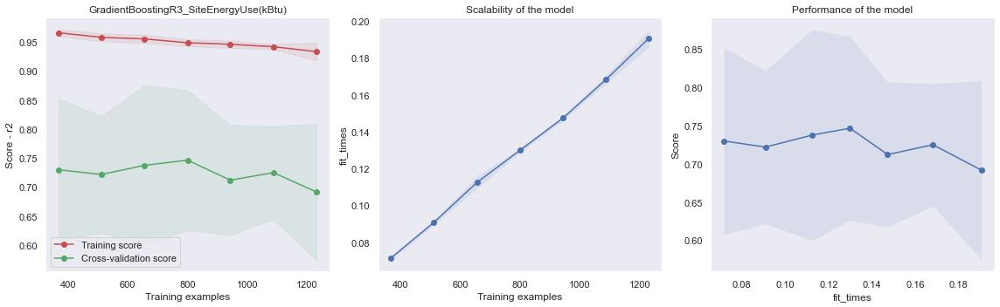

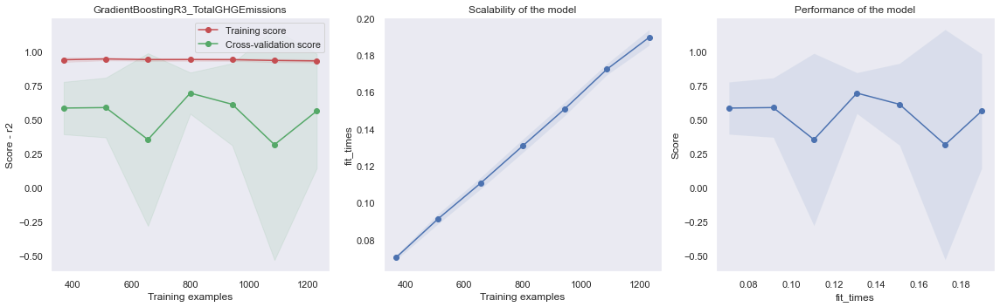

In [292]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [293]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [294]:
output_test_evaluation(model_name)

Model: GradientBoostingR3
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.73 pour le test du modèle (cv ou gridsearch)
 0.67 pour l'évaluation avec le test set
eval score / test score : 0.92

Le metric neg_mean_absolute_error donne :
-3112578.07 pour le test du modèle (cv ou gridsearch)
-2967077.55 pour l'évaluation avec le test set
eval score / test score : 0.95

Le metric neg_root_mean_squared_error donne :
-9799005.21 pour le test du modèle (cv ou gridsearch)
-6826785.45 pour l'évaluation avec le test set
eval score / test score : 0.70

Le metric neg_mean_absolute_percentage_error donne :
-0.73 pour le test du modèle (cv ou gridsearch)
-0.54 pour l'évaluation avec le test set
eval score / test score : 0.74

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.75

#### Les Résidus

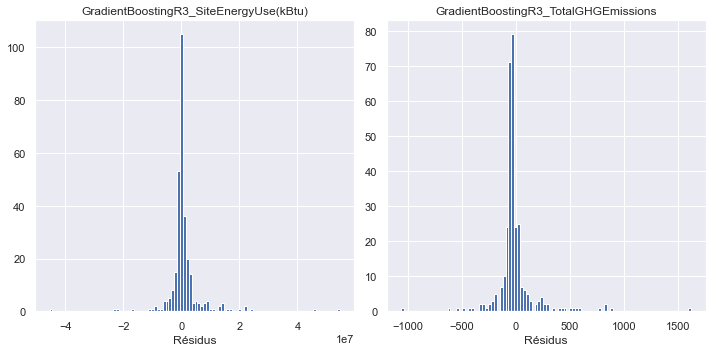

In [295]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

#### Importances des Features

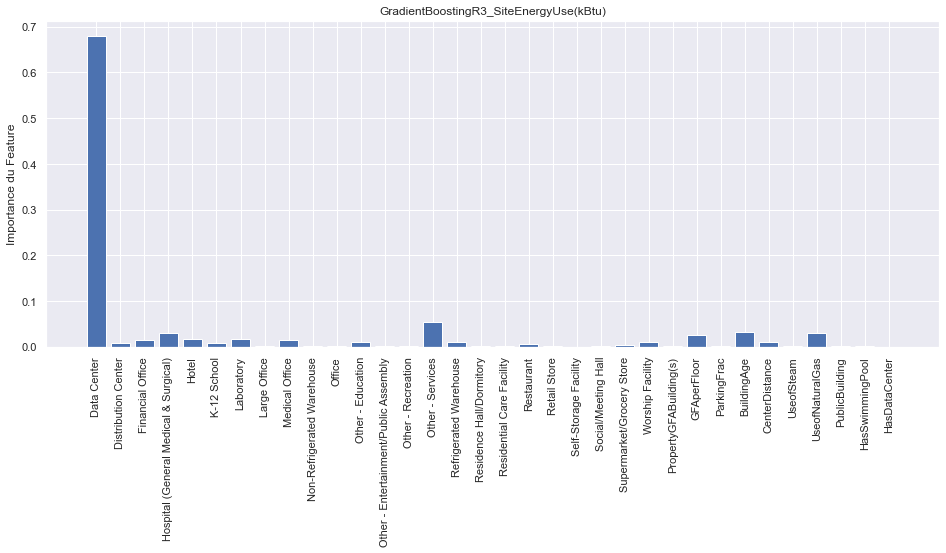

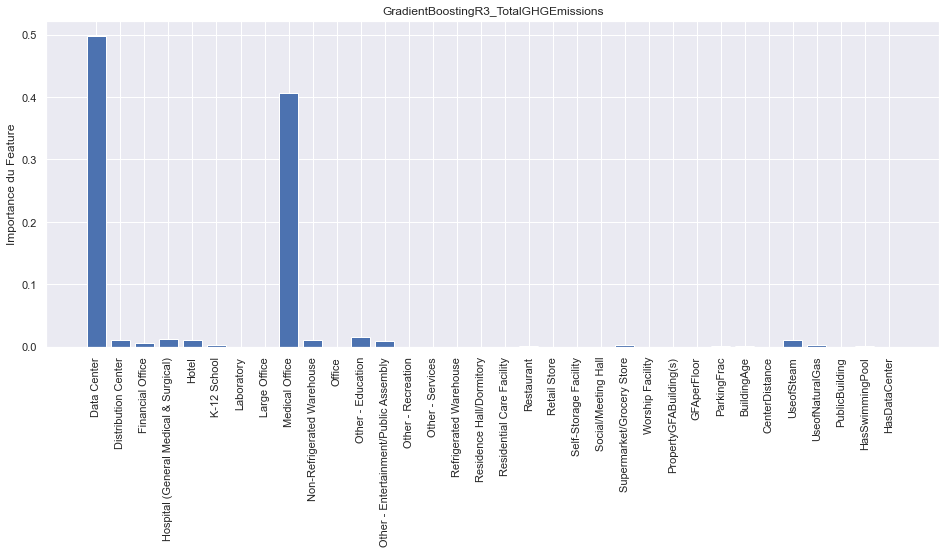

In [296]:
for pipeline, target in zip(pipelines, targets) :
    title = '_'.join([model_name, target]) 
    fitted_estimator=model_dict[title]['estimator'].fit(X_train, y_train[target])
    fig, ax = plt.subplots(figsize = (16, 6))
    plt.bar(X_train.columns.values, abs(fitted_estimator.named_steps.model.regressor_.feature_importances_))
    plt.title(title)
    plt.ylabel('Importance du Feature')
    plt.xticks(rotation = 'vertical')
    plt.show()

### 7.4.7 KNR3

In [297]:
model_name = 'KNR3'

In [298]:
model = KNeighborsRegressor()
param_grid = {
              'model__regressor__n_neighbors': range(1,11),
              'model__regressor__weights' : ['uniform', 'distance'],
              'model__regressor__leaf_size' : range(1,50,5)
               }

pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [299]:
output_evaluation(model_name)

Model: KNR3
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__leaf_size': 1, 'model__regressor__n_neighbors': 3, 'model__regressor__weights': 'distance'}

Le metric r2 donne :
 1.00 +/-  0.00 pour le train sets
 0.56 +/-  0.21 pour le test sets
test score / train score : 1.80

Le metric neg_mean_absolute_error donne :
-0.04 +/-  0.01 pour le train sets
-3906842.48 +/-  862258.36 pour le test sets
test score / train score : 0.00

Le metric neg_root_mean_squared_error donne :
-0.34 +/-  0.12 pour le train sets
-12686076.35 +/-  5338921.54 pour le test sets
test score / train score : 0.00

Le metric neg_mean_absolute_percentage_error donne :
-0.00 +/-  0.00 pour le train sets
-0.83 +/-  0.30 pour le test sets
test score / train score : 0.00

Le temps d'entrainement est  10.42 +/- 0.76 ms.
__________________________________________________

Variable T

#### Courbe d'Apprentissage

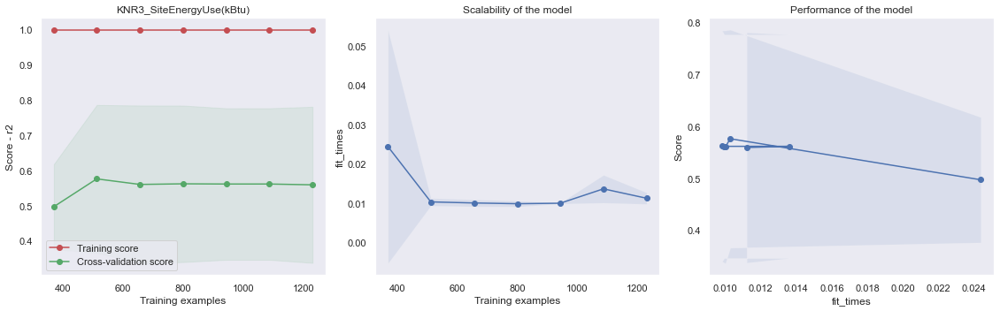

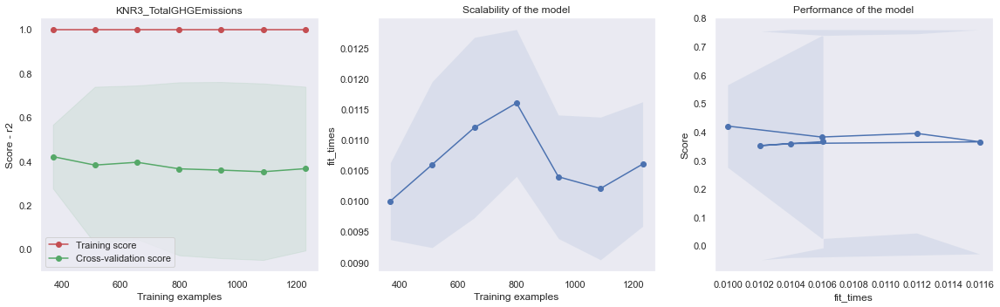

In [300]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [301]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [302]:
output_test_evaluation(model_name)

Model: KNR3
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.56 pour le test du modèle (cv ou gridsearch)
 0.43 pour l'évaluation avec le test set
eval score / test score : 0.77

Le metric neg_mean_absolute_error donne :
-3906842.48 pour le test du modèle (cv ou gridsearch)
-3499526.69 pour l'évaluation avec le test set
eval score / test score : 0.90

Le metric neg_root_mean_squared_error donne :
-12686076.35 pour le test du modèle (cv ou gridsearch)
-9018931.70 pour l'évaluation avec le test set
eval score / test score : 0.71

Le metric neg_mean_absolute_percentage_error donne :
-0.83 pour le test du modèle (cv ou gridsearch)
-0.72 pour l'évaluation avec le test set
eval score / test score : 0.87

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.56 pour le test

#### Les Résidus

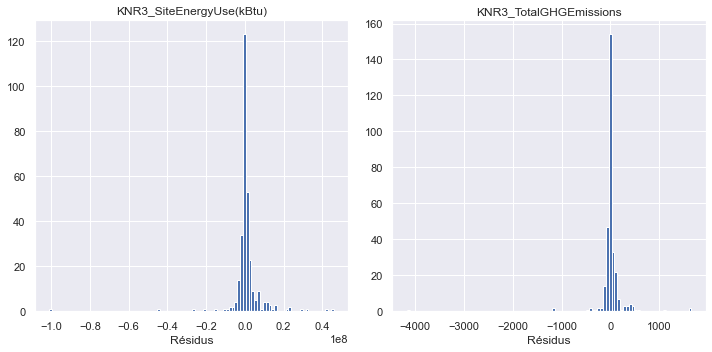

In [303]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 7.4.8 RandomForestR3

In [304]:
model_name = 'RandomForestR3'

In [305]:
model = RandomForestRegressor()
param_grid = {
              'model__regressor__n_estimators' : [7, 8, 9, 10, 15, 20, 30, 40, 50, 100],
              'model__regressor__max_depth' : [50, 60, 70, 80, 90, 100, 110]
              }
pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [306]:
output_evaluation(model_name)

Model: RandomForestR3
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__max_depth': 90, 'model__regressor__n_estimators': 9}

Le metric r2 donne :
 0.91 +/-  0.04 pour le train sets
 0.76 +/-  0.13 pour le test sets
test score / train score : 1.20

Le metric neg_mean_absolute_error donne :
-1492641.46 +/-  132260.81 pour le train sets
-3133155.81 +/-  496824.97 pour le test sets
test score / train score : 0.48

Le metric neg_root_mean_squared_error donne :
-5924969.83 +/-  1518429.24 pour le train sets
-9211410.01 +/-  4224716.61 pour le test sets
test score / train score : 0.64

Le metric neg_mean_absolute_percentage_error donne :
-0.23 +/-  0.01 pour le train sets
-0.73 +/-  0.32 pour le test sets
test score / train score : 0.31

Le temps d'entrainement est  55.00 +/- 1.89 ms.
__________________________________________________

Variable Target: 

#### Courbe d'Apprentissage

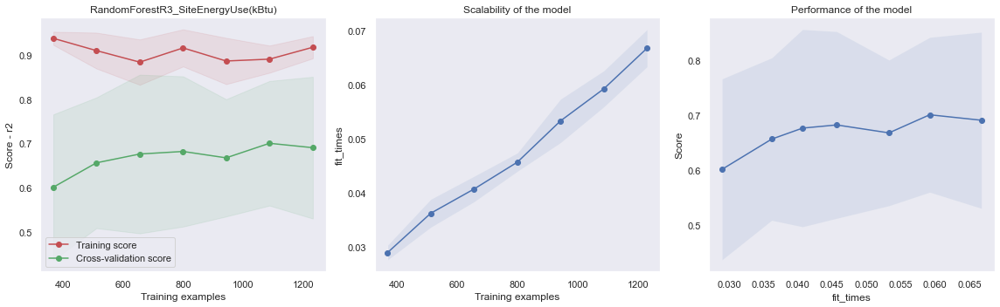

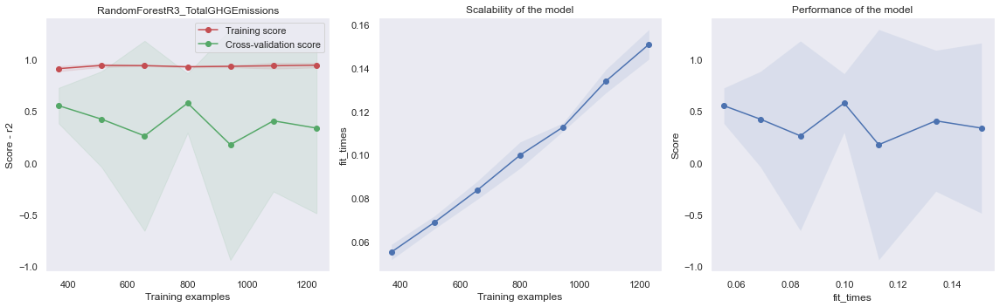

In [307]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [308]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [309]:
output_test_evaluation(model_name)

Model: RandomForestR3
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.76 pour le test du modèle (cv ou gridsearch)
 0.60 pour l'évaluation avec le test set
eval score / test score : 0.80

Le metric neg_mean_absolute_error donne :
-3133155.81 pour le test du modèle (cv ou gridsearch)
-3243080.91 pour l'évaluation avec le test set
eval score / test score : 1.04

Le metric neg_root_mean_squared_error donne :
-9211410.01 pour le test du modèle (cv ou gridsearch)
-7499983.63 pour l'évaluation avec le test set
eval score / test score : 0.81

Le metric neg_mean_absolute_percentage_error donne :
-0.73 pour le test du modèle (cv ou gridsearch)
-0.64 pour l'évaluation avec le test set
eval score / test score : 0.88

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.78 pou

#### Les Résidus

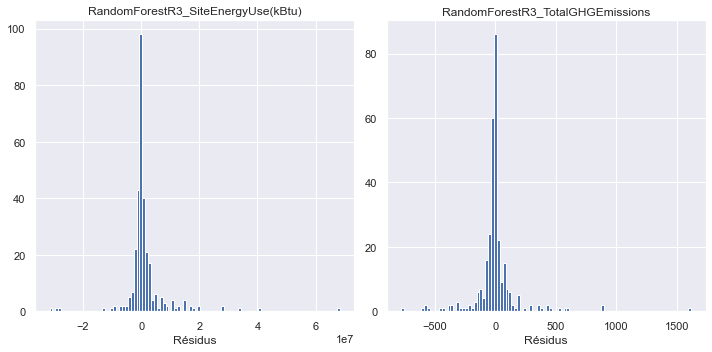

In [310]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

#### Importances des Features

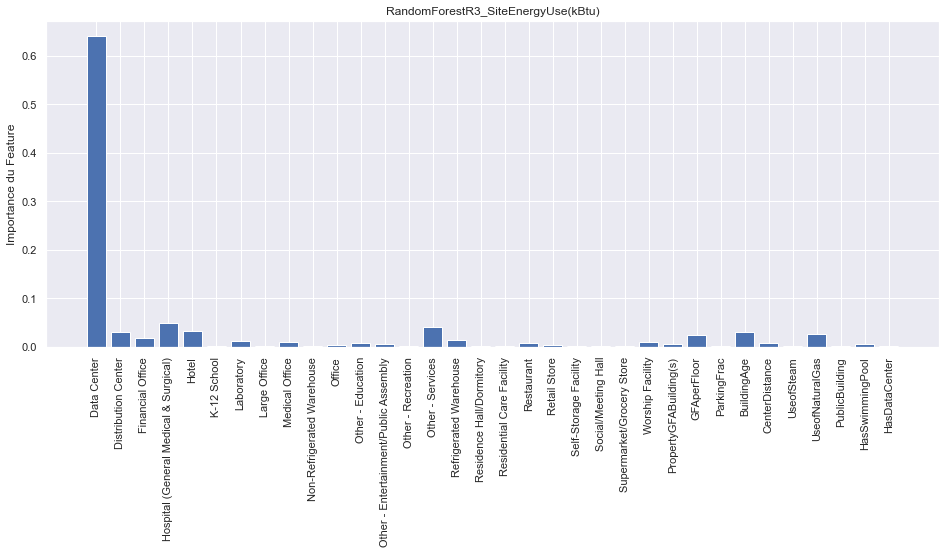

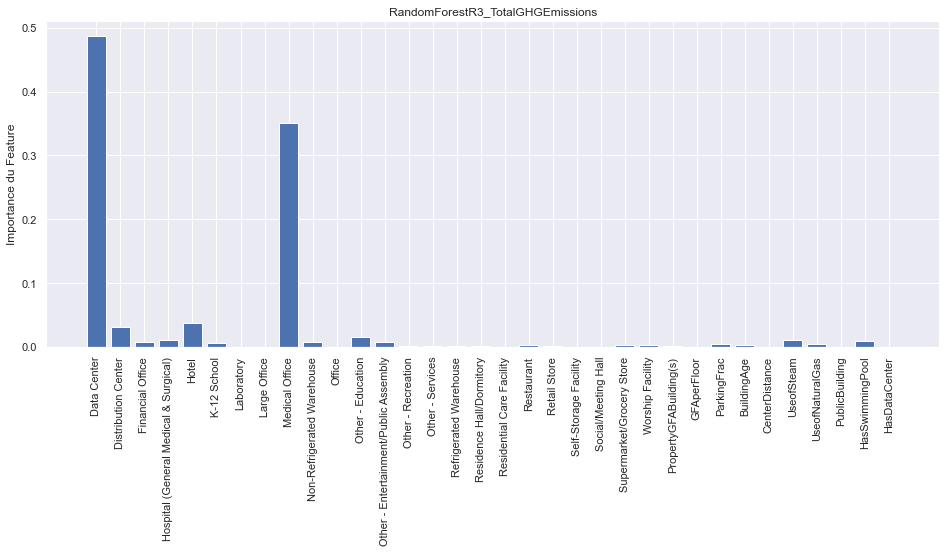

In [311]:
for pipeline, target in zip(pipelines, targets) :
    title = '_'.join([model_name, target]) 
    fitted_estimator=model_dict[title]['estimator'].fit(X_train, y_train[target])
    fig, ax = plt.subplots(figsize = (16, 6))
    plt.bar(X_train.columns.values, abs(fitted_estimator.named_steps.model.regressor_.feature_importances_))
    plt.title(title)
    plt.ylabel('Importance du Feature')
    plt.xticks(rotation = 'vertical')
    plt.show()

## 7.5 Evaluation - Version 3

In [333]:
model_list_bases = ['LinRegr', 'Ridge', 'Lasso', 'LinearSVR', 'SVR', 'GradientBoostingR', 'KNR', 'RandomForestR']
model_list = [m+'3' for m in model_list_bases]

In [334]:
targets = ['SiteEnergyUse(kBtu)', 'TotalGHGEmissions']
df_dict = output_model_evaluations(model_list, targets)

for target in targets:
    display(df_dict[target])

,train_r2,eval_r2,train_nMAE,eval_nMAE,train_nRMSE,eval_nRMSE,train_nMAPE,eval_nMAPE,train_time
LinRegr3,0.674975,0.312147,-3.230730e+06,-3.371427e+06,-1.079970e+07,-9.890194e+06,-0.702097,-0.544950,14.610434
Ridge3,0.720082,0.249993,-3.181796e+06,-3.325609e+06,-1.001107e+07,-1.032737e+07,-0.709108,-0.552671,10.683155
Lasso3,0.723332,0.370491,-3.126924e+06,-3.310725e+06,-1.006939e+07,-9.461458e+06,-0.705998,-0.549905,13.000250
LinearSVR3,0.754733,0.369023,-3.049161e+06,-3.320855e+06,-9.453475e+06,-9.472482e+06,-0.720101,-0.558198,22.444439
SVR3,0.787629,0.602419,-2.956840e+06,-3.092925e+06,-8.254993e+06,-7.519167e+06,-0.680448,-0.535314,57.191420
GradientBoostingR3,0.733544,0.672268,-3.112578e+06,-2.967078e+06,-9.799005e+06,-6.826785e+06,-0.727150,-0.540499,150.713253
KNR3,0.555933,0.428000,-3.906842e+06,-3.499527e+06,-1.268608e+07,-9.018932e+06,-0.825724,-0.720056,10.419512
RandomForestR3,0.759242,0.604445,-3.133156e+06,-3.243081e+06,-9.211410e+06,-7.499984e+06,-0.730642,-0.640259,54.996300


,train_r2,eval_r2,train_nMAE,eval_nMAE,train_nRMSE,eval_nRMSE,train_nMAPE,eval_nMAPE,train_time
LinRegr3,0.424602,-1.025141,-164.361803,-186.589275,-437.604937,-405.407871,-6.186464e+14,-7.496088,14.309359
Ridge3,0.466214,-0.469909,-167.868433,-177.716227,-431.099688,-345.389931,-5.672338e+14,-7.694254,11.350393
Lasso3,0.443148,-0.544549,-161.411798,-176.052883,-437.934777,-354.050624,-4.651472e+14,-6.330431,10.582304
LinearSVR3,0.425915,0.175524,-138.661492,-136.928171,-455.321190,-258.674385,-6.143087e+14,-5.579314,369.795704
SVR3,0.713087,0.554892,-101.039447,-88.479390,-310.568994,-190.062816,-3.110830e+14,-1.771824,56262.813282
GradientBoostingR3,0.752505,0.510763,-98.773228,-103.140540,-262.994141,-199.261791,-1.892518e+14,-2.928482,151.943636
KNR3,0.557886,-0.253820,-105.333102,-101.738332,-370.947389,-318.993723,-5.299425e+14,-1.544281,9.697771
RandomForestR3,0.781782,0.331172,-87.978417,-96.149158,-251.984538,-232.981631,-8.631869e+13,-1.351124,127.186155


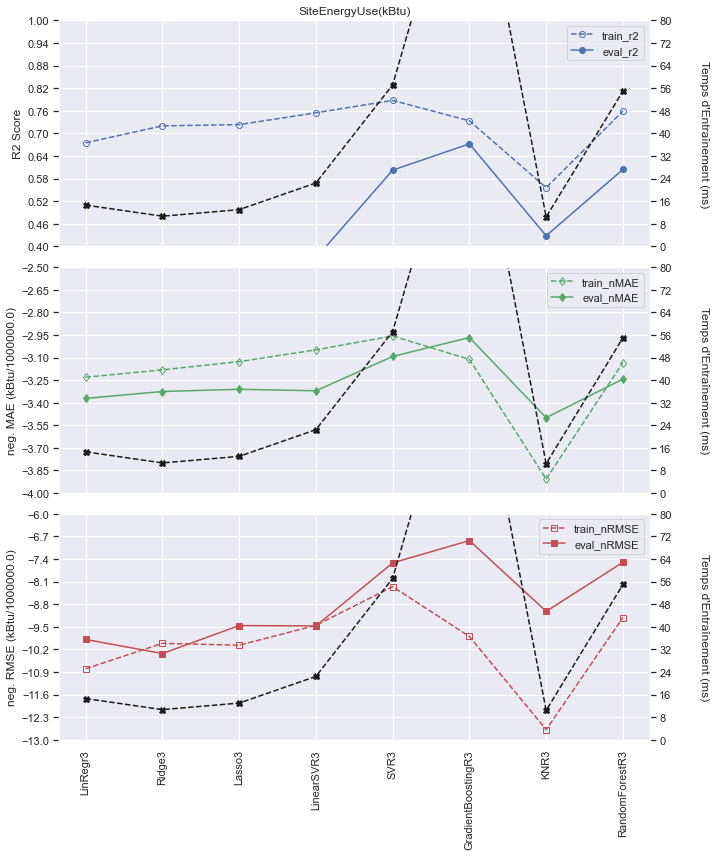

In [335]:
target = 'SiteEnergyUse(kBtu)'
data = df_dict[target]
scaling = 1e6
ylims = ((0.4, 1), (-4, -2.5), (-13, -6), (0, 80), (0, 80), (0, 80))
plot_model_evaluations(df_dict[target], title = target, scaling = scaling, ylims = ylims)

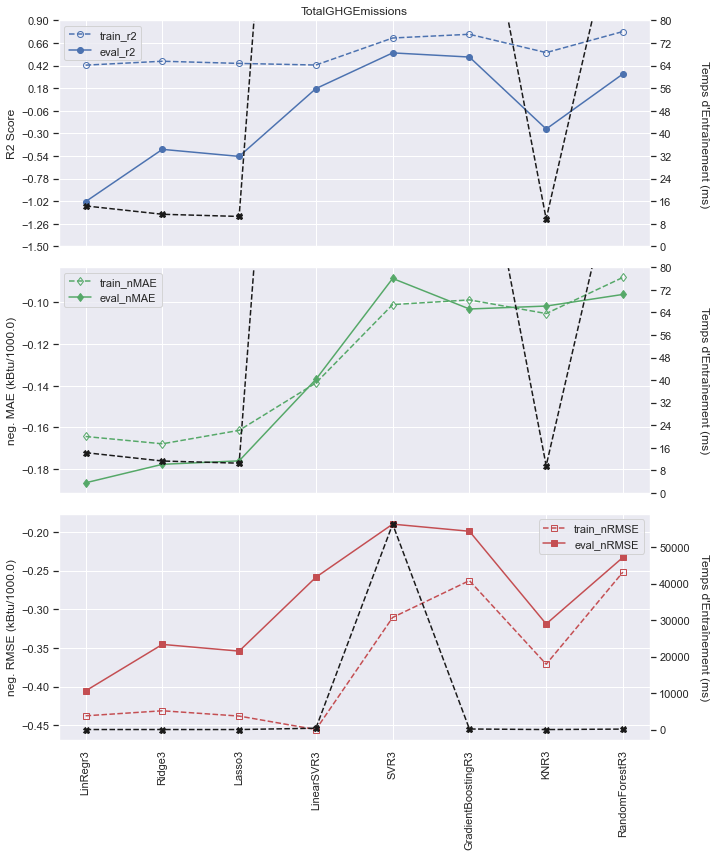

In [336]:
target = 'TotalGHGEmissions'
data = df_dict[target]
scaling = 1e3
ylims = ((-1.5,0.9), (None, None), (None, None), (0, 80), (0, 80), (None, None))
plot_model_evaluations(df_dict[target], title = target, scaling = scaling, ylims = ylims)

# 8. Modèles - Version 4

<a id="Section7.1"></a>

## 8.1 Les Features

In [337]:
propertyusetypes_groups = {'Office' : ['Office'],
                           'Parking' : ['Parking'],
                           'Non-Refrigerated Warehouse' : ['Non-Refrigerated Warehouse'],
                           'Retail Store' : ['Retail Store', 'Enclosed Mall', 'Other - Mall', 'Strip Mall',
                                            'Automobile Dealership', 'Wholesale Club/Supercenter'],
                           'Large Office' : ['Large Office'],
                           'Hotel' : ['Hotel'],
                           'Worship Facility' : ['Worship Facility'],
                           'Restaurant' : ['Restaurant', 'Fast Food Restaurant', 'Food Sales',
                                           'Other - Restaurant/Bar', 'Bar/Nightclub'],
                           'K-12 School' : ['K-12 School', 'Pre-school/Daycare'],
                           'Distribution Center' : ['Distribution Center'],
                           'Medical Office' : ['Medical Office', 'Outpatient Rehabilitation/Physical Therapy'],
                           'Supermarket/Grocery Store' : ['Supermarket/Grocery Store',
                                                          'Convenience Store without Gas Station'],
                           'Other - Recreation' : ['Other - Recreation', 'Fitness Center/Health Club/Gym', 'Museum'],
                           'Self-Storage Facility' : ['Self-Storage Facility'],
                           'Other - Entertainment/Public Assembly' : ['Other - Entertainment/Public Assembly',
                                                                      'Movie Theater', 'Performing Arts', 'Library'],
                           'Data Center' : ['Data Center'],
                           'Residence Hall/Dormitory' : ['Residence Hall/Dormitory', 'Other - Lodging/Residential',
                                                         'Multifamily Housing'],
                           'Laboratory' : ['Laboratory', 'Other - Technology/Science'],
                           'Other - Education' : ['Other - Education', 'Vocational School', 'Adult Education',
                                                  'College/University'],
                           'Residential Care Facility' : ['Residential Care Facility', 'Senior Care Community'],
                           'Other - Services' : ['Other - Services', 'Personal Services (Health/Beauty, Dry Cleaning, etc)',
                                                 'Repair Services (Vehicle, Shoe, Locksmith, etc)', 'Food Service'],
                           'Social/Meeting Hall' : ['Social/Meeting Hall', 'Convention Center'],
                           'Financial Office' : ['Financial Office', 'Bank Branch'],
                           'Refrigerated Warehouse' : ['Refrigerated Warehouse'],
                           'Other - Public Services': ['Other - Public Services', 'Fire Station', 'Police Station',
                                                       'Courthouse'],
                           'Hospital (General Medical & Surgical)' : ['Hospital (General Medical & Surgical)',
                                                                      'Other/Specialty Hospital',
                                                                      'Urgent Care/Clinic/Other Outpatient'],
                           'Other' : ['Other', 'Other - Utility', 'Prison/Incarceration', 'Manufacturing/Industrial Plant']}

propertyusetypes_dict = {}
for k, l in propertyusetypes_groups.items():
    for i in l :
        propertyusetypes_dict[i] = k

In [338]:
var = ['LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType']
suffix = "Gr1"
for v in var :
    dataset[v + suffix] = [propertyusetypes_dict[i] for i in dataset[v]]

In [339]:
var = ['LargestPropertyUseType', 'SecondLargestPropertyUseType', 'ThirdLargestPropertyUseType']
area = 'GFA'

dataset['BuildingPropertyUseTypeGFA'] = pd.DataFrame([np.where(dataset[v] != 'Parking', 
                                                     dataset[v+area], 0) for v in var ]).sum()
for v in var :
    dataset[v + 'Frac'] = dataset[v+area].divide(dataset['BuildingPropertyUseTypeGFA'])

In [340]:
suffix = "Gr1"
X_frachot = frachot_encode_feature(dataset, 'LargestPropertyUseType'+suffix, 'LargestPropertyUseTypeFrac').add(
            frachot_encode_feature(dataset, 'SecondLargestPropertyUseType'+suffix, 'SecondLargestPropertyUseTypeFrac'), 
                                   fill_value = 0).add(
            frachot_encode_feature(dataset, 'ThirdLargestPropertyUseType'+suffix, 'ThirdLargestPropertyUseTypeFrac'), 
                                    fill_value = 0)

In [341]:
X_frachot = X_frachot.drop(columns=['Other','Parking', 'Other - Public Services'])

In [347]:
dataset['RootGFAperFloor'] = np.sqrt(dataset['GFAperFloor'])

In [348]:
logscale_features = ['PropertyGFABuilding(s)', 'RootGFAperFloor', 'NumberofFloors']
log1pscale_features = ['ParkingFrac']
standardscale_features = ['BuildingAge', 'CenterDistance', 'EastWestDistance', 'NorthSouthDistance']
other_features = ['UseofSteam', 'UseofNaturalGas', 'PublicBuilding', 'HasSwimmingPool', 'HasDataCenter']
#X_energystar = dataset['ENERGYSTARScore'].fillna(0)
X = pd.concat([X_frachot, dataset[logscale_features + log1pscale_features + standardscale_features + other_features]], axis = 1)

## 8.2 Train/Test Dévision

In [349]:
y = dataset[targets]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, random_state = seed)

<a id="Section7.3"></a>

## 8.3 Préprocesseurs

In [350]:
preprocessor_X = create_preprocessor_X(logscale_features = logscale_features, log1pscale_features = log1pscale_features,
                                       standardscale_features=standardscale_features)
preprocessors_y = [create_preprocessor_y('log'), create_preprocessor_y('logp')]

<a id="Section7.4"></a>

## 8.4 Les Modèles

### 8.4.5 SVR4

In [351]:
model_name = 'SVR4'

In [352]:
model = SVR()
param_grid = {
              'model__regressor__C': np.logspace(2,5,5),
              'model__regressor__epsilon' : np.logspace(-5,1,5),
              'model__regressor__gamma' : [0.001]#np.logspace(-5,-1,5),
                  }
pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [353]:
output_evaluation(model_name)

Model: SVR4
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__C': 562.341325190349, 'model__regressor__epsilon': 0.31622776601683794, 'model__regressor__gamma': 0.001}

Le metric r2 donne :
 0.81 +/-  0.02 pour le train sets
 0.78 +/-  0.11 pour le test sets
test score / train score : 1.04

Le metric neg_mean_absolute_error donne :
-2720018.71 +/-  119118.96 pour le train sets
-2989697.06 +/-  510234.04 pour le test sets
test score / train score : 0.91

Le metric neg_root_mean_squared_error donne :
-8604042.50 +/-  710106.08 pour le train sets
-8388372.99 +/-  3255410.63 pour le test sets
test score / train score : 1.03

Le metric neg_mean_absolute_percentage_error donne :
-0.59 +/-  0.05 pour le train sets
-0.66 +/-  0.27 pour le test sets
test score / train score : 0.89

Le temps d'entrainement est  63.64 +/- 2.99 ms.
___________________________

#### Courbe d'Apprentissage

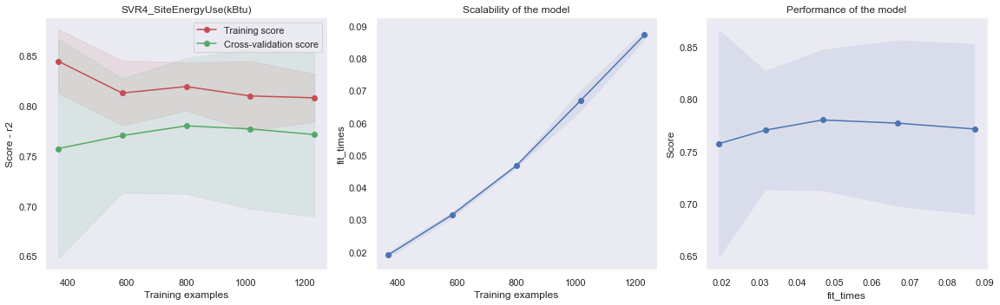

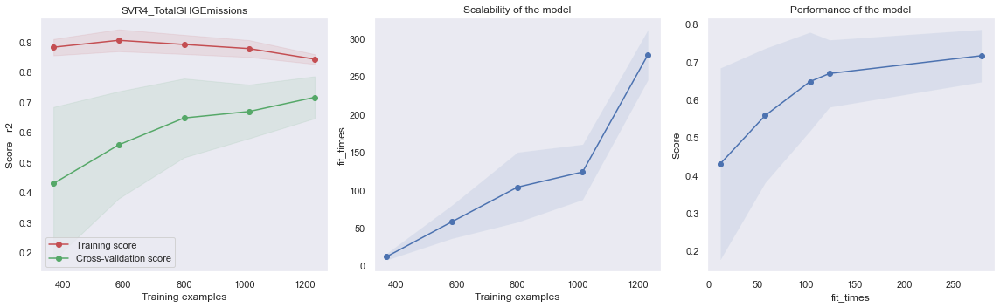

In [354]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes1, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [355]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [356]:
output_test_evaluation(model_name)

Model: SVR4
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.78 pour le test du modèle (cv ou gridsearch)
 0.63 pour l'évaluation avec le test set
eval score / test score : 0.80

Le metric neg_mean_absolute_error donne :
-2989697.06 pour le test du modèle (cv ou gridsearch)
-3056743.65 pour l'évaluation avec le test set
eval score / test score : 1.02

Le metric neg_root_mean_squared_error donne :
-8388372.99 pour le test du modèle (cv ou gridsearch)
-7251970.05 pour l'évaluation avec le test set
eval score / test score : 0.86

Le metric neg_mean_absolute_percentage_error donne :
-0.66 pour le test du modèle (cv ou gridsearch)
-0.54 pour l'évaluation avec le test set
eval score / test score : 0.81

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.66 pour le test 

#### Les Résidus

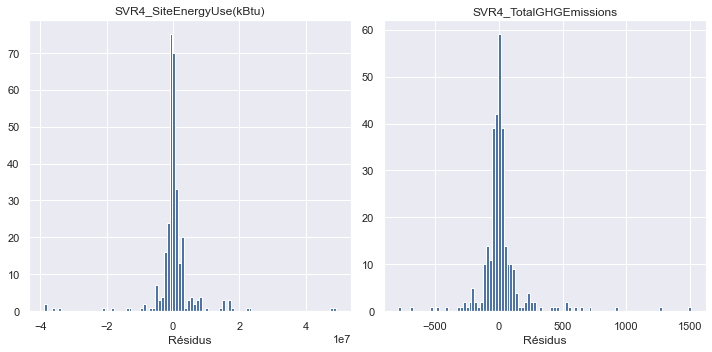

In [357]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

### 8.4.6 GradientBoostingR4

In [358]:
model_name = 'GradientBoostingR4'

In [359]:
model = GradientBoostingRegressor()
param_grid = {'model__regressor__learning_rate' : np.logspace(-3,0,5)}

pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [360]:
output_evaluation(model_name)

Model: GradientBoostingR4
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__learning_rate': 0.1778279410038923}

Le metric r2 donne :
 0.95 +/-  0.00 pour le train sets
 0.69 +/-  0.12 pour le test sets
test score / train score : 1.38

Le metric neg_mean_absolute_error donne :
-1748745.63 +/-  52914.65 pour le train sets
-3230745.02 +/-  527978.87 pour le test sets
test score / train score : 0.54

Le metric neg_root_mean_squared_error donne :
-4334688.76 +/-  195844.71 pour le train sets
-10624096.11 +/-  4141858.65 pour le test sets
test score / train score : 0.41

Le metric neg_mean_absolute_percentage_error donne :
-0.34 +/-  0.01 pour le train sets
-0.73 +/-  0.36 pour le test sets
test score / train score : 0.47

Le temps d'entrainement est  208.18 +/- 3.02 ms.
__________________________________________________

Variable Target: TotalGHGEmiss

#### Courbe d'Apprentissage

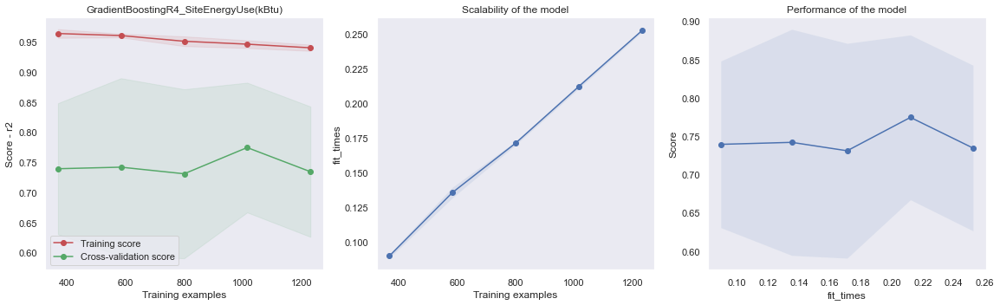

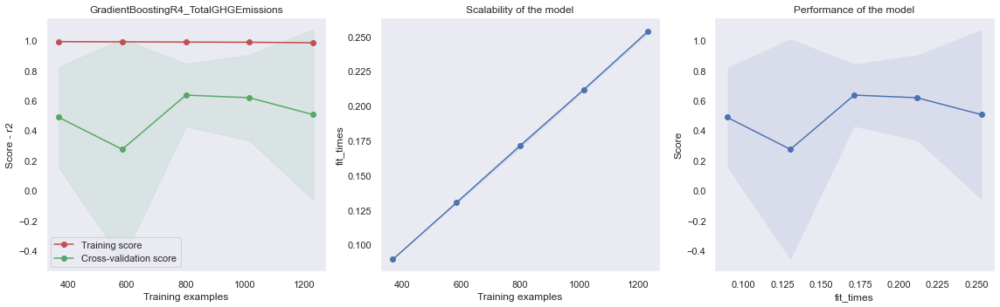

In [361]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes1, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [362]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [363]:
output_test_evaluation(model_name)

Model: GradientBoostingR4
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.69 pour le test du modèle (cv ou gridsearch)
 0.73 pour l'évaluation avec le test set
eval score / test score : 1.06

Le metric neg_mean_absolute_error donne :
-3230745.02 pour le test du modèle (cv ou gridsearch)
-2755286.11 pour l'évaluation avec le test set
eval score / test score : 0.85

Le metric neg_root_mean_squared_error donne :
-10624096.11 pour le test du modèle (cv ou gridsearch)
-6200521.84 pour l'évaluation avec le test set
eval score / test score : 0.58

Le metric neg_mean_absolute_percentage_error donne :
-0.73 pour le test du modèle (cv ou gridsearch)
-0.53 pour l'évaluation avec le test set
eval score / test score : 0.72

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.7

#### Les Résidus

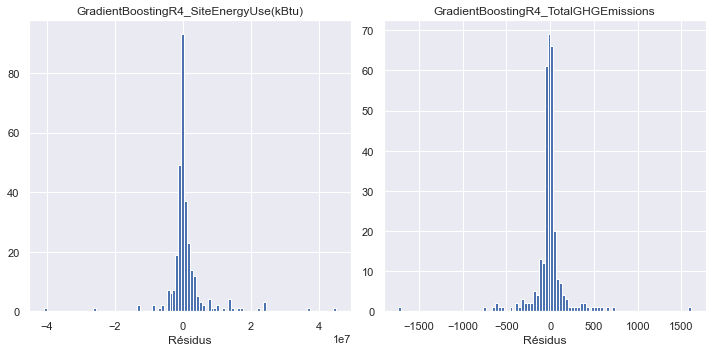

In [364]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

#### Importances des Features

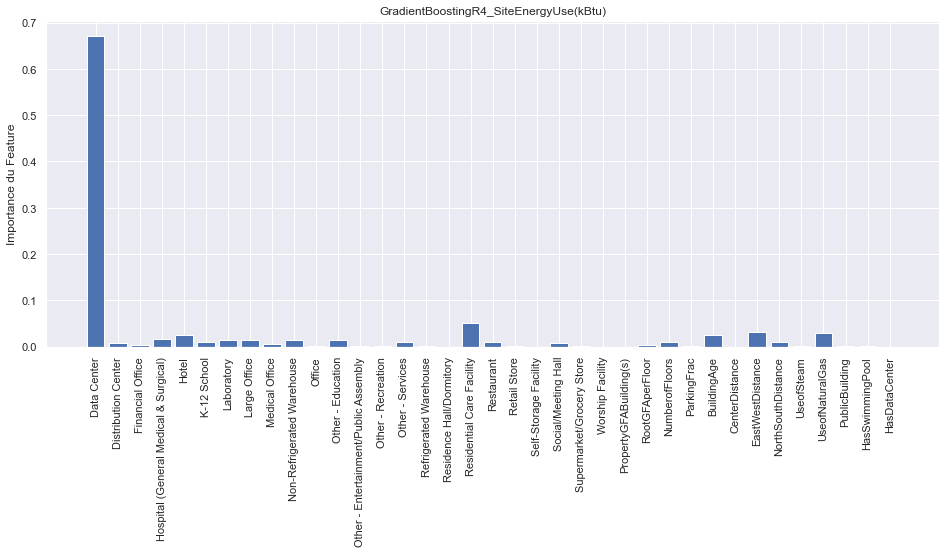

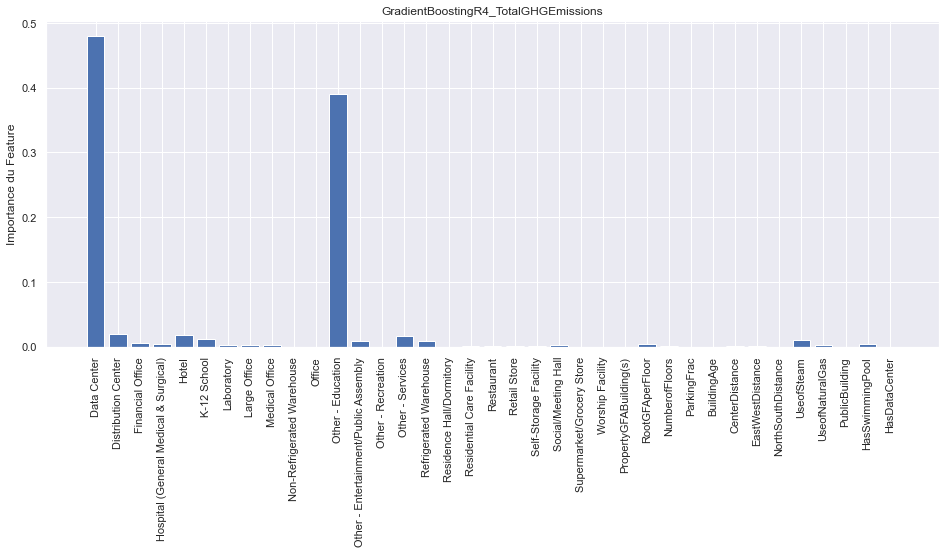

In [365]:
for pipeline, target in zip(pipelines, targets) :
    title = '_'.join([model_name, target]) 
    fitted_estimator=model_dict[title]['estimator'].fit(X_train, y_train[target])
    fig, ax = plt.subplots(figsize = (16, 6))
    plt.bar(X_train.columns.values, abs(fitted_estimator.named_steps.model.regressor_.feature_importances_))
    plt.title(title)
    plt.ylabel('Importance du Feature')
    plt.xticks(rotation = 'vertical')
    plt.show()

### 8.4.8 RandomForestR4

In [366]:
model_name = 'RandomForestR4'

In [367]:
model = RandomForestRegressor()
param_grid = {
              'model__regressor__n_estimators' : [7, 8, 9, 10, 15, 20, 30, 40, 50, 100],
              'model__regressor__max_depth' : [50, 60, 70, 80, 90, 100, 110]
              }
pipelines = [build_complete_model(model, preprocessor_X, preprocessor_y) for preprocessor_y in preprocessors_y]
for pipeline, target in zip(pipelines, targets) :
    model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train, y_train[target], pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [368]:
output_evaluation(model_name)

Model: RandomForestR4
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__max_depth': 110, 'model__regressor__n_estimators': 7}

Le metric r2 donne :
 0.92 +/-  0.03 pour le train sets
 0.73 +/-  0.13 pour le test sets
test score / train score : 1.25

Le metric neg_mean_absolute_error donne :
-1496405.51 +/-  131041.86 pour le train sets
-3363170.33 +/-  634439.09 pour le test sets
test score / train score : 0.44

Le metric neg_root_mean_squared_error donne :
-5633265.00 +/-  1118660.90 pour le train sets
-9746095.58 +/-  4060562.25 pour le test sets
test score / train score : 0.58

Le metric neg_mean_absolute_percentage_error donne :
-0.23 +/-  0.01 pour le train sets
-0.83 +/-  0.42 pour le test sets
test score / train score : 0.28

Le temps d'entrainement est  49.39 +/- 1.19 ms.
__________________________________________________

Variable Target:

#### Courbe d'Apprentissage

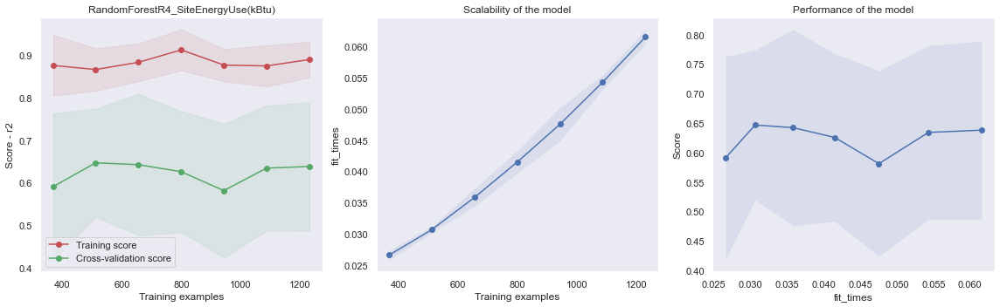

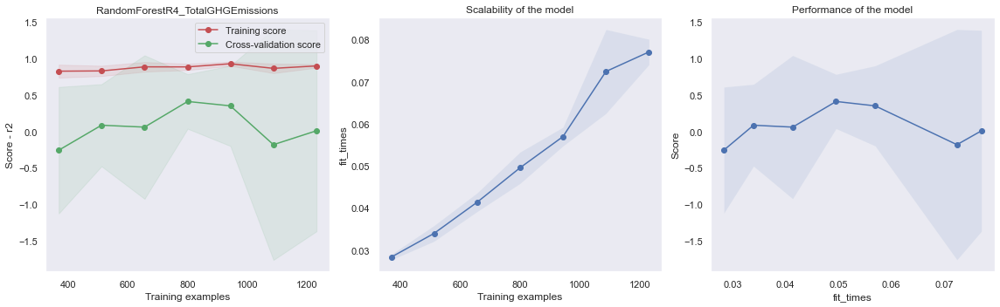

In [369]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    fig, axes = plt.subplots(1, 3, figsize=(16, 5))
    plot_learning_curve(estimator, title, X, y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
    plt.tight_layout()

#### Evaluation avec le Test Set

In [370]:
for target in targets:
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    model_dict[title]['eval_scores'] = test_evaluation(X_test, y_test[target], estimator, scoring_tple = scoring_tple)

In [371]:
output_test_evaluation(model_name)

Model: RandomForestR4
__________________________________________________

Variable Target: SiteEnergyUse(kBtu)
--------------------------------------------------
Le metric r2 donne :
 0.73 pour le test du modèle (cv ou gridsearch)
 0.63 pour l'évaluation avec le test set
eval score / test score : 0.85

Le metric neg_mean_absolute_error donne :
-3363170.33 pour le test du modèle (cv ou gridsearch)
-3255855.00 pour l'évaluation avec le test set
eval score / test score : 0.97

Le metric neg_root_mean_squared_error donne :
-9746095.58 pour le test du modèle (cv ou gridsearch)
-7294679.78 pour l'évaluation avec le test set
eval score / test score : 0.75

Le metric neg_mean_absolute_percentage_error donne :
-0.83 pour le test du modèle (cv ou gridsearch)
-0.66 pour l'évaluation avec le test set
eval score / test score : 0.80

__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.74 pou

#### Les Résidus

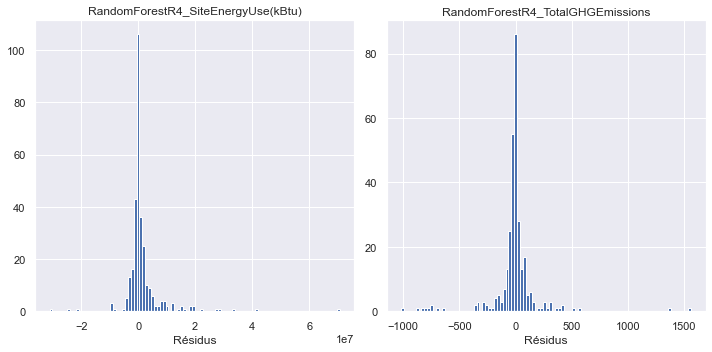

In [372]:
fig, ax = plt.subplots(1, 2, figsize=(10, 5))

for i, target in enumerate(targets):
    title = '_'.join([model_name, target])
    estimator = model_dict[title]['estimator']
    estimator.fit(X_train, y_train[target])
    y_pred = estimator.predict(X_test)
    resid = y_test[target] - y_pred
    plt.axes(ax[i])
    plt.hist(resid, bins = 100)
    plt.xlabel('Résidus')
    plt.title(title)
plt.tight_layout()

#### Importances des Features

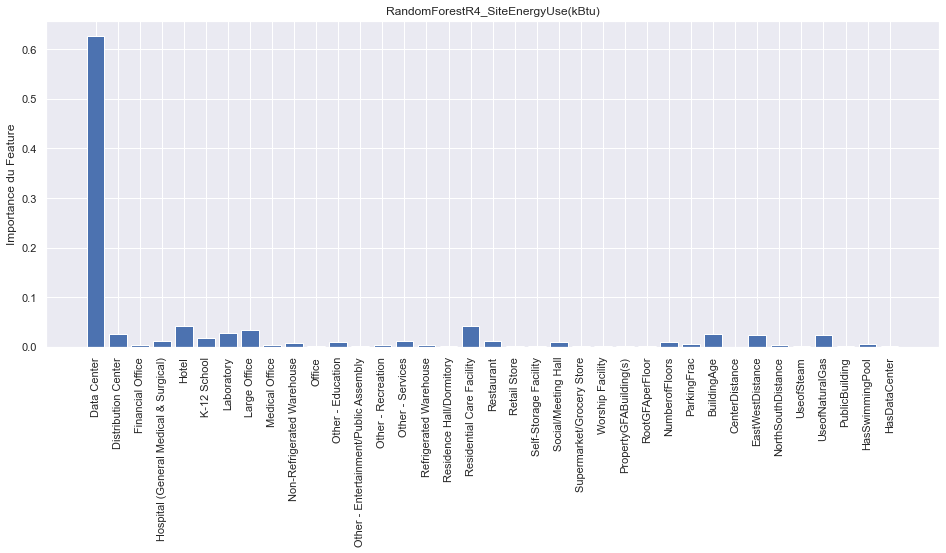

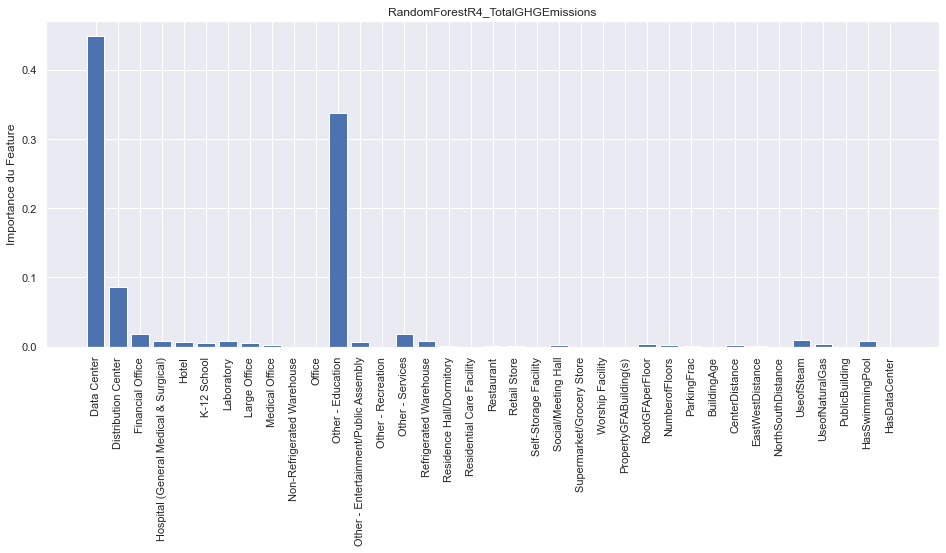

In [373]:
for pipeline, target in zip(pipelines, targets) :
    title = '_'.join([model_name, target]) 
    fitted_estimator=model_dict[title]['estimator'].fit(X_train, y_train[target])
    fig, ax = plt.subplots(figsize = (16, 6))
    plt.bar(X_train.columns.values, abs(fitted_estimator.named_steps.model.regressor_.feature_importances_))
    plt.title(title)
    plt.ylabel('Importance du Feature')
    plt.xticks(rotation = 'vertical')
    plt.show()

## 8.5 Evaluation - Version 4

In [374]:
model_list_bases = ['SVR', 'GradientBoostingR', 'RandomForestR']
model_list = [m+'4' for m in model_list_bases]

In [375]:
targets = ['SiteEnergyUse(kBtu)', 'TotalGHGEmissions']
df_dict = output_model_evaluations(model_list, targets)

for target in targets:
    display(df_dict[target])

,train_r2,eval_r2,train_nMAE,eval_nMAE,train_nRMSE,eval_nRMSE,train_nMAPE,eval_nMAPE,train_time
SVR4,0.783867,0.630174,-2.989697e+06,-3.056744e+06,-8.388373e+06,-7.251970e+06,-0.664213,-0.540152,63.641882
GradientBoostingR4,0.687783,0.729640,-3.230745e+06,-2.755286e+06,-1.062410e+07,-6.200522e+06,-0.734301,-0.528618,208.180380
RandomForestR4,0.732597,0.625805,-3.363170e+06,-3.255855e+06,-9.746096e+06,-7.294680e+06,-0.825240,-0.662143,49.394083


,train_r2,eval_r2,train_nMAE,eval_nMAE,train_nRMSE,eval_nRMSE,train_nMAPE,eval_nMAPE,train_time
SVR4,0.661492,0.539429,-110.881560,-93.662407,-327.560643,-193.336112,-3.561673e+14,-2.161944,104674.467421
GradientBoostingR4,0.772491,0.473845,-89.194721,-97.500484,-253.983553,-206.643327,-5.067785e+14,-1.707917,208.530092
RandomForestR4,0.736984,0.374172,-92.743205,-98.312210,-289.789366,-225.367814,-2.637640e+14,-1.651194,61.693716


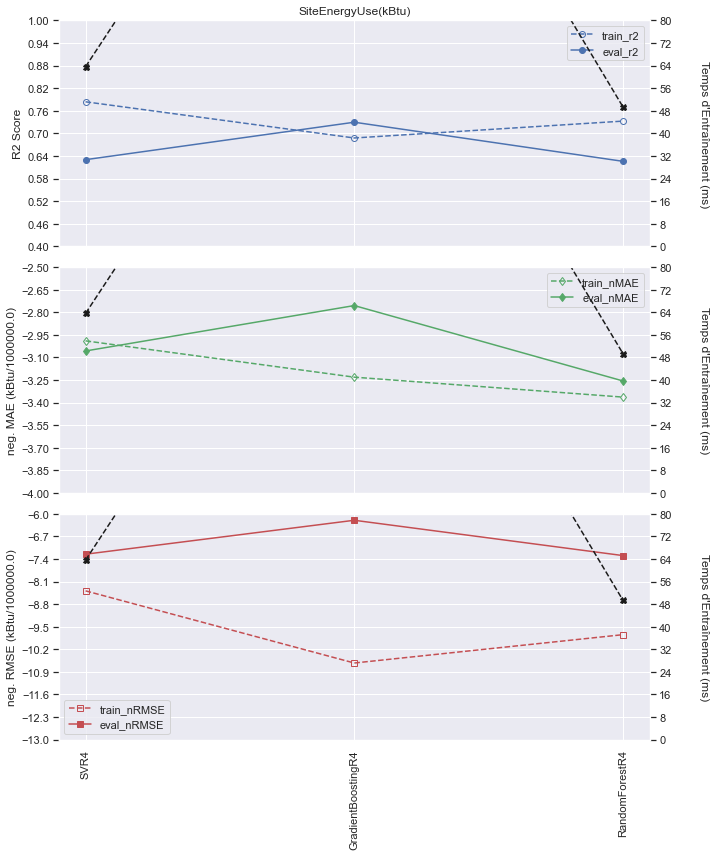

In [376]:
target = 'SiteEnergyUse(kBtu)'
data = df_dict[target]
scaling = 1e6
ylims = ((0.4, 1), (-4, -2.5), (-13, -6), (0, 80), (0, 80), (0, 80))
plot_model_evaluations(df_dict[target], title = target, scaling = scaling, ylims = ylims)

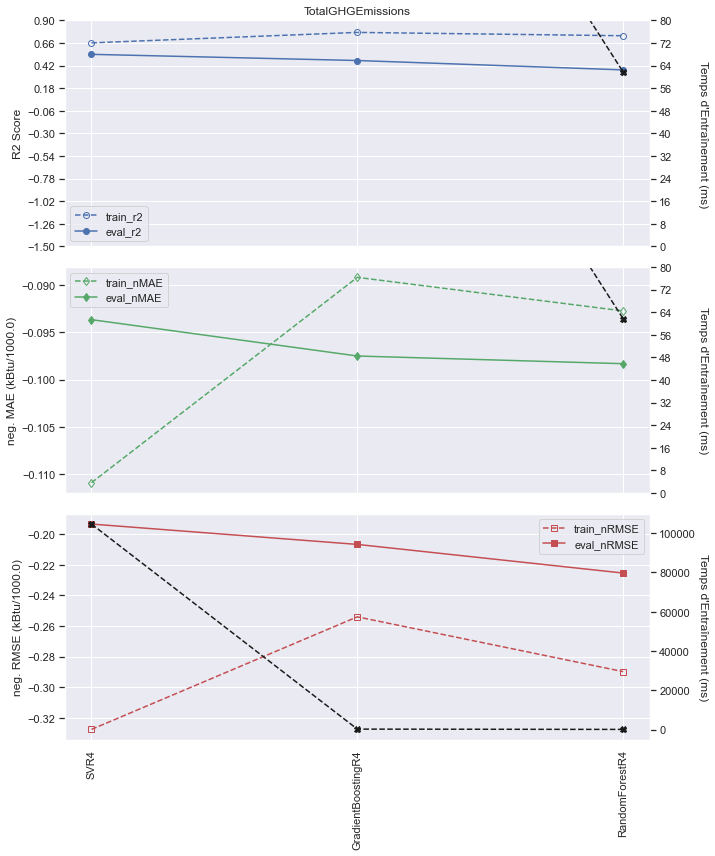

In [377]:
target = 'TotalGHGEmissions'
data = df_dict[target]
scaling = 1e3
ylims = ((-1.5,0.9), (None, None), (None, None), (0, 80), (0, 80), (None, None))
plot_model_evaluations(df_dict[target], title = target, scaling = scaling, ylims = ylims)

# 9. Comparison des Modèles

In [378]:
model_list = []

for key in model_dict.keys():
    model_name, target = key.rsplit('_', 1)
    if model_name not in model_list:
        model_list.append(model_name)
        
targets = ['SiteEnergyUse(kBtu)', 'TotalGHGEmissions']
df_dict = output_model_evaluations(model_list, targets)

#### Tableaux

In [379]:
for target in targets:
    display(df_dict[target])

,train_r2,eval_r2,train_nMAE,eval_nMAE,train_nRMSE,eval_nRMSE,train_nMAPE,eval_nMAPE,train_time
Dummy0,-0.069297,-0.104254,-6.587312e+06,-5.550654e+06,-1.989337e+07,-1.253117e+07,-1.937700,-1.521525,18.203306
LinRegr0_0,0.719114,0.526621,-3.153182e+06,-3.316556e+06,-1.010253e+07,-8.204674e+06,-0.818103,-0.613419,12.758064
LinRegr0_1,0.720147,0.561827,-3.129023e+06,-3.206889e+06,-1.002726e+07,-7.893682e+06,-0.750405,-0.595453,9.597778
SVR0,0.773737,0.620552,-3.033593e+06,-3.104194e+06,-8.852545e+06,-7.345702e+06,-0.839303,-0.622785,64.254332
GradientBoostingR0,0.751456,0.629664,-3.173124e+06,-3.118017e+06,-9.015475e+06,-7.256963e+06,-0.869689,-0.605491,81.074047
KNR0,0.674023,0.468014,-3.635158e+06,-3.623535e+06,-1.098554e+07,-8.697754e+06,-0.917625,-0.736620,7.995176
RandomForestR0,0.742374,0.630217,-3.388101e+06,-3.294634e+06,-9.264783e+06,-7.251546e+06,-1.086474,-0.775594,33.650923
LinRegr1,0.712082,0.546032,-3.175290e+06,-3.273238e+06,-1.014728e+07,-8.034696e+06,-0.744112,-0.602272,17.703390
Ridge1,0.730277,0.598024,-3.206088e+06,-3.126790e+06,-9.718456e+06,-7.560614e+06,-0.796823,-0.608432,7.940626
Lasso1,0.729041,0.615837,-3.161533e+06,-3.110090e+06,-9.648426e+06,-7.391198e+06,-0.743334,-0.593532,8.007812


,train_r2,eval_r2,train_nMAE,eval_nMAE,train_nRMSE,eval_nRMSE,train_nMAPE,eval_nMAPE,train_time
Dummy0,-0.001536,-0.011328,-193.591480,-165.513576,-591.549070,-286.490732,-6.093349e+14,-8.343297,11.194324
LinRegr0_0,0.585239,-0.592707,-143.272234,-154.362800,-369.490306,-359.527731,-1.053038e+15,-5.797614,9.612942
LinRegr0_1,0.585239,-0.592707,-143.272234,-154.362800,-369.490306,-359.527731,-1.053038e+15,-5.797614,12.802553
SVR0,0.681071,0.511440,-100.004693,-94.268807,-330.036908,-199.123904,-5.932256e+14,-1.978470,3652.942133
GradientBoostingR0,0.768404,0.214614,-95.410964,-116.934772,-239.041541,-252.467883,-8.095044e+14,-2.631749,76.799440
KNR0,0.735993,0.360946,-108.896116,-107.168604,-284.246263,-227.736873,-6.311695e+14,-1.958531,6.342602
RandomForestR0,0.774683,0.314101,-103.175439,-115.068163,-258.209567,-235.936255,-9.454905e+14,-2.726049,31.990862
LinRegr1,0.576515,-0.600829,-144.250071,-155.261151,-372.060797,-360.443341,-9.367170e+14,-5.966470,20.232534
Ridge1,0.594989,-0.312871,-149.119347,-156.728567,-373.921646,-326.419119,-8.971012e+14,-6.198352,8.003139
Lasso1,0.578025,-0.533636,-144.454210,-152.882742,-372.072881,-352.797611,-8.735610e+14,-5.929948,7.985210


#### Graphiques

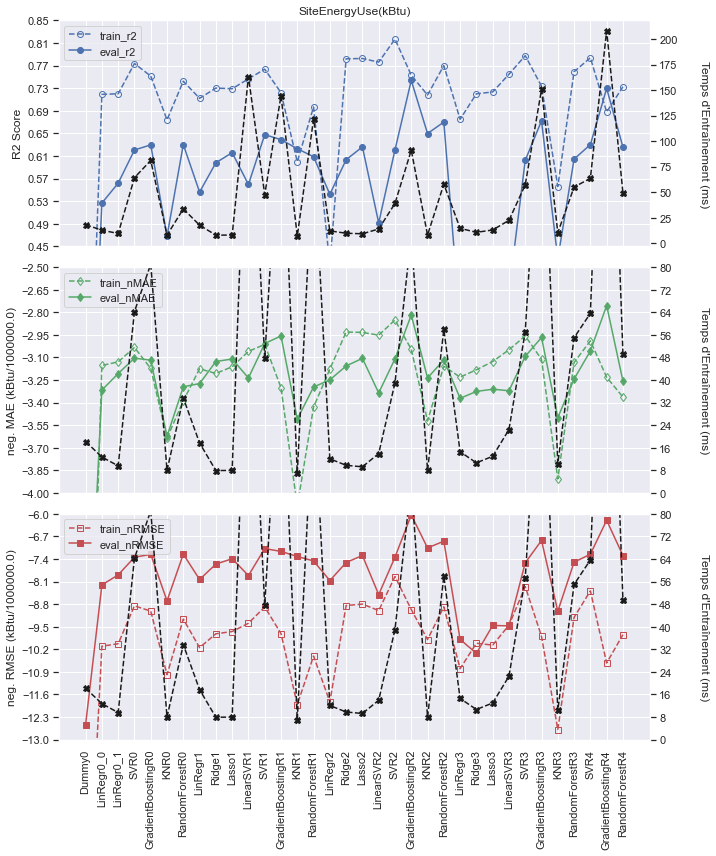

In [381]:
target = 'SiteEnergyUse(kBtu)'
data = df_dict[target]
scaling = 1e6
ylims = ((0.45, 0.85), (-4, -2.5), (-13, -6), (None, None), (0, 80), (0, 80))
plot_model_evaluations(df_dict[target], title = target, scaling = scaling, ylims = ylims)

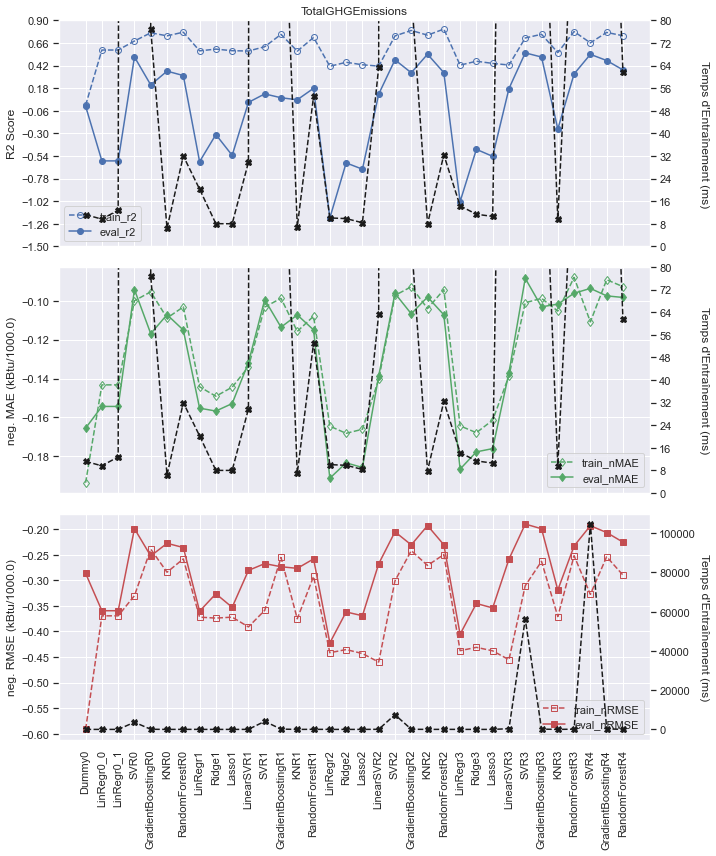

In [382]:
target = 'TotalGHGEmissions'
data = df_dict[target]
scaling = 1e3
ylims = ((-1.5,0.9), (None, None), (None, None), (0, 80), (0, 80), (None, None))
plot_model_evaluations(df_dict[target], title = target, scaling = scaling, ylims = ylims)

# 10. L'Emissions de CO2

## 10.1 Tous les Features

In [450]:
frachot_features = list(X_frachot.columns.values)
logscale_features = ['PropertyGFABuilding(s)', 'GFAperFloor', 'NumberofFloors']
log1pscale_features = ['ParkingFrac']
standardscale_features = ['BuildingAge', 'CenterDistance','EastWestDistance', 'NorthSouthDistance', 'ENERGYSTARScore']
other_features = ['UseofSteam', 'UseofNaturalGas', 'PublicBuilding', 'HasSwimmingPool', 'HasDataCenter']

X = pd.concat([X_frachot, dataset[logscale_features + log1pscale_features + standardscale_features + other_features]], axis = 1)
X['ENERGYSTARScore'] = dataset['ENERGYSTARScore'].fillna(0)

## 10.2 Train/Test Dévision

In [451]:
y = dataset[targets]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, random_state = seed)

## 10.3 Prédire la Consommation d'Energie

### 10.3.1 Features pour la Consommation d'Enegie

In [452]:
logscale_features = ['PropertyGFABuilding(s)']
log1pscale_features = ['ParkingFrac']
frachot_features = list(X_frachot.columns.values)
features = frachot_features + logscale_features + log1pscale_features

### 10.3.2 Train/Test Préparation

In [453]:
target = 'SiteEnergyUse(kBtu)'
y_train_0, y_test_0 = y_train[target], y_test[target]
X_train_0, X_test_0 = X_train[features], X_test[features]

### 10.3.3 Le Modèle GradientBoostingR2

In [454]:
model_name = 'GradientBoostingR2'
title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
estimator.fit(X_train_0, y_train_0)
y_train_pred = estimator.predict(X_train[features])
y_test_pred = estimator.predict(X_test[features])
y_pred = estimator.predict(X[features])


X_train['SiteEnergyUse_Pred'] = y_train_pred
X_test['SiteEnergyUse_Pred'] = y_test_pred
X['SiteEnergyUse_Pred'] = y_pred

c:\users\bookj\environments\jupenv\lib\site-packages\pandas\core\frame.py:3607: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._set_item(key, value)


## 10.4 Créer un Modèle pour les Emissions de CO2 - 1
(avec EnergySiteUse_pred, sans EnergyStarScore)

### 10.4.1 Features pour les Emissions de CO2

In [433]:
frachot_features = list(X_frachot.columns.values)
logscale_features = ['PropertyGFABuilding(s)', 'SiteEnergyUse_Pred']
log1pscale_features = ['ParkingFrac']
features = frachot_features + logscale_features + log1pscale_features

### 10.4.2 Train/Test Préparation

In [434]:
target = 'TotalGHGEmissions'
y_train_1, y_test_1 = y_train[target], y_test[target]
X_train_1, X_test_1 = X_train[features], X_test[features]

### 10.4.3 Préprocesseurs

In [435]:
preprocessor_X = create_preprocessor_X(logscale_features = logscale_features, log1pscale_features = log1pscale_features,)
preprocessor_y = create_preprocessor_y('log1p')

### 10.4.4 Le Modèle KNR2 -> KNR5

In [436]:
model_name = 'KNR5'

In [437]:
model = KNeighborsRegressor()
param_grid = {
              'model__regressor__n_neighbors': range(1,11),
              'model__regressor__weights' : ['uniform', 'distance'],
              'model__regressor__leaf_size' : range(1,50,5)
               }

pipeline = build_complete_model(model, preprocessor_X, preprocessor_y)
model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train_1, y_train_1, pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [438]:
output_evaluation(model_name, targets = [target])

Model: KNR5
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__leaf_size': 1, 'model__regressor__n_neighbors': 4, 'model__regressor__weights': 'distance'}

Le metric r2 donne :
 1.00 +/-  0.00 pour le train sets
 0.79 +/-  0.09 pour le test sets
test score / train score : 1.27

Le metric neg_mean_absolute_error donne :
-0.05 +/-  0.02 pour le train sets
-86.39 +/-  8.06 pour le test sets
test score / train score : 0.00

Le metric neg_root_mean_squared_error donne :
-0.68 +/-  0.23 pour le train sets
-255.34 +/-  44.30 pour le test sets
test score / train score : 0.00

Le metric neg_mean_absolute_percentage_error donne :
-0.00 +/-  0.00 pour le train sets
-587613038502959.75 +/-  1175226077005914.75 pour le test sets
test score / train score : 0.00

Le temps d'entrainement est  14.41 +/- 3.21 ms.
__________________________________________________


#### Courbe d'Apprentissage

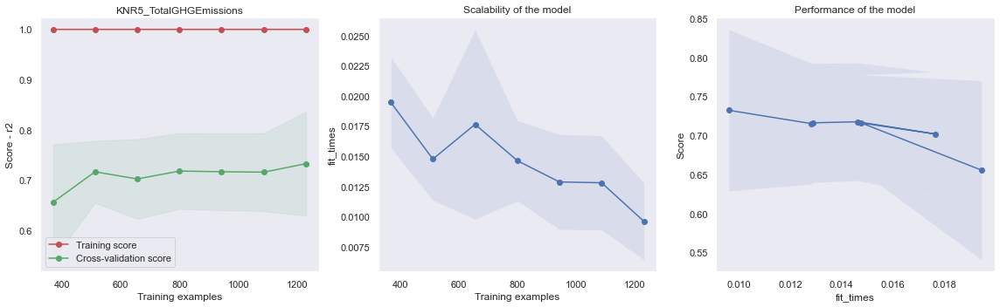

In [439]:
title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
plot_learning_curve(estimator, title, X[features], y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
plt.tight_layout()

#### Evaluation avec le Test Set

In [440]:
title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
estimator.fit(X_train_1, y_train_1)
model_dict[title]['eval_scores'] = test_evaluation(X_test_1, y_test_1, estimator, scoring_tple = scoring_tple)

In [441]:
output_test_evaluation(model_name, targets = [target])

Model: KNR5
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.79 pour le test du modèle (cv ou gridsearch)
 0.51 pour l'évaluation avec le test set
eval score / test score : 0.64

Le metric neg_mean_absolute_error donne :
-86.39 pour le test du modèle (cv ou gridsearch)
-91.24 pour l'évaluation avec le test set
eval score / test score : 1.06

Le metric neg_root_mean_squared_error donne :
-255.34 pour le test du modèle (cv ou gridsearch)
-199.56 pour l'évaluation avec le test set
eval score / test score : 0.78

Le metric neg_mean_absolute_percentage_error donne :
-587613038502959.75 pour le test du modèle (cv ou gridsearch)
-1.27 pour l'évaluation avec le test set
eval score / test score : 0.00

__________________________________________________


#### Les Résidus

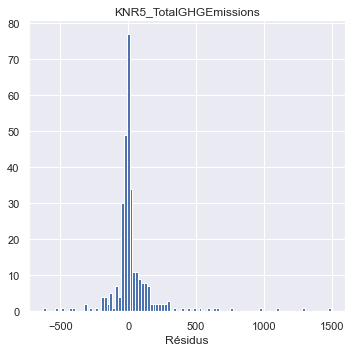

In [442]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
estimator.fit(X_train_1, y_train_1)
y_pred = estimator.predict(X_test_1)
resid = y_test_1 - y_pred
plt.hist(resid, bins = 100)
plt.xlabel('Résidus')
plt.title(title)
    
plt.tight_layout()

## 10.5 Créer un Modèle pour les Emissions de CO2 - 2
(avec EnergySiteUse_pred, sans EnergyStarScore)

### 10.5.1 Features pour les Emissions de CO2

In [455]:
frachot_features = list(X_frachot.columns.values)
logscale_features = ['PropertyGFABuilding(s)', 'GFAperFloor', 'SiteEnergyUse_Pred']
log1pscale_features = ['ParkingFrac']
standardscale_features = ['BuildingAge', 'CenterDistance']
other_features = ['UseofSteam', 'UseofNaturalGas', 'PublicBuilding', 'HasSwimmingPool', 'HasDataCenter']

features = frachot_features + logscale_features + log1pscale_features + standardscale_features + other_features

### 10.5.2 Train/Test Préparation

In [456]:
target = 'TotalGHGEmissions'
y_train_1, y_test_1 = y_train[target], y_test[target]
X_train_1, X_test_1 = X_train[features], X_test[features]

### 10.5.3 Préprocesseurs

In [458]:
preprocessor_X = create_preprocessor_X(logscale_features = logscale_features, log1pscale_features = log1pscale_features,
                                      standardscale_features = standardscale_features)
preprocessor_y = create_preprocessor_y('log1p')

### 10.5.4 Le Modèle GradientBoostingR3 -> GradientBoostingR5

In [459]:
model_name = 'GradientBoostingR5'

In [460]:
model = GradientBoostingRegressor()
param_grid = {'model__regressor__learning_rate' : np.logspace(-3,0,5)}

pipeline = build_complete_model(model, preprocessor_X, preprocessor_y)
model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train_1, y_train_1, pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [461]:
output_evaluation(model_name, targets = [target])

Model: GradientBoostingR5
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__learning_rate': 0.1778279410038923}

Le metric r2 donne :
 0.95 +/-  0.01 pour le train sets
 0.84 +/-  0.09 pour le test sets
test score / train score : 1.12

Le metric neg_mean_absolute_error donne :
-42.61 +/-  2.45 pour le train sets
-68.99 +/-  13.91 pour le test sets
test score / train score : 0.62

Le metric neg_root_mean_squared_error donne :
-142.61 +/-  13.68 pour le train sets
-214.67 +/-  68.15 pour le test sets
test score / train score : 0.66

Le metric neg_mean_absolute_percentage_error donne :
-7294674514009.49 +/-  5322738261598.62 pour le train sets
-238488403886048.94 +/-  476976807772096.38 pour le test sets
test score / train score : 0.03

Le temps d'entrainement est  284.88 +/- 9.56 ms.
__________________________________________________


#### Courbe d'Apprentissage

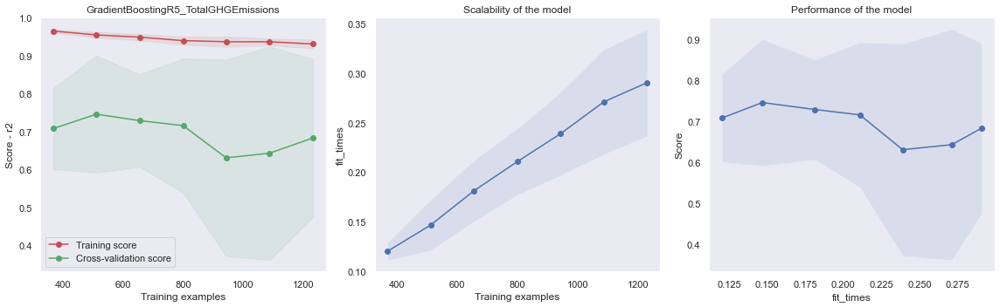

In [462]:
title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
plot_learning_curve(estimator, title, X[features], y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
plt.tight_layout()

#### Evaluation avec le Test Set

In [463]:
title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
estimator.fit(X_train_1, y_train_1)
model_dict[title]['eval_scores'] = test_evaluation(X_test_1, y_test_1, estimator, scoring_tple = scoring_tple)

In [464]:
output_test_evaluation(model_name, targets = [target])

Model: GradientBoostingR5
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.84 pour le test du modèle (cv ou gridsearch)
 0.18 pour l'évaluation avec le test set
eval score / test score : 0.21

Le metric neg_mean_absolute_error donne :
-68.99 pour le test du modèle (cv ou gridsearch)
-83.73 pour l'évaluation avec le test set
eval score / test score : 1.21

Le metric neg_root_mean_squared_error donne :
-214.67 pour le test du modèle (cv ou gridsearch)
-257.92 pour l'évaluation avec le test set
eval score / test score : 1.20

Le metric neg_mean_absolute_percentage_error donne :
-238488403886048.94 pour le test du modèle (cv ou gridsearch)
-0.78 pour l'évaluation avec le test set
eval score / test score : 0.00

__________________________________________________


#### Les Résidus

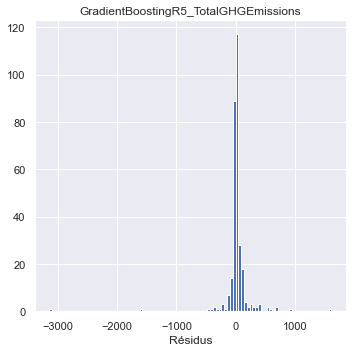

In [465]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
estimator.fit(X_train_1, y_train_1)
y_pred = estimator.predict(X_test_1)
resid = y_test_1 - y_pred
plt.hist(resid, bins = 100)
plt.xlabel('Résidus')
plt.title(title)
    
plt.tight_layout()

## 10.6 Créer un Modèle pour les Emissions de CO2 - 3
(avec EnergySiteUse_pred, sans EnergyStarScore)

### 10.6.1 Features pour les Emissions de CO2

In [509]:
frachot_features = list(X_frachot.columns.values)
logscale_features = ['PropertyGFABuilding(s)', 'GFAperFloor', 'SiteEnergyUse_Pred']
log1pscale_features = ['ParkingFrac']
standardscale_features = ['BuildingAge', 'CenterDistance']
other_features = ['UseofSteam', 'UseofNaturalGas', 'PublicBuilding', 'HasSwimmingPool', 'HasDataCenter']

features = frachot_features + logscale_features + log1pscale_features + standardscale_features + other_features

### 10.6.2 Train/Test Préparation

In [510]:
target = 'TotalGHGEmissions'
y_train_1, y_test_1 = y_train[target], y_test[target]
X_train_1, X_test_1 = X_train[features], X_test[features]

### 10.6.3 Préprocesseurs

In [511]:
preprocessor_X = create_preprocessor_X(logscale_features = logscale_features, log1pscale_features = log1pscale_features,
                                      standardscale_features = standardscale_features)
preprocessor_y = create_preprocessor_y('log1p')

### 10.6.4 Le Modèle RandomForestR3 -> RandomForestR5

In [512]:
model_name = 'RandomForestR5'

In [513]:
model = RandomForestRegressor()
param_grid = {
              'model__regressor__n_estimators' : [7, 8, 9, 10, 15, 20, 30, 40, 50, 100],
              'model__regressor__max_depth' : [50, 60, 70, 80, 90, 100, 110]
              }

pipeline = build_complete_model(model, preprocessor_X, preprocessor_y)
model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train_1, y_train_1, pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [514]:
output_evaluation(model_name, targets = [target])

Model: RandomForestR5
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__max_depth': 60, 'model__regressor__n_estimators': 7}

Le metric r2 donne :
 0.88 +/-  0.05 pour le train sets
 0.87 +/-  0.06 pour le test sets
test score / train score : 1.01

Le metric neg_mean_absolute_error donne :
-37.27 +/-  4.01 pour le train sets
-68.36 +/-  9.40 pour le test sets
test score / train score : 0.55

Le metric neg_root_mean_squared_error donne :
-204.93 +/-  53.92 pour le train sets
-200.06 +/-  71.56 pour le test sets
test score / train score : 1.02

Le metric neg_mean_absolute_percentage_error donne :
-15490403365812.22 +/-  12211340541057.95 pour le train sets
-129303225000148.80 +/-  258606450000295.94 pour le test sets
test score / train score : 0.12

Le temps d'entrainement est  38.39 +/- 3.20 ms.
__________________________________________________


#### Courbe d'Apprentissage

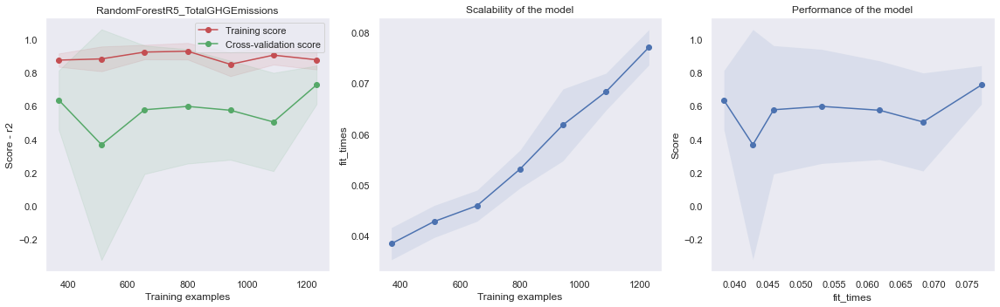

In [515]:
title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
plot_learning_curve(estimator, title, X[features], y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
plt.tight_layout()

#### Evaluation avec le Test Set

In [516]:
title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
estimator.fit(X_train_1, y_train_1)
model_dict[title]['eval_scores'] = test_evaluation(X_test_1, y_test_1, estimator, scoring_tple = scoring_tple)

In [517]:
output_test_evaluation(model_name, targets = [target])

Model: RandomForestR5
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.87 pour le test du modèle (cv ou gridsearch)
 0.41 pour l'évaluation avec le test set
eval score / test score : 0.47

Le metric neg_mean_absolute_error donne :
-68.36 pour le test du modèle (cv ou gridsearch)
-84.52 pour l'évaluation avec le test set
eval score / test score : 1.24

Le metric neg_root_mean_squared_error donne :
-200.06 pour le test du modèle (cv ou gridsearch)
-218.70 pour l'évaluation avec le test set
eval score / test score : 1.09

Le metric neg_mean_absolute_percentage_error donne :
-129303225000148.80 pour le test du modèle (cv ou gridsearch)
-0.87 pour l'évaluation avec le test set
eval score / test score : 0.00

__________________________________________________


#### Les Résidus

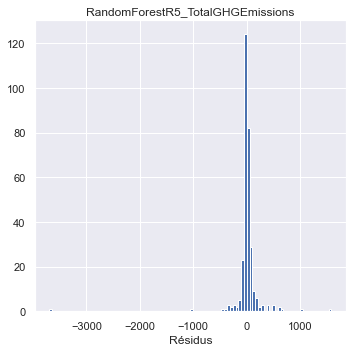

In [518]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
estimator.fit(X_train_1, y_train_1)
y_pred = estimator.predict(X_test_1)
resid = y_test_1 - y_pred
plt.hist(resid, bins = 100)
plt.xlabel('Résidus')
plt.title(title)
    
plt.tight_layout()

## 10.7 Créer un Modèle pour les Emissions de CO2 - 4
(sans EnergySiteUse_pred, avec EnergyStarScore)

### 10.7.1 Features pour les Emissions de CO2

In [467]:
frachot_features = list(X_frachot.columns.values)
logscale_features = ['PropertyGFABuilding(s)']
log1pscale_features = ['ParkingFrac']
standardscale_features = ['ENERGYSTARScore']

features = frachot_features + logscale_features + log1pscale_features + standardscale_features

### 10.7.2 Train/Test Préparation

In [468]:
target = 'TotalGHGEmissions'
y_train_1, y_test_1 = y_train[target], y_test[target]
X_train_1, X_test_1 = X_train[features], X_test[features]

### 10.7.3 Préprocesseurs

In [469]:
preprocessor_X = create_preprocessor_X(logscale_features = logscale_features, log1pscale_features = log1pscale_features,
                                       standardscale_features=standardscale_features)
preprocessor_y = create_preprocessor_y('log1p')

### 10.7.4 Le Modèle KNR2 -> KNR6

In [470]:
model_name = 'KNR6'

In [471]:
model = KNeighborsRegressor()
param_grid = {
              'model__regressor__n_neighbors': range(1,11),
              'model__regressor__weights' : ['uniform', 'distance'],
              'model__regressor__leaf_size' : range(1,50,5)
               }

pipeline = build_complete_model(model, preprocessor_X, preprocessor_y)
model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train_1, y_train_1, pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [472]:
output_evaluation(model_name, targets = [target])

Model: KNR6
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__leaf_size': 1, 'model__regressor__n_neighbors': 1, 'model__regressor__weights': 'distance'}

Le metric r2 donne :
 1.00 +/-  0.00 pour le train sets
 0.60 +/-  0.25 pour le test sets
test score / train score : 1.66

Le metric neg_mean_absolute_error donne :
-0.02 +/-  0.02 pour le train sets
-114.46 +/-  6.12 pour le test sets
test score / train score : 0.00

Le metric neg_root_mean_squared_error donne :
-0.58 +/-  0.47 pour le train sets
-322.01 +/-  28.27 pour le test sets
test score / train score : 0.00

Le metric neg_mean_absolute_percentage_error donne :
-0.00 +/-  0.00 pour le train sets
-1095286369294631.25 +/-  2190572738589255.75 pour le test sets
test score / train score : 0.00

Le temps d'entrainement est  17.83 +/- 3.32 ms.
__________________________________________________


#### Courbe d'Apprentissage

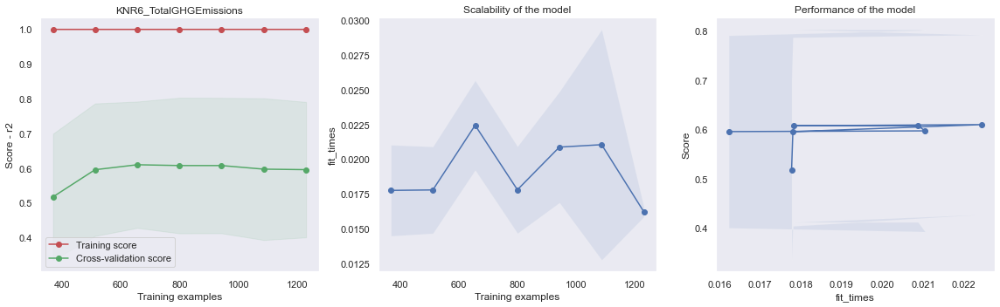

In [473]:
title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
plot_learning_curve(estimator, title, X[features], y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
plt.tight_layout()

#### Evaluation avec le Test Set

In [474]:
title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
estimator.fit(X_train_1, y_train_1)
model_dict[title]['eval_scores'] = test_evaluation(X_test_1, y_test_1, estimator, scoring_tple = scoring_tple)

In [475]:
output_test_evaluation(model_name, targets = [target])

Model: KNR6
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.60 pour le test du modèle (cv ou gridsearch)
 0.24 pour l'évaluation avec le test set
eval score / test score : 0.40

Le metric neg_mean_absolute_error donne :
-114.46 pour le test du modèle (cv ou gridsearch)
-105.86 pour l'évaluation avec le test set
eval score / test score : 0.92

Le metric neg_root_mean_squared_error donne :
-322.01 pour le test du modèle (cv ou gridsearch)
-248.43 pour l'évaluation avec le test set
eval score / test score : 0.77

Le metric neg_mean_absolute_percentage_error donne :
-1095286369294631.25 pour le test du modèle (cv ou gridsearch)
-1.42 pour l'évaluation avec le test set
eval score / test score : 0.00

__________________________________________________


#### Les Résidus

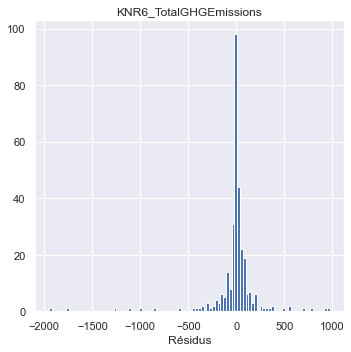

In [476]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
estimator.fit(X_train_1, y_train_1)
y_pred = estimator.predict(X_test_1)
resid = y_test_1 - y_pred
plt.hist(resid, bins = 100)
plt.xlabel('Résidus')
plt.title(title)
    
plt.tight_layout()

## 10.8 Créer un Modèle pour les Emissions de CO2 - 5
(sans EnergySiteUse_pred, avec EnergyStarScore)

### 10.8.1 Features pour les Emissions de CO2

In [519]:
frachot_features = list(X_frachot.columns.values)
logscale_features = ['PropertyGFABuilding(s)', 'GFAperFloor']
log1pscale_features = ['ParkingFrac']
standardscale_features = ['BuildingAge', 'CenterDistance', 'ENERGYSTARScore']
other_features = ['UseofSteam', 'UseofNaturalGas', 'PublicBuilding', 'HasSwimmingPool', 'HasDataCenter']

features = frachot_features + logscale_features + log1pscale_features + standardscale_features + other_features

### 10.8.2 Train/Test Préparation

In [478]:
target = 'TotalGHGEmissions'
y_train_1, y_test_1 = y_train[target], y_test[target]
X_train_1, X_test_1 = X_train[features], X_test[features]

### 10.8.3 Préprocesseurs

In [479]:
preprocessor_X = create_preprocessor_X(logscale_features = logscale_features, log1pscale_features = log1pscale_features,
                                      standardscale_features = standardscale_features)
preprocessor_y = create_preprocessor_y('log1p')

### 10.8.4 Le Modèle GradientBoostingR3 -> GradientBoostingR6

In [480]:
model_name = 'GradientBoostingR6'

In [481]:
model = GradientBoostingRegressor()
param_grid = {'model__regressor__learning_rate' : np.logspace(-3,0,5)}

pipeline = build_complete_model(model, preprocessor_X, preprocessor_y)
model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train_1, y_train_1, pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [482]:
output_evaluation(model_name, targets = [target])

Model: GradientBoostingR6
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__learning_rate': 0.1778279410038923}

Le metric r2 donne :
 0.96 +/-  0.01 pour le train sets
 0.73 +/-  0.12 pour le test sets
test score / train score : 1.32

Le metric neg_mean_absolute_error donne :
-43.46 +/-  2.22 pour le train sets
-81.26 +/-  10.02 pour le test sets
test score / train score : 0.53

Le metric neg_root_mean_squared_error donne :
-119.29 +/-  13.48 pour le train sets
-282.62 +/-  28.44 pour le test sets
test score / train score : 0.42

Le metric neg_mean_absolute_percentage_error donne :
-5759422723728.87 +/-  3096715728794.54 pour le train sets
-83317876172613.38 +/-  166635752345224.72 pour le test sets
test score / train score : 0.07

Le temps d'entrainement est  265.26 +/- 4.14 ms.
__________________________________________________


#### Courbe d'Apprentissage

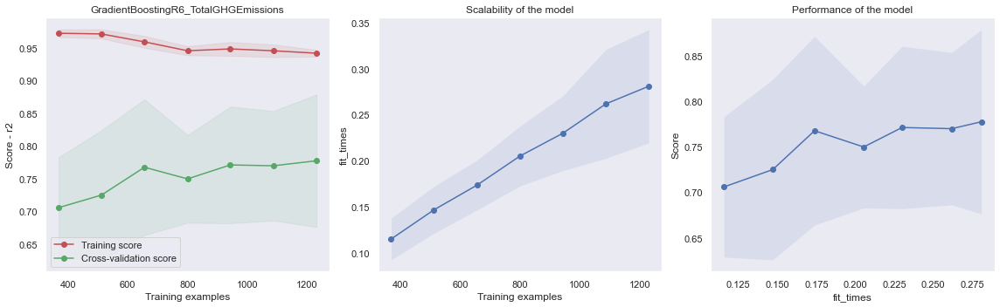

In [483]:
title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
plot_learning_curve(estimator, title, X[features], y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
plt.tight_layout()

#### Evaluation avec le Test Set

In [484]:
title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
estimator.fit(X_train_1, y_train_1)
model_dict[title]['eval_scores'] = test_evaluation(X_test_1, y_test_1, estimator, scoring_tple = scoring_tple)

In [485]:
output_test_evaluation(model_name, targets = [target])

Model: GradientBoostingR6
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.73 pour le test du modèle (cv ou gridsearch)
 0.39 pour l'évaluation avec le test set
eval score / test score : 0.53

Le metric neg_mean_absolute_error donne :
-81.26 pour le test du modèle (cv ou gridsearch)
-72.93 pour l'évaluation avec le test set
eval score / test score : 0.90

Le metric neg_root_mean_squared_error donne :
-282.62 pour le test du modèle (cv ou gridsearch)
-223.13 pour l'évaluation avec le test set
eval score / test score : 0.79

Le metric neg_mean_absolute_percentage_error donne :
-83317876172613.38 pour le test du modèle (cv ou gridsearch)
-0.70 pour l'évaluation avec le test set
eval score / test score : 0.00

__________________________________________________


#### Les Résidus

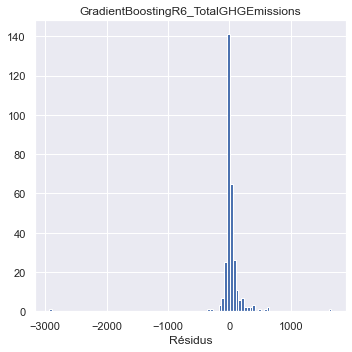

In [486]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
estimator.fit(X_train_1, y_train_1)
y_pred = estimator.predict(X_test_1)
resid = y_test_1 - y_pred
plt.hist(resid, bins = 100)
plt.xlabel('Résidus')
plt.title(title)
    
plt.tight_layout()

## 10.9 Créer un Modèle pour les Emissions de CO2 - 6
(sans EnergySiteUse_pred, sans EnergyStarScore)

### 10.9.1 Features pour les Emissions de CO2

In [549]:
frachot_features = list(X_frachot.columns.values)
logscale_features = ['PropertyGFABuilding(s)', 'GFAperFloor']
log1pscale_features = ['ParkingFrac']
standardscale_features = ['BuildingAge', 'CenterDistance', 'ENERGYSTARScore']
other_features = ['UseofSteam', 'UseofNaturalGas', 'PublicBuilding', 'HasSwimmingPool', 'HasDataCenter']

features = frachot_features + logscale_features + log1pscale_features + standardscale_features + other_features

### 10.9.2 Train/Test Préparation

In [550]:
target = 'TotalGHGEmissions'
y_train_1, y_test_1 = y_train[target], y_test[target]
X_train_1, X_test_1 = X_train[features], X_test[features]

### 10.9.3 Préprocesseurs

In [551]:
preprocessor_X = create_preprocessor_X(logscale_features = logscale_features, log1pscale_features = log1pscale_features,
                                      standardscale_features = standardscale_features)
preprocessor_y = create_preprocessor_y('log1p')

### 10.9.4 Le Modèle RandomForestR3 -> RandomForestR6

In [552]:
model_name = 'RandomForestR6'

In [553]:
model = RandomForestRegressor()
param_grid = {
              'model__regressor__n_estimators' : [7, 8, 9, 10, 15, 20, 30, 40, 50, 100],
              'model__regressor__max_depth' : [50, 60, 70, 80, 90, 100, 110]
              }

pipeline = build_complete_model(model, preprocessor_X, preprocessor_y)
model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train_1, y_train_1, pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [554]:
output_evaluation(model_name, targets = [target])

Model: RandomForestR6
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__max_depth': 50, 'model__regressor__n_estimators': 30}

Le metric r2 donne :
 0.90 +/-  0.02 pour le train sets
 0.75 +/-  0.07 pour le test sets
test score / train score : 1.19

Le metric neg_mean_absolute_error donne :
-40.57 +/-  1.91 pour le train sets
-81.81 +/-  9.65 pour le test sets
test score / train score : 0.50

Le metric neg_root_mean_squared_error donne :
-192.91 +/-  14.03 pour le train sets
-286.20 +/-  87.63 pour le test sets
test score / train score : 0.67

Le metric neg_mean_absolute_percentage_error donne :
-7934936565982.29 +/-  5195974080865.05 pour le train sets
-44971892777469.80 +/-  89943785554937.50 pour le test sets
test score / train score : 0.18

Le temps d'entrainement est  142.03 +/- 2.35 ms.
__________________________________________________


#### Courbe d'Apprentissage

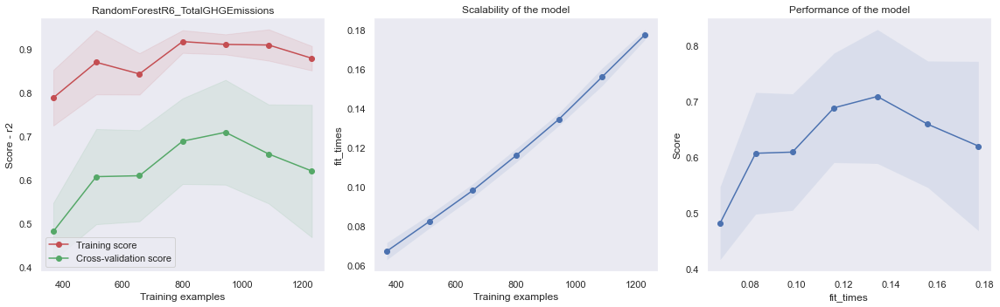

In [555]:
title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
plot_learning_curve(estimator, title, X[features], y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
plt.tight_layout()

#### Evaluation avec le Test Set

In [556]:
title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
estimator.fit(X_train_1, y_train_1)
model_dict[title]['eval_scores'] = test_evaluation(X_test_1, y_test_1, estimator, scoring_tple = scoring_tple)

In [557]:
output_test_evaluation(model_name, targets = [target])

Model: RandomForestR6
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.75 pour le test du modèle (cv ou gridsearch)
 0.58 pour l'évaluation avec le test set
eval score / test score : 0.77

Le metric neg_mean_absolute_error donne :
-81.81 pour le test du modèle (cv ou gridsearch)
-74.04 pour l'évaluation avec le test set
eval score / test score : 0.90

Le metric neg_root_mean_squared_error donne :
-286.20 pour le test du modèle (cv ou gridsearch)
-185.00 pour l'évaluation avec le test set
eval score / test score : 0.65

Le metric neg_mean_absolute_percentage_error donne :
-44971892777469.80 pour le test du modèle (cv ou gridsearch)
-0.80 pour l'évaluation avec le test set
eval score / test score : 0.00

__________________________________________________


#### Les Résidus

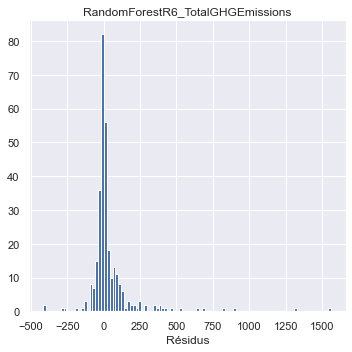

In [558]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
estimator.fit(X_train_1, y_train_1)
y_pred = estimator.predict(X_test_1)
resid = y_test_1 - y_pred
plt.hist(resid, bins = 100)
plt.xlabel('Résidus')
plt.title(title)
    
plt.tight_layout()

#### Importances des Features

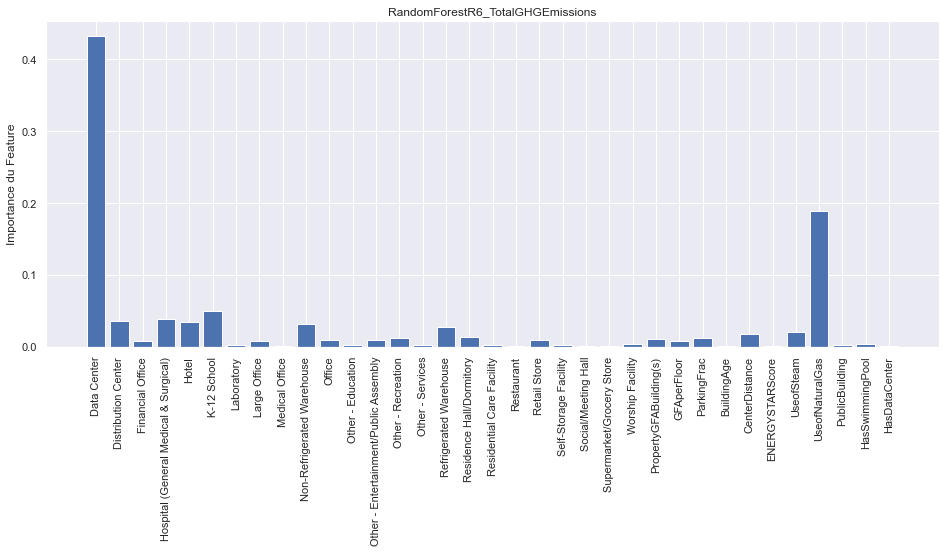

In [560]:
title = '_'.join([model_name, target]) 
fitted_estimator=model_dict[title]['estimator'].fit(X_train_1, y_train_1)
fig, ax = plt.subplots(figsize = (16, 6))
plt.bar(X_train_1.columns.values, abs(fitted_estimator.named_steps.model.regressor_.feature_importances_))
plt.title(title)
plt.ylabel('Importance du Feature')
plt.xticks(rotation = 'vertical')
plt.show()

## 10.10 Créer un Modèle pour les Emissions de CO2 - 7
(avec EnergySiteUse_pred, avec EnergyStarScore)

### 10.10.1 Features pour les Emissions de CO2

In [495]:
frachot_features = list(X_frachot.columns.values)
logscale_features = ['PropertyGFABuilding(s)', 'GFAperFloor', 'SiteEnergyUse_Pred']
log1pscale_features = ['ParkingFrac']
standardscale_features = ['BuildingAge', 'CenterDistance', 'ENERGYSTARScore']
other_features = ['UseofSteam', 'UseofNaturalGas', 'PublicBuilding', 'HasSwimmingPool', 'HasDataCenter']

features = frachot_features + logscale_features + log1pscale_features + standardscale_features + other_features

### 10.10.2 Train/Test Préparation

In [496]:
target = 'TotalGHGEmissions'
y_train_1, y_test_1 = y_train[target], y_test[target]
X_train_1, X_test_1 = X_train[features], X_test[features]

### 10.10.3 Préprocesseurs

In [499]:
preprocessor_X = create_preprocessor_X(logscale_features = logscale_features, log1pscale_features = log1pscale_features,
                                      standardscale_features = standardscale_features)
preprocessor_y = create_preprocessor_y('log1p')

### 10.10.4 Le Modèle GradientBoostingR3 -> GradientBoostingR7

In [500]:
model_name = 'GradientBoostingR7'

In [501]:
model = GradientBoostingRegressor()
param_grid = {'model__regressor__learning_rate' : np.logspace(-3,0,5)}

pipeline = build_complete_model(model, preprocessor_X, preprocessor_y)
model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train_1, y_train_1, pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [502]:
output_evaluation(model_name, targets = [target])

Model: GradientBoostingR7
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__learning_rate': 0.1778279410038923}

Le metric r2 donne :
 0.95 +/-  0.01 pour le train sets
 0.84 +/-  0.08 pour le test sets
test score / train score : 1.13

Le metric neg_mean_absolute_error donne :
-40.57 +/-  1.71 pour le train sets
-68.97 +/-  13.07 pour le test sets
test score / train score : 0.59

Le metric neg_root_mean_squared_error donne :
-134.37 +/-  13.87 pour le train sets
-221.66 +/-  72.06 pour le test sets
test score / train score : 0.61

Le metric neg_mean_absolute_percentage_error donne :
-7349531922845.10 +/-  7080071336920.81 pour le train sets
-280334423070332.81 +/-  560668846140664.12 pour le test sets
test score / train score : 0.03

Le temps d'entrainement est  297.88 +/- 5.94 ms.
__________________________________________________


#### Courbe d'Apprentissage

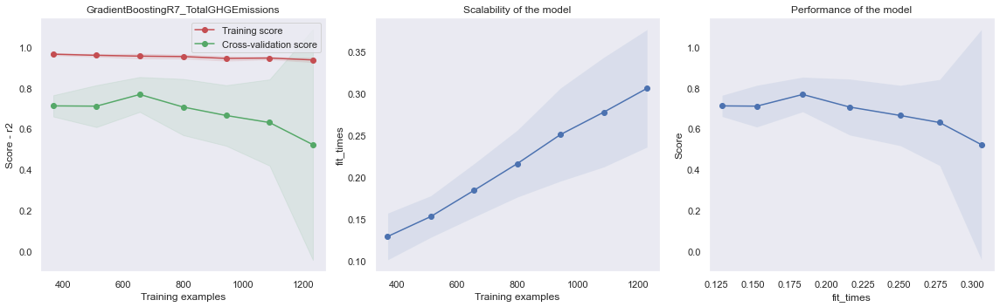

In [503]:
title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
plot_learning_curve(estimator, title, X[features], y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
plt.tight_layout()

#### Evaluation avec le Test Set

In [504]:
title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
estimator.fit(X_train_1, y_train_1)
model_dict[title]['eval_scores'] = test_evaluation(X_test_1, y_test_1, estimator, scoring_tple = scoring_tple)

In [505]:
output_test_evaluation(model_name, targets = [target])

Model: GradientBoostingR7
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.84 pour le test du modèle (cv ou gridsearch)
 0.15 pour l'évaluation avec le test set
eval score / test score : 0.17

Le metric neg_mean_absolute_error donne :
-68.97 pour le test du modèle (cv ou gridsearch)
-79.11 pour l'évaluation avec le test set
eval score / test score : 1.15

Le metric neg_root_mean_squared_error donne :
-221.66 pour le test du modèle (cv ou gridsearch)
-263.32 pour l'évaluation avec le test set
eval score / test score : 1.19

Le metric neg_mean_absolute_percentage_error donne :
-280334423070332.81 pour le test du modèle (cv ou gridsearch)
-0.70 pour l'évaluation avec le test set
eval score / test score : 0.00

__________________________________________________


#### Les Résidus

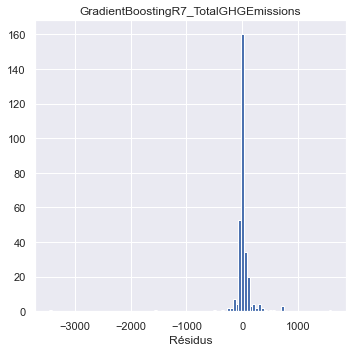

In [506]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
estimator.fit(X_train_1, y_train_1)
y_pred = estimator.predict(X_test_1)
resid = y_test_1 - y_pred
plt.hist(resid, bins = 100)
plt.xlabel('Résidus')
plt.title(title)
    
plt.tight_layout()

## 10.11 Créer un Modèle pour les Emissions de CO2 - 8
(avec EnergySiteUse_pred, avec EnergyStarScore)

### 10.11.1 Features pour les Emissions de CO2

In [535]:
frachot_features = list(X_frachot.columns.values)
logscale_features = ['PropertyGFABuilding(s)', 'GFAperFloor', 'SiteEnergyUse_Pred']
log1pscale_features = ['ParkingFrac']
standardscale_features = ['BuildingAge', 'CenterDistance', 'ENERGYSTARScore']
other_features = ['UseofSteam', 'UseofNaturalGas', 'PublicBuilding', 'HasSwimmingPool', 'HasDataCenter']

features = frachot_features + logscale_features + log1pscale_features + standardscale_features + other_features

### 10.11.2 Train/Test Préparation

In [536]:
target = 'TotalGHGEmissions'
y_train_1, y_test_1 = y_train[target], y_test[target]
X_train_1, X_test_1 = X_train[features], X_test[features]

### 10.11.3 Préprocesseurs

In [537]:
preprocessor_X = create_preprocessor_X(logscale_features = logscale_features, log1pscale_features = log1pscale_features,
                                      standardscale_features = standardscale_features)
preprocessor_y = create_preprocessor_y('log1p')

### 10.11.4 Le Modèle RandomForestR3 -> RandomForestR7

In [538]:
model_name = 'RandomForestR7'

In [539]:
model = RandomForestRegressor()
param_grid = {
              'model__regressor__n_estimators' : [7, 8, 9, 10, 15, 20, 30, 40, 50, 100],
              'model__regressor__max_depth' : [50, 60, 70, 80, 90, 100, 110]
              }

pipeline = build_complete_model(model, preprocessor_X, preprocessor_y)
model_dict['_'.join([model_name, target])] = gridsearch_evaluation(X_train_1, y_train_1, pipeline, param_grid,
                                                                       cv=cv, scoring_tple=scoring_tple, refit = scoring)

#### Evaluation de l'Entraînement

In [540]:
output_evaluation(model_name, targets = [target])

Model: RandomForestR7
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Les meilleurs parameters sont:
{'model__regressor__max_depth': 80, 'model__regressor__n_estimators': 9}

Le metric r2 donne :
 0.94 +/-  0.05 pour le train sets
 0.88 +/-  0.07 pour le test sets
test score / train score : 1.06

Le metric neg_mean_absolute_error donne :
-33.20 +/-  2.15 pour le train sets
-66.75 +/-  11.52 pour le test sets
test score / train score : 0.50

Le metric neg_root_mean_squared_error donne :
-143.33 +/-  43.91 pour le train sets
-191.77 +/-  59.59 pour le test sets
test score / train score : 0.75

Le metric neg_mean_absolute_percentage_error donne :
-6021835029625.25 +/-  4632992323362.61 pour le train sets
-159978489611865.50 +/-  319956979223729.44 pour le test sets
test score / train score : 0.04

Le temps d'entrainement est  48.14 +/- 0.29 ms.
__________________________________________________


#### Courbe d'Apprentissage

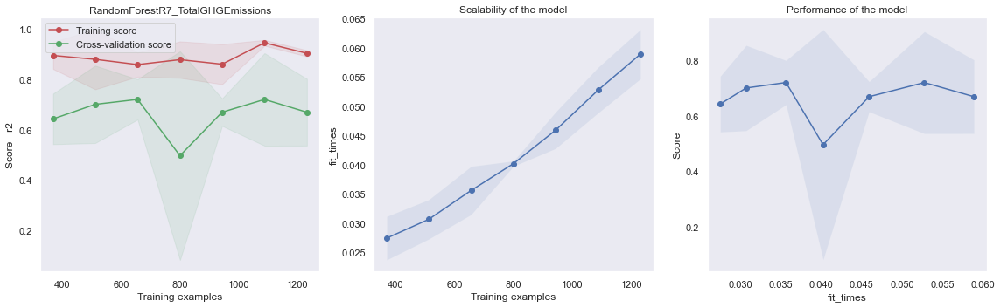

In [541]:
title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
plot_learning_curve(estimator, title, X[features], y[target], axes=axes, cv=cv, train_sizes=train_sizes, scoring = scoring)
plt.tight_layout()

#### Evaluation avec le Test Set

In [542]:
title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
estimator.fit(X_train_1, y_train_1)
model_dict[title]['eval_scores'] = test_evaluation(X_test_1, y_test_1, estimator, scoring_tple = scoring_tple)

In [543]:
output_test_evaluation(model_name, targets = [target])

Model: RandomForestR7
__________________________________________________

Variable Target: TotalGHGEmissions
--------------------------------------------------
Le metric r2 donne :
 0.88 pour le test du modèle (cv ou gridsearch)
 0.55 pour l'évaluation avec le test set
eval score / test score : 0.63

Le metric neg_mean_absolute_error donne :
-66.75 pour le test du modèle (cv ou gridsearch)
-76.85 pour l'évaluation avec le test set
eval score / test score : 1.15

Le metric neg_root_mean_squared_error donne :
-191.77 pour le test du modèle (cv ou gridsearch)
-190.48 pour l'évaluation avec le test set
eval score / test score : 0.99

Le metric neg_mean_absolute_percentage_error donne :
-159978489611865.50 pour le test du modèle (cv ou gridsearch)
-0.81 pour l'évaluation avec le test set
eval score / test score : 0.00

__________________________________________________


#### Les Résidus

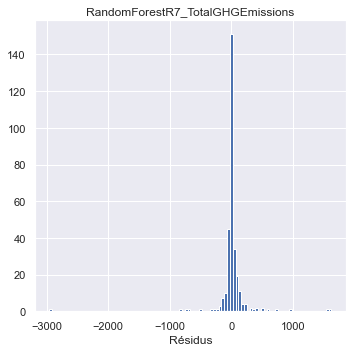

In [544]:
fig, ax = plt.subplots(1, 1, figsize=(5, 5))

title = '_'.join([model_name, target])
estimator = model_dict[title]['estimator']
estimator.fit(X_train_1, y_train_1)
y_pred = estimator.predict(X_test_1)
resid = y_test_1 - y_pred
plt.hist(resid, bins = 100)
plt.xlabel('Résidus')
plt.title(title)
    
plt.tight_layout()

# 11 Evalutation 

In [561]:
model_list_bases = ['KNR', 'GradientBoostingR', 'RandomForestR']
model_list = [m+'2' for m in model_list_bases]+[m+'3' for m in model_list_bases]+[m+'5' for m in model_list_bases]+ \
             [m+'6' for m in model_list_bases] + ['GradientBoostingR7', 'RandomForestR7']

In [562]:
targets = ['TotalGHGEmissions']
df_dict = output_model_evaluations(model_list, targets)

for target in targets:
    display(df_dict[target])

,train_r2,eval_r2,train_nMAE,eval_nMAE,train_nRMSE,eval_nRMSE,train_nMAPE,eval_nMAPE,train_time
KNR2,0.743023,0.540614,-104.046466,-98.091080,-271.021209,-193.087051,-6.311695e+14,-1.890948,7.904291
GradientBoostingR2,0.793497,0.343800,-92.814707,-106.712357,-242.071277,-230.771793,-4.305120e+14,-1.961638,89.680767
RandomForestR2,0.807990,0.344998,-94.301175,-107.218435,-249.644388,-230.561029,-6.008672e+14,-1.992915,32.400322
KNR3,0.557886,-0.253820,-105.333102,-101.738332,-370.947389,-318.993723,-5.299425e+14,-1.544281,9.697771
GradientBoostingR3,0.752505,0.510763,-98.773228,-103.140540,-262.994141,-199.261791,-1.892518e+14,-2.928482,151.943636
RandomForestR3,0.781782,0.331172,-87.978417,-96.149158,-251.984538,-232.981631,-8.631869e+13,-1.351124,127.186155
KNR5,0.790096,0.509286,-86.389719,-91.237346,-255.337431,-199.562434,-5.876130e+14,-1.272356,14.405584
GradientBoostingR5,0.842638,0.180302,-68.988080,-83.730469,-214.670188,-257.923800,-2.384884e+14,-0.779229,284.880638
RandomForestR5,0.872526,0.410645,-68.363145,-84.522722,-200.056200,-218.702104,-1.293032e+14,-0.867224,38.392258
KNR6,0.602716,0.239536,-114.460320,-105.864529,-322.006354,-248.429851,-1.095286e+15,-1.416958,17.834711


## END

<a id="Section3"></a>

<a id="Section3.1"></a>